In [2]:
import time
import numpy as np
import matplotlib.pyplot as plt
import scipy
from PIL import Image
from scipy import ndimage
from datetime import datetime
import math

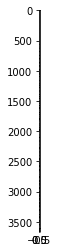

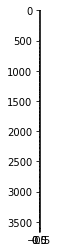

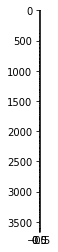

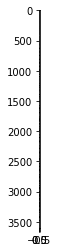

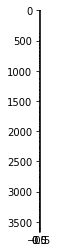

...

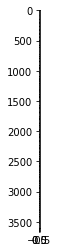

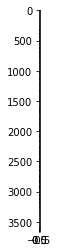

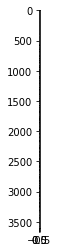

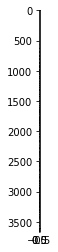

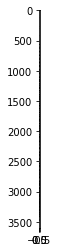

In [3]:
train_x = np.zeros((60*60,404))
train_y = np.zeros((1,404))

test_x = np.zeros((60*60,168))
test_y = np.zeros((1,168))


for i in range(30):
    my_image = str(i+1)+".gif" # change this to the name of your image file 
    train_y[0][i] = 1 # the true class of your image (1 -> cat, 0 -> non-cat)
    fname = "nottingham/" + my_image
    image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
    my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
    plt.imshow(my_image,cmap ='gray')
    plt.show()
    for j in range(60*60):
        train_x[j][i] = my_image[j][0]
        
for i in range(30):
    my_image = str(i+51)+".gif" # change this to the name of your image file 
    train_y[0][i+30] = 1 # the true class of your image (1 -> cat, 0 -> non-cat)
    fname = "nottingham/" + my_image
    image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
    my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
    
    for j in range(60*60):
        train_x[j][i+30] = my_image[j][0]
        
        
for i in range(20):
    my_image = str(i+31)+".gif" # change this to the name of your image file 
    test_y[0][i] = 1 # the true class of your image (1 -> cat, 0 -> non-cat)
    fname = "nottingham/" + my_image
    image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
    my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
    for j in range(60*60):
        test_x[j][i] = my_image[j][0]
        
for i in range(20):
    my_image = str(i+81)+".gif" # change this to the name of your image file 
    test_y[0][i+20] = 1 # the true class of your image (1 -> cat, 0 -> non-cat)
    fname = "nottingham/" + my_image
    image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
    my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
    for j in range(60*60):
        test_x[j][i+20] = my_image[j][0]

for i in range(44):
    if i < 9:
        my_image = "00" + str(i+1)+".i.jpg" # change this to the name of your image file 
    else:
        my_image = "0" + str(i+1)+".i.jpg" # change this to the name of your image file 
    fname = "manmade/" + my_image
    image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
    my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
    for j in range(60*60):
        train_x[j][i+60] = my_image[j][0]
for i in range(30):
    for j in range(10):
        my_image = str(j+1) + ".pgm"
        f_name = "s"+str(i+1)+"/" + my_image
        train_y[0][i*10+j+104] = 1
        image = image = np.array(ndimage.imread(f_name, flatten=True,mode="L"))
        my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
        for k in range(60*60):
            train_x[k][i*10+j+104] = my_image[k][0]

for i in range(28):
    my_image = "0" + str(i+45)+".i.jpg" # change this to the name of your image file 
    fname = "manmade/" + my_image
    image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
    my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
    for j in range(60*60):
        test_x[j][i+40] = my_image[j][0]

for i in range(10):
    for j in range(10):
        my_image = str(j+1) + ".pgm"
        f_name = "s"+str(i+1+30)+"/" + my_image
        test_y[0][i*10+j+68] = 1
        image = image = np.array(ndimage.imread(f_name, flatten=True,mode="L"))
        my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
        for k in range(60*60):
            test_x[k][i*10+j+68] = my_image[k][0]

    
train_x = train_x/255.
test_x = test_x/255.

#my_image = scipy.misc.imresize(image, size=(num_px,num_px)).reshape((num_px*num_px*3,1))
#my_predicted_image = predict(my_image, my_label_y, parameters)

#print ("y = " + str(np.squeeze(my_predicted_image)) + ", your L-layer model predicts a \"" + classes[int(np.squeeze(my_predicted_image)),].decode("utf-8") +  "\" picture.")

In [4]:
def initialize_parameters_deep(layers_dims):
    """
    Arguments:
    layer_dims -- python array (list) containing the size of each layer.
    
    Returns:
    parameters -- python dictionary containing your parameters "W1", "b1", ..., "WL", "bL":
                    W1 -- weight matrix of shape (layers_dims[1], layers_dims[0])
                    b1 -- bias vector of shape (layers_dims[1], 1)
                    ...
                    WL -- weight matrix of shape (layers_dims[L], layers_dims[L-1])
                    bL -- bias vector of shape (layers_dims[L], 1)
    """
    np.random.seed(0)
    parameters = {}
    L = len(layers_dims) - 1 # integer representing the number of layers
     
    for l in range(1, L + 1):
        ### START CODE HERE ### (≈ 2 lines of code)
        parameters['W' + str(l)] = np.random.randn(layers_dims[l],layers_dims[l-1]) * np.sqrt(2/layers_dims[l-1])
        parameters['b' + str(l)] = np.zeros((layers_dims[l],1))
        ### END CODE HERE ###
        
    return parameters

In [5]:
def linear_forward(A, W, b):
    """
    Implement the linear part of a layer's forward propagation.

    Arguments:
    A -- activations from previous layer (or input data): (size of previous layer, number of examples)
    W -- weights matrix: numpy array of shape (size of current layer, size of previous layer)
    b -- bias vector, numpy array of shape (size of the current layer, 1)

    Returns:
    Z -- the input of the activation function, also called pre-activation parameter 
    cache -- a python dictionary containing "A", "W" and "b" ; stored for computing the backward pass efficiently
    """
    
    ### START CODE HERE ### (≈ 1 line of code)
    Z = np.dot(W,A) + b
    ### END CODE HERE ###
    
    assert(Z.shape == (W.shape[0], A.shape[1]))
    cache = (A, W, b)
    
    return Z, cache

In [6]:
def sigmoid(Z):
    """
    Implements the sigmoid activation in numpy
    
    Arguments:
    Z -- numpy array of any shape
    
    Returns:
    A -- output of sigmoid(z), same shape as Z
    cache -- returns Z as well, useful during backpropagation
    """
    
    A = 1/(1+np.exp(-Z))
    cache = Z
    
    return A, cache

def relu(Z):
    """
    Implement the RELU function.

    Arguments:
    Z -- Output of the linear layer, of any shape

    Returns:
    A -- Post-activation parameter, of the same shape as Z
    cache -- a python dictionary containing "A" ; stored for computing the backward pass efficiently
    """
    
    A = np.maximum(0,Z)
    
    assert(A.shape == Z.shape)
    
    cache = Z 
    return A, cache


def relu_backward(dA, cache):
    """
    Implement the backward propagation for a single RELU unit.

    Arguments:
    dA -- post-activation gradient, of any shape
    cache -- 'Z' where we store for computing backward propagation efficiently

    Returns:
    dZ -- Gradient of the cost with respect to Z
    """
    
    Z = cache
    dZ = np.array(dA, copy=True) # just converting dz to a correct object.
    
    # When z <= 0, you should set dz to 0 as well. 
    dZ[Z <= 0] = 0
    
    assert (dZ.shape == Z.shape)
    
    return dZ

def sigmoid_backward(dA, cache):
    """
    Implement the backward propagation for a single SIGMOID unit.

    Arguments:
    dA -- post-activation gradient, of any shape
    cache -- 'Z' where we store for computing backward propagation efficiently

    Returns:
    dZ -- Gradient of the cost with respect to Z
    """
    
    Z = cache
    
    s = 1/(1+np.exp(-Z))
    dZ = dA * s * (1-s)
    
    assert (dZ.shape == Z.shape)
    
    return dZ



In [7]:
def linear_activation_forward(A_prev, W, b, activation):
    """
    Implement the forward propagation for the LINEAR->ACTIVATION layer

    Arguments:
    A_prev -- activations from previous layer (or input data): (size of previous layer, number of examples)
    W -- weights matrix: numpy array of shape (size of current layer, size of previous layer)
    b -- bias vector, numpy array of shape (size of the current layer, 1)
    activation -- the activation to be used in this layer, stored as a text string: "sigmoid" or "relu"

    Returns:
    A -- the output of the activation function, also called the post-activation value 
    cache -- a python dictionary containing "linear_cache" and "activation_cache";
             stored for computing the backward pass efficiently
    """
    
    if activation == "sigmoid":
        # Inputs: "A_prev, W, b". Outputs: "A, activation_cache".
        ### START CODE HERE ### (≈ 2 lines of code)
        Z, linear_cache = linear_forward(A_prev,W,b)
        A, activation_cache = sigmoid(Z)
        ### END CODE HERE ###
    
    elif activation == "relu":
        # Inputs: "A_prev, W, b". Outputs: "A, activation_cache".
        ### START CODE HERE ### (≈ 2 lines of code)
        Z, linear_cache = linear_forward(A_prev,W,b)
        A, activation_cache = relu(Z)
        ### END CODE HERE ###
    
    assert (A.shape == (W.shape[0], A_prev.shape[1]))
    cache = (linear_cache, activation_cache)

    return A, cache

In [8]:
def L_model_forward(X, parameters):
    """
    Implement forward propagation for the [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID computation
    
    Arguments:
    X -- data, numpy array of shape (input size, number of examples)
    parameters -- output of initialize_parameters_deep()
    
    Returns:
    AL -- last post-activation value
    caches -- list of caches containing:
                every cache of linear_relu_forward() (there are L-1 of them, indexed from 0 to L-2)
                the cache of linear_sigmoid_forward() (there is one, indexed L-1)
    """

    caches = []
    A = X
    L = len(parameters) // 2                  # number of layers in the neural network
    
    # Implement [LINEAR -> RELU]*(L-1). Add "cache" to the "caches" list.
    for l in range(1, L):
        A_prev = A 
        ### START CODE HERE ### (≈ 2 lines of code)
        A, cache = linear_activation_forward(A_prev,parameters["W" +str(l)], parameters["b"+str(l)], "relu")
        caches.append(cache)
        print(A)
        ### END CODE HERE ###
    
    # Implement LINEAR -> SIGMOID. Add "cache" to the "caches" list.
    ### START CODE HERE ### (≈ 2 lines of code)
    AL, cache = linear_activation_forward(A,parameters["W" +str(L)], parameters["b"+str(L)], "sigmoid")
    caches.append(cache)
    print(AL)
    ### END CODE HERE ###
    
    assert(AL.shape == (1,X.shape[1]))
            
    return AL, caches

In [9]:
def compute_cost(AL, Y):
    """
    Implement the cost function defined by equation (7).

    Arguments:
    AL -- probability vector corresponding to your label predictions, shape (1, number of examples)
    Y -- true "label" vector (for example: containing 0 if non-cat, 1 if cat), shape (1, number of examples)

    Returns:
    cost -- cross-entropy cost
    """
    
    m = Y.shape[1]

    # Compute loss from aL and y.
    ### START CODE HERE ### (≈ 1 lines of code)
    cost = -1/m*(np.dot(np.log(AL),Y.T) + np.dot(np.log(1-AL),(1-Y).T))
    ### END CODE HERE ###
    
    cost = np.squeeze(cost)      # To make sure your cost's shape is what we expect (e.g. this turns [[17]] into 17).
    assert(cost.shape == ())
    
    return cost

In [10]:
def compute_cost_with_regularization(AL, Y, parameters, lambd):
    """
    Implement the cost function with L2 regularization. See formula (2) above.
    
    Arguments:
    A3 -- post-activation, output of forward propagation, of shape (output size, number of examples)
    Y -- "true" labels vector, of shape (output size, number of examples)
    parameters -- python dictionary containing parameters of the model
    
    Returns:
    cost - value of the regularized loss function (formula (2))
    """
    m = Y.shape[1]
    
    L = len(parameters) //2
    
    cross_entropy_cost = compute_cost(AL, Y) # This gives you the cross-entropy part of the cost
    
    ### START CODE HERE ### (approx. 1 line)
    L2_regularization_cost = 0
    for i in range(L):
        L2_regularization_cost += np.sum(np.square(parameters['W'+str(i+1)]))
    ### END CODER HERE ###
    L2_regularization_cost *= lambd / (2*m) 
    cost = cross_entropy_cost + L2_regularization_cost
    
    return cost

In [11]:
def linear_backward(dZ, cache,lambd):
    """
    Implement the linear portion of backward propagation for a single layer (layer l)

    Arguments:
    dZ -- Gradient of the cost with respect to the linear output (of current layer l)
    cache -- tuple of values (A_prev, W, b) coming from the forward propagation in the current layer

    Returns:
    dA_prev -- Gradient of the cost with respect to the activation (of the previous layer l-1), same shape as A_prev
    dW -- Gradient of the cost with respect to W (current layer l), same shape as W
    db -- Gradient of the cost with respect to b (current layer l), same shape as b
    """
    A_prev, W, b = cache
    m = A_prev.shape[1]

    ### START CODE HERE ### (≈ 3 lines of code)
    dW = 1/m * np.dot(dZ,A_prev.T) + lambd/m *  W
    db = 1/m*np.sum(dZ,axis = 1,keepdims = True)
    dA_prev = np.dot(W.T,dZ)
    ### END CODE HERE ###
    
    assert (dA_prev.shape == A_prev.shape)
    assert (dW.shape == W.shape)
    assert (db.shape == b.shape)
    
    return dA_prev, dW, db

In [12]:
def linear_activation_backward(dA, cache, activation,lambd):
    """
    Implement the backward propagation for the LINEAR->ACTIVATION layer.
    
    Arguments:
    dA -- post-activation gradient for current layer l 
    cache -- tuple of values (linear_cache, activation_cache) we store for computing backward propagation efficiently
    activation -- the activation to be used in this layer, stored as a text string: "sigmoid" or "relu"
    
    Returns:
    dA_prev -- Gradient of the cost with respect to the activation (of the previous layer l-1), same shape as A_prev
    dW -- Gradient of the cost with respect to W (current layer l), same shape as W
    db -- Gradient of the cost with respect to b (current layer l), same shape as b
    """
    linear_cache, activation_cache = cache
    
    if activation == "relu":
        ### START CODE HERE ### (≈ 2 lines of code)
        dZ = relu_backward(dA,activation_cache)
        dA_prev, dW, db = linear_backward(dZ,linear_cache,lambd)
        ### END CODE HERE ###
        
    elif activation == "sigmoid":
        ### START CODE HERE ### (≈ 2 lines of code)
        dZ = sigmoid_backward(dA,activation_cache)
        dA_prev, dW, db = linear_backward(dZ,linear_cache,lambd)
        ### END CODE HERE ###
    
    return dA_prev, dW, db

In [13]:
def L_model_backward(AL, Y, caches,lambd):
    """
    Implement the backward propagation for the [LINEAR->RELU] * (L-1) -> LINEAR -> SIGMOID group
    
    Arguments:
    AL -- probability vector, output of the forward propagation (L_model_forward())
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat)
    caches -- list of caches containing:
                every cache of linear_activation_forward() with "relu" (it's caches[l], for l in range(L-1) i.e l = 0...L-2)
                the cache of linear_activation_forward() with "sigmoid" (it's caches[L-1])
    
    Returns:
    grads -- A dictionary with the gradients
             grads["dA" + str(l)] = ... 
             grads["dW" + str(l)] = ...
             grads["db" + str(l)] = ... 
    """
    grads = {}
    L = len(caches) # the number of layers
    m = AL.shape[1]
    Y = Y.reshape(AL.shape) # after this line, Y is the same shape as AL
    
    # Initializing the backpropagation
    ### START CODE HERE ### (1 line of code)
    dAL = -Y/AL + (1-Y)/(1-AL)
    ### END CODE HERE ###
    
    # Lth layer (SIGMOID -> LINEAR) gradients. Inputs: "AL, Y, caches". Outputs: "grads["dAL"], grads["dWL"], grads["dbL"]
    ### START CODE HERE ### (approx. 2 lines)
    current_cache = caches[L-1]
    grads["dA" + str(L)], grads["dW" + str(L)], grads["db" + str(L)] =  linear_activation_backward(dAL, current_cache, "sigmoid",lambd)
    ### END CODE HERE ###
    
    for l in reversed(range(L-1)):
        # lth layer: (RELU -> LINEAR) gradients.
        # Inputs: "grads["dA" + str(l + 2)], caches". Outputs: "grads["dA" + str(l + 1)] , grads["dW" + str(l + 1)] , grads["db" + str(l + 1)] 
        ### START CODE HERE ### (approx. 5 lines)
        current_cache = caches[l]
        dA_prev_temp, dW_temp, db_temp =  linear_activation_backward(grads["dA" + str(l + 2)], current_cache,"relu",lambd)
        grads["dA" + str(l + 1)] = dA_prev_temp
        grads["dW" + str(l + 1)] = dW_temp
        grads["db" + str(l + 1)] = db_temp
        ### END CODE HERE ###

    return grads

In [14]:
def update_parameters(parameters, grads, learning_rate):
    """
    Update parameters using gradient descent
    
    Arguments:
    parameters -- python dictionary containing your parameters 
    grads -- python dictionary containing your gradients, output of L_model_backward
    
    Returns:
    parameters -- python dictionary containing your updated parameters 
                  parameters["W" + str(l)] = ... 
                  parameters["b" + str(l)] = ...
    """
    
    L = len(parameters) // 2 # number of layers in the neural network

    # Update rule for each parameter. Use a for loop.
    ### START CODE HERE ### (≈ 3 lines of code)
    for i in range(L):
        parameters['W' + str(i+1)] = parameters['W' + str(i+1)] - learning_rate * grads["dW" + str(i+1)]
        parameters['b' + str(i+1)] = parameters['b' + str(i+1)] - learning_rate * grads["db" + str(i+1)]
    ### END CODE HERE ###
    return parameters

In [15]:
# GRADED FUNCTION: initialize_adam

def initialize_adam(parameters) :
    """
    Initializes v and s as two python dictionaries with:
                - keys: "dW1", "db1", ..., "dWL", "dbL" 
                - values: numpy arrays of zeros of the same shape as the corresponding gradients/parameters.
    
    Arguments:
    parameters -- python dictionary containing your parameters.
                    parameters["W" + str(l)] = Wl
                    parameters["b" + str(l)] = bl
    
    Returns: 
    v -- python dictionary that will contain the exponentially weighted average of the gradient.
                    v["dW" + str(l)] = ...
                    v["db" + str(l)] = ...
    s -- python dictionary that will contain the exponentially weighted average of the squared gradient.
                    s["dW" + str(l)] = ...
                    s["db" + str(l)] = ...

    """
    
    L = len(parameters) // 2 # number of layers in the neural networks
    v = {}
    s = {}
    
    # Initialize v, s. Input: "parameters". Outputs: "v, s".
    for l in range(L):
    ### START CODE HERE ### (approx. 4 lines)
        v["dW" + str(l+1)] = np.zeros((parameters["W"+str(l+1)].shape[0],parameters["W"+str(l+1)].shape[1]))
        v["db" + str(l+1)] = np.zeros((parameters["b"+str(l+1)].shape[0],parameters["b"+str(l+1)].shape[1]))
        s["dW" + str(l+1)] = np.zeros((parameters["W"+str(l+1)].shape[0],parameters["W"+str(l+1)].shape[1]))
        s["db" + str(l+1)] = np.zeros((parameters["b"+str(l+1)].shape[0],parameters["b"+str(l+1)].shape[1]))
    ### END CODE HERE ###
    
    return v, s


# GRADED FUNCTION: update_parameters_with_adam

def update_parameters_with_adam(parameters, grads, v, s, t, learning_rate = 0.01,
                                beta1 = 0.9, beta2 = 0.999,  epsilon = 1e-8):
    """
    Update parameters using Adam
    
    Arguments:
    parameters -- python dictionary containing your parameters:
                    parameters['W' + str(l)] = Wl
                    parameters['b' + str(l)] = bl
    grads -- python dictionary containing your gradients for each parameters:
                    grads['dW' + str(l)] = dWl
                    grads['db' + str(l)] = dbl
    v -- Adam variable, moving average of the first gradient, python dictionary
    s -- Adam variable, moving average of the squared gradient, python dictionary
    learning_rate -- the learning rate, scalar.
    beta1 -- Exponential decay hyperparameter for the first moment estimates 
    beta2 -- Exponential decay hyperparameter for the second moment estimates 
    epsilon -- hyperparameter preventing division by zero in Adam updates

    Returns:
    parameters -- python dictionary containing your updated parameters 
    v -- Adam variable, moving average of the first gradient, python dictionary
    s -- Adam variable, moving average of the squared gradient, python dictionary
    """
    
    L = len(parameters) // 2                 # number of layers in the neural networks
    v_corrected = {}                         # Initializing first moment estimate, python dictionary
    s_corrected = {}                         # Initializing second moment estimate, python dictionary
    
    # Perform Adam update on all parameters
    for l in range(L):
        # Moving average of the gradients. Inputs: "v, grads, beta1". Output: "v".
        ### START CODE HERE ### (approx. 2 lines)
        v["dW" + str(l+1)] = beta1 * v["dW" + str(l+1)] + (1-beta1) * grads["dW" + str(l+1)]
        v["db" + str(l+1)] = beta1 * v["db" + str(l+1)] + (1-beta1) * grads["db" + str(l+1)]
        ### END CODE HERE ###

        # Compute bias-corrected first moment estimate. Inputs: "v, beta1, t". Output: "v_corrected".
        ### START CODE HERE ### (approx. 2 lines)
        v_corrected["dW" + str(l+1)] = v["dW" + str(l+1)]/(1-beta1**t)
        v_corrected["db" + str(l+1)] = v["db" + str(l+1)]/(1-beta1**t)
        ### END CODE HERE ###

        # Moving average of the squared gradients. Inputs: "s, grads, beta2". Output: "s".
        ### START CODE HERE ### (approx. 2 lines)
        s["dW" + str(l+1)] = beta2 * s["dW" + str(l+1)] + (1-beta2) * (grads["dW" + str(l+1)]**2)
        s["db" + str(l+1)] = beta2 * s["db" + str(l+1)] + (1-beta2) * (grads["db" + str(l+1)]**2)
        ### END CODE HERE ###

        # Compute bias-corrected second raw moment estimate. Inputs: "s, beta2, t". Output: "s_corrected".
        ### START CODE HERE ### (approx. 2 lines)
        s_corrected["dW" + str(l+1)] = s["dW" + str(l+1)]/(1-beta2**t)
        s_corrected["db" + str(l+1)] = s["db" + str(l+1)]/(1-beta2**t)
        ### END CODE HERE ###

        # Update parameters. Inputs: "parameters, learning_rate, v_corrected, s_corrected, epsilon". Output: "parameters".
        ### START CODE HERE ### (approx. 2 lines)
        parameters["W" + str(l+1)] = parameters["W"+str(l+1)] - learning_rate * v_corrected["dW" + str(l+1)]/(np.sqrt(s_corrected["dW" + str(l+1)])+epsilon)
        parameters["b" + str(l+1)] = parameters["b"+str(l+1)] - learning_rate * v_corrected["db" + str(l+1)]/(np.sqrt(s_corrected["db" + str(l+1)])+epsilon)
        ### END CODE HERE ###

    return parameters, v, s

In [16]:

def L_layer_model(X, Y, layers_dims, learning_rate = 0.03, num_iterations = 3000, print_cost=False,lambd = 0.7):#lr was 0.009
    """
    Implements a L-layer neural network: [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID.
    
    Arguments:
    X -- data, numpy array of shape (number of examples, num_px * num_px * 3)
    Y -- true "label" vector (containing 0 if cat, 1 if non-cat), of shape (1, number of examples)
    layers_dims -- list containing the input size and each layer size, of length (number of layers + 1).
    learning_rate -- learning rate of the gradient descent update rule
    num_iterations -- number of iterations of the optimization loop
    print_cost -- if True, it prints the cost every 100 steps
    
    Returns:
    parameters -- parameters learnt by the model. They can then be used to predict.
    """

    costs = []                         # keep track of cost
    
    # Parameters initialization.
    ### START CODE HERE ###
    parameters = initialize_parameters_deep(layers_dims)
    v,s = initialize_adam(parameters)
    ### END CODE HERE ###
    
    # Loop (gradient descent)
    for i in range(0, num_iterations):

        # Forward propagation: [LINEAR -> RELU]*(L-1) -> LINEAR -> SIGMOID.
        ### START CODE HERE ### (≈ 1 line of code)
        AL, caches = L_model_forward(X, parameters)
        ### END CODE HERE ###
        
        # Compute cost.
        ### START CODE HERE ### (≈ 1 line of code)
        cost = compute_cost_with_regularization(AL, Y, parameters, lambd)
        ### END CODE HERE ###
    
        # Backward propagation.
        ### START CODE HERE ### (≈ 1 line of code)
        grads = L_model_backward(AL, Y, caches,lambd)
        ### END CODE HERE ###
 
        # Update parameters.
        ### START CODE HERE ### (≈ 1 line of code)
        #parameters,v,s = update_parameters_with_adam(parameters, grads, v, s, i+1, learning_rate,beta1 = 0.9, beta2 = 0.999,  epsilon = 1e-8)
        parameters = update_parameters(parameters,grads,learning_rate)
        ### END CODE HERE ###
                
        # Print the cost every 100 training example
        if print_cost and i % 100 == 0:
            print ("Cost after iteration %i: %f" %(i, cost))
        if print_cost and i % 100 == 0:
            costs.append(cost)
            
    # plot the cost
    plt.plot(np.squeeze(costs))
    plt.ylabel('cost')
    plt.xlabel('iterations (per tens)')
    plt.title("Learning rate =" + str(learning_rate))
    plt.show()
    
    file = open("trained_weights.txt","w")
    L = len(parameters) // 2
    for i in range(L):
        W_matrix = parameters['W' + str(i+1)].astype(np.float32)
        b_matrix = parameters['b' + str(i+1)].astype(np.float32)
        M = parameters['W' + str(i+1)].shape[0]
        N = parameters['W' + str(i+1)].shape[1]
        S = parameters['b' + str(i+1)].shape[0]
        for n in range(N):
            for m in range(M):
                file.write(str(np.squeeze(W_matrix[m][n])))
                file.write("\n")
        
        for s in range(S):
            file.write(str(np.squeeze(b_matrix[s])))
            file.write("\n")
            
    
    return parameters

In [17]:
def predict(X, y, parameters):
    """
    This function is used to predict the results of a  L-layer neural network.
    
    Arguments:
    X -- data set of examples you would like to label
    parameters -- parameters of the trained model
    
    Returns:
    p -- predictions for the given dataset X
    """
    
    m = X.shape[1]
    n = len(parameters) // 2 # number of layers in the neural network
    p = np.zeros((1,m))
    
    # Forward propagation
    probas, caches = L_model_forward(X, parameters)

    
    # convert probas to 0/1 predictions
    for i in range(0, probas.shape[1]):
        if probas[0,i] > 0.5:
            p[0,i] = 1
        else:
            p[0,i] = 0
    
    #print results
    #print ("predictions: " + str(p))
    #print ("true labels: " + str(y))
    print("Accuracy: "  + str(np.sum((p == y)/m)))
        
    return p

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.00949977
   0.01266287]
 [ 0.          0.25458395  0.         ...,  0.          0.          0.        ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.40161654  0.42599334  0.         ...,  0.07321009  0.10198801  0.        ]
 [ 0.22303901  0.10909475  0.28271172 ...,  0.0957421   0.11995455
   0.23579772]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.60550192  0.51357907  0.1646009  ...,  0.34065997  0.28542754
   0.17894994]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.17135297  0.15513242 ...,  0.14690599  0.27323248
   0.17801423]
 [ 0.44966201  0.198412    0.1824521  ...,  0.          0.          0.        ]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.32218989  0.         ...,  0.          0.          0.        ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.96995141  0.89043018  0.09296974 ...,  0.71877509  0.88166898
   0.72381451]
 [ 0.71936846  0.52974181  0.71647446 ...,  0.55160647  0.67116288
   0.76393513]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.79150357  2.27444447  1.90029849 ...,  2.75092036  3.05799461
   2.92719636]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.09975606  0.09157668  0.12582882 ...,  0.24009242  0.33592975
   0.31998472]
 [ 1.32812966  0.98270241  0.90842543 ...,  0.7964042   0.84891311
   0.79754083]]
[[ 0.         

   0.94148411]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.82587706  2.43254708  1.9111876  ...,  2.72423083  3.25055707
   3.01520264]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.19446036  0.26902566
   0.2586568 ]
 [ 1.35824067  1.08904522  0.9723867  ...,  0.72792192  0.85711574
   0.75919431]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.23812193  0.20403397  0.15856117 ...,  0.15628045  0.17367793
   0.15761675]
 [ 1.76122379  1.44826369  1.22761283 ...,  1.08039836  1.25559704
   1.12844222]
 [ 2.89821427  2.48302736  1.97589812 ...,  2.75814489  3.29872838
   3.05707699]
 [ 2.75924757  2.33228973  1.89784521 ...,  2.35522357  2.80538743
   2.58332974]]
[[ 0.92403834  0.89348318  0.8467614   0.87021871  0.87696431  0.77422197
   0.82

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.28077568  0.26214351  0.19891987 ...,  0.21827162  0.26352936
   0.23336883]
 [ 1.79557733  1.62197393  1.33155702 ...,  1.08721163  1.38503807
   1.17804469]
 [ 3.04672693  2.84495183  2.15109065 ...,  2.73310123  3.46944918
   3.12463787]
 [ 2.8044251   2.5906871   2.0131304  ...,  2.26492338  2.88461329
   2.5646189 ]]
[[ 0.94185897  0.92996277  0.87906019  0.88377577  0.9046006   0.80293459
   0.86363294  0.89392961  0.92756625  0.89741614  0.83845369  0.88968572
   0.88328717  0.82589621  0.94427299  0.89093403  0.91874322  0.88812738
   0.89392968  0.84584031  0.96913053  0.83020481  0.92441517  0.95501194
   0.92267207  0.81316794  0.94355908  0.92016782  0.90890428  0.82433381
   0.87565566  0.96862142  0.98029917  0.91721589  0.9493878   0.96746501
   0.90238726  0.93954837  0.92770591  0.91132236  0.95371248  0.81816289
   0.84037838  0.95299358  0.90401552  0.76973303  0.90583859  0.86473667

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.13323839  0.64808228  0.25768176 ...,  0.01699245  0.          0.12440612]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.34649945  1.22973376  0.31749158 ...,  1.05940238  1.44152218
   1.20037297]
 [ 1.07701854  0.85649005  0.96878583 ...,  0.81791348  1.08356526
   1.12016327]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.00678872  2.95828061  2.17238824 ...,  2.58288593  3.39321617
   3.01319745]
 ..., 
 [ 0.          0.06579583  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.02796206  0.07851754
   0.0803987 ]
 [ 1.36579896  1.2812703   1.08683032 ...,  0.5954334   0.82941037
   0.65718743]]
[[ 0.         

   2.28186866]]
[[ 0.95882456  0.95903153  0.89356027  0.89134698  0.91200483  0.81366765
   0.8848127   0.88763568  0.95326649  0.91568001  0.85687308  0.92331456
   0.91587207  0.83469033  0.96984221  0.88267993  0.94546587  0.87990562
   0.90952409  0.86454427  0.98440509  0.85543528  0.93343798  0.97450906
   0.94866053  0.82730236  0.94191333  0.94419378  0.94217438  0.81524346
   0.87622094  0.97833496  0.99205516  0.93225264  0.96894468  0.9785292
   0.89875431  0.95564453  0.92154171  0.92806416  0.96494273  0.77369159
   0.77994233  0.9688954   0.92272149  0.75139072  0.85291131  0.85620267
   0.89947631  0.98566669  0.79201928  0.95799112  0.92001669  0.916299
   0.96618974  0.9781304   0.93648021  0.94249441  0.84894061  0.8967528
   0.9508661   0.49940459  0.50564076  0.50006848  0.51391367  0.54358243
   0.49695999  0.49763719  0.50194109  0.86122905  0.55198471  0.60352254
   0.79392951  0.65499867  0.50375637  0.49704402  0.6460681   0.50962967
   0.52567809  0.49695391 

[[ 0.          0.02890775  0.39230484 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.21713456  3.30115018  2.25134663 ...,  2.37798699  3.36563718
   2.8795515 ]
 ..., 
 [ 0.          0.11397903  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.58691914  1.49285093  1.18732892 ...,  0.56604791  0.86832868
   0.65488145]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.40749225  0.55809822  0.         ...,  0.28593397  0.40672562
   0.34567403]
 [ 2.16005623  2.06377303  1.32949129 ...,  1.07687908  1.58341122
   1.27885476]
 [ 3.57414825  3.58177657  2.48345671 ...,  2.5295711   3.60016077
   3.06183093]
 [ 3.10546636  3.118472    2.04406678 ...,  1.97600302  2.83053311
   2.3758151 ]]
[[ 0.97896061  0.97945782  0.92405121  0.93063965  0.94966305  0.86444132
   0.91804296  0.91581152

   1.16011203]]
[[ 0.          0.          0.40092887 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.53370608  3.58483376  2.50754746 ...,  2.5550398   3.60050247
   3.07241001]
 ..., 
 [ 0.          0.1833617   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.76727541  1.66357456  1.30865518 ...,  0.62840219  0.9873618
   0.7229673 ]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.46290403  0.73201471  0.0251179  ...,  0.31741646  0.45056305
   0.38114976]
 [ 2.40883577  2.3028503   1.50285721 ...,  1.18471361  1.75874909
   1.39772557]
 [ 3.96622291  3.90359313  2.79195339 ...,  2.74487878  3.89547998
   3.29935227]
 [ 3.41823102  3.42540665  2.2812096  ...,  2.13035456  3.0537934
   2.54352378]]
[[ 0.98731798  0.98733888  0.946731    0.95436951  0.96756308  0.90533473
   0.935191

   1.30505709]]
[[ 0.          0.          0.2118004  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.21788901  4.17141741  3.10089242 ...,  3.1241203   4.26283449
   3.68038447]
 ..., 
 [ 0.          0.19896519  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.0771738   1.94061906  1.53690607 ...,  0.77920421  1.22883511
   0.88498898]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.57269294  0.85149524  0.26012434 ...,  0.40293008  0.55501119
   0.47410831]
 [ 2.86961579  2.70768493  1.98364363 ...,  1.47350268  2.15466159
   1.70872347]
 [ 4.78052886  4.60147656  3.49613603 ...,  3.39528919  4.67231899
   3.99826836]
 [ 4.05543098  3.97909228  2.89594836 ...,  2.60525988  3.64002402
   3.05076294]]
[[ 0.99534007  0.99475992  0.97834586  0.98142192  0.98772951  0.95996207
   0.9632

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.58180016  0.92111349  0.14470117 ...,  0.395447    0.55428415
   0.46622122]
 [ 2.90421401  2.74945323  1.87604506 ...,  1.4409448   2.14886141
   1.67190632]
 [ 4.74069427  4.56060803  3.39274549 ...,  3.25535157  4.55713658
   3.84099859]
 [ 4.01285955  3.96069201  2.74609993 ...,  2.48857795  3.53896201
   2.91763079]]
[[ 0.99570192  0.99526014  0.97600199  0.98208683  0.98783832  0.96008849
   0.95970128  0.97203715  0.99595398  0.98703088  0.97122169  0.99011833
   0.98753471  0.94856789  0.99607699  0.96688587  0.99287068  0.97523103
   0.98098647  0.95914776  0.99886808  0.97070803  0.98399084  0.99676728
   0.99157178  0.94480274  0.99128467  0.99380337  0.99459639  0.9606798
   0.97922848  0.99770812  0.99952579  0.98867109  0.99737207  0.99766956
   0.98329033  0.99333768  0.98276814  0.98737666  0.99632207  0.93700948
   0.91256848  0.99520312  0.98869101  0.90158387  0.93903724  0.96735369


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.42695192  0.93543673  0.5702679  ...,  0.14084345  0.          0.24847143]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.57866149  1.39536587  0.28252738 ...,  1.15018102  1.64206072
   1.3375132 ]
 [ 1.29955829  1.02817883  1.00484062 ...,  0.93376839  1.26109854
   1.257066  ]]
[[ 0.          0.          0.43549432 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.04268506  4.02410649  2.86785074 ...,  2.80691826  3.9425252
   3.31584514]
 ..., 
 [ 0.          0.22224457  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.06764126  1.9645099   1.4763548  ...,  0.72932824  1.18902253
   0.82625108]]
[[ 0.          0.

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.42410227  0.93600418  0.57146351 ...,  0.12976109  0.          0.23548731]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.70179972  1.48040618  0.37586801 ...,  1.28021558  1.77996537
   1.47406751]
 [ 1.34075001  1.05266886  1.02348489 ...,  0.97531552  1.30204566
   1.29839463]]
[[ 0.          0.          0.40987567 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.33682483  4.25482391  3.11344067 ...,  3.03635456  4.22285782
   3.54711648]
 ..., 
 [ 0.          0.27105921  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.1619119   2.05483894  1.53843741 ...,  0.76277477  1.28092682
   0.85804195]]
[[ 0.          0

   1.30121677]]
[[ 0.          0.          0.4529894  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.37559312  4.27596048  3.13364489 ...,  3.06317552  4.25313613
   3.5452891 ]
 ..., 
 [ 0.          0.28660717  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.19647773  2.09313905  1.55248379 ...,  0.7987255   1.32306385
   0.86575101]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.66620637  1.06362896  0.13243924 ...,  0.44140002  0.62140352
   0.50966545]
 [ 3.08512957  2.92157143  1.90556398 ...,  1.52104428  2.30009783
   1.71160243]
 [ 5.13403081  4.85471549  3.63422944 ...,  3.43926114  4.83089201
   3.97470267]
 [ 4.20832867  4.12520224  2.80888836 ...,  2.56111578  3.6647777
   2.93196721]]
[[ 0.99791565  0.99750196  0.98375938  0.99052984  0.99352424  0.97679537
   0.96835

   3.01783828]]
[[ 0.99847026  0.99811151  0.98708768  0.99291931  0.99512838  0.98218463
   0.97214909  0.98317803  0.99880773  0.99458021  0.98605998  0.99618793
   0.99417992  0.96583634  0.99849138  0.97777817  0.9968113   0.98768506
   0.99136973  0.97586468  0.99965714  0.9877865   0.99035521  0.99864924
   0.99584605  0.96354859  0.99596128  0.99777636  0.99836356  0.98376516
   0.9918655   0.99912419  0.99986708  0.9949958   0.99902757  0.99925561
   0.99161237  0.9970808   0.99108329  0.99368112  0.99887335  0.96935466
   0.95138425  0.99742463  0.99572046  0.95309205  0.95740026  0.98378266
   0.99319039  0.99964709  0.98032974  0.99891285  0.99408882  0.99530798
   0.99892736  0.9995686   0.99707138  0.99741605  0.97913579  0.98787725
   0.98953012  0.46122375  0.46122375  0.46122375  0.46122375  0.53227522
   0.5384195   0.46122375  0.46122375  0.59647383  0.46122375  0.47635636
   0.65799036  0.55443037  0.46122375  0.46122375  0.48978263  0.46844296
   0.46273516  0.46684

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.39757501  0.92054449  0.55589841 ...,  0.08904448  0.          0.19012103]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.76629083  1.50160252  0.40282634 ...,  1.3889239   1.88882156
   1.58373402]
 [ 1.36474605  1.05232988  1.00701411 ...,  1.0235228   1.34366228
   1.34273527]]
[[ 0.          0.          0.41810402 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.64321115  4.49919969  3.36836344 ...,  3.35058377  4.5641759
   3.80989524]
 ..., 
 [ 0.          0.30248168  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.31620989  2.2120771   1.64220793 ...,  0.92666509  1.46837253
   0.9624959 ]]
[[ 0.          0.

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.74971005  1.15259772  0.20790663 ...,  0.52924556  0.72556252
   0.59739206]
 [ 3.32940804  3.15614509  2.1068972  ...,  1.81145021  2.63871097
   1.97467311]
 [ 5.57053492  5.23056997  4.01128796 ...,  3.9746497   5.43645423
   4.49170114]
 [ 4.47336605  4.36147033  3.04624611 ...,  2.9261407   4.06766009
   3.26656028]]
[[ 0.99901108  0.99872973  0.9909835   0.99527833  0.99696332  0.98686853
   0.97794891  0.98736869  0.99928451  0.99629265  0.9894015   0.99749753
   0.9960827   0.97309264  0.99905347  0.98376861  0.99790848  0.99114191
   0.99436376  0.98076087  0.99980975  0.9918569   0.99272301  0.99918373
   0.99719238  0.97234459  0.99733051  0.99863661  0.99901217  0.98811653
   0.99452218  0.99951605  0.99993734  0.99690547  0.99947077  0.9996109
   0.99426947  0.99810255  0.99460922  0.99566487  0.99935522  0.97673378
   0.96378139  0.99835438  0.9972567   0.96594671  0.96598671  0.98822956


   1.35131039]]
[[ 0.          0.          0.47587953 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.66068149  4.51528782  3.4065684  ...,  3.38937647  4.62033858
   3.83694621]
 ..., 
 [ 0.          0.31205644  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.34577934  2.26220282  1.64977754 ...,  0.95566807  1.51422049
   0.98962003]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76007837  1.18615935  0.19240845 ...,  0.52473357  0.72483889
   0.59152564]
 [ 3.34441888  3.17946294  2.08832437 ...,  1.7817035   2.61581381
   1.93913622]
 [ 5.59493193  5.25280482  4.03580856 ...,  3.90501289  5.38098462
   4.40723161]
 [ 4.471545    4.37093583  3.03113916 ...,  2.86238078  4.00846141
   3.19059131]]
[[ 0.99909335  0.99884374  0.99135977  0.99567535  0.99725799  0.98768752
   0.9784

   1.25164535]]
[[ 0.          0.          0.59561528 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.31882127  4.23506996  3.1100003  ...,  3.07661834  4.26753139
   3.50124325]
 ..., 
 [ 0.          0.28674765  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.19865294  2.15471129  1.51925599 ...,  0.83162408  1.38769217
   0.87261093]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.71417056  1.11373775  0.06080537 ...,  0.48057059  0.67738495
   0.54508805]
 [ 3.12930959  3.02017335  1.82318343 ...,  1.59161805  2.41491922
   1.74948724]
 [ 5.20962755  4.95673521  3.68979634 ...,  3.54828177  4.98600222
   4.02859051]
 [ 4.15456725  4.11392875  2.70345083 ...,  2.57890079  3.69499825
   2.89461288]]
[[ 0.99859573  0.99837756  0.98620704  0.99346658  0.99594076  0.9806885
   0.97279

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.44178667  0.9633509   0.60532329 ...,  0.10944198  0.          0.20997862]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.66046349  1.37851152  0.29993852 ...,  1.40211344  1.89356715
   1.59580518]
 [ 1.36867535  1.04200358  0.98493974 ...,  1.04828647  1.36546863
   1.36532629]]
[[ 0.          0.          0.49703393 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.69610319  4.55438905  3.48140529 ...,  3.48872793  4.73384917
   3.93147743]
 ..., 
 [ 0.          0.32002749  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.36815366  2.30806684  1.67296613 ...,  0.98471632  1.55479893
   1.02276822]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.44963185  0.97056498  0.61430911 ...,  0.11493692  0.          0.21562216]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.63504833  1.35291004  0.28256937 ...,  1.40196375  1.89041934
   1.59539041]
 [ 1.38663381  1.05737909  1.00138647 ...,  1.06358192  1.38031792
   1.38133623]]
[[ 0.          0.          0.52565553 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.68111351  4.54909501  3.49288496 ...,  3.49465082  4.72914709
   3.93381498]
 ..., 
 [ 0.          0.32479565  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.42852407  2.36856482  1.72630234 ...,  1.03016447  1.60601249
   1.07208155]]
[[ 0.          0

Cost after iteration 200: 0.137228
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.45746949  0.97761301  0.62316702 ...,  0.12086387  0.          0.22176398]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.63296125  1.34706353  0.28963331 ...,  1.42458185  1.91166941
   1.61969683]
 [ 1.38813028  1.05918586  1.00414934 ...,  1.0665988   1.38264971
   1.38417911]]
[[ 0.          0.          0.54095207 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.68562222  4.56004516  3.5250401  ...,  3.51159273  4.74977826
   3.9484653 ]
 ..., 
 [ 0.          0.33836383  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.4455962   2.39439118  1.74670383 ...,  1.04513788  1.625233

   1.387123  ]]
[[ 0.          0.          0.51512327 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.70325124  4.5838645   3.57598952 ...,  3.53381901  4.77868187
   3.9660656 ]
 ..., 
 [ 0.          0.34026918  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.44763906  2.40820231  1.74677512 ...,  1.04026256  1.62225556
   1.08209307]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.80968273  1.27972363  0.22171289 ...,  0.57635971  0.78994376
   0.64443616]
 [ 3.48468752  3.3597272   2.22688489 ...,  1.92474635  2.79412873
   2.08822715]
 [ 5.76026974  5.43916602  4.31351428 ...,  4.14878277  5.6710835
   4.64358091]
 [ 4.54175414  4.48646534  3.1738716  ...,  2.99892486  4.16325059
   3.31959373]]
[[ 0.99940965  0.99928045  0.9945257   0.99723895  0.99847157  0.99132569
   0.98450

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.75692597  1.16435874  0.15133389 ...,  0.52853936  0.73628378
   0.5958516 ]
 [ 3.21543857  3.15225261  1.97395875 ...,  1.69530371  2.54471289
   1.8671236 ]
 [ 5.3681692   5.14725932  3.97513168 ...,  3.79711023  5.27155572
   4.28365096]
 [ 4.21137054  4.21088116  2.8766114  ...,  2.7104921   3.83929948
   3.03040614]]
[[ 0.99901292  0.99891501  0.99128657  0.99547919  0.99762688  0.98549878
   0.9795133   0.98124911  0.99951887  0.99674077  0.98947994  0.99801023
   0.99600819  0.97106722  0.9993147   0.97217184  0.99830168  0.98935809
   0.99441846  0.98205215  0.99987266  0.99412403  0.99188954  0.9993207
   0.9972983   0.97233114  0.99710495  0.99880465  0.99934822  0.98974187
   0.99467243  0.99944897  0.99995482  0.99654721  0.99939799  0.99970404
   0.99276316  0.99824148  0.99270239  0.99515492  0.99960058  0.97381257
   0.96856459  0.99832763  0.99778084  0.97628589  0.94927324  0.98673735


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.47840595  0.99631219  0.64721449 ...,  0.13739329  0.          0.23887338]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.58152052  1.29136816  0.26560808 ...,  1.44613866  1.92194401
   1.6390834 ]
 [ 1.38573313  1.05609581  1.00821147 ...,  1.07876164  1.38925818
   1.39506138]]
[[ 0.          0.          0.51371256 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.74060075  4.62263446  3.66462436 ...,  3.60263052  4.85764067
   4.02999095]
 ..., 
 [ 0.          0.34300357  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.46934515  2.4392519   1.77729944 ...,  1.07207746  1.65636968
   1.11459288]]
[[ 0.          0

   1.41101605]]
[[ 0.          0.          0.50234094 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.73822364  4.62705757  3.69405123 ...,  3.62741931  4.86925258
   4.04934298]
 ..., 
 [ 0.          0.33198718  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.50698339  2.47805834  1.80664672 ...,  1.09531501  1.68026709
   1.13789025]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.8347036   1.29346459  0.2655799  ...,  0.60504165  0.82286728
   0.67292928]
 [ 3.56309737  3.4506701   2.33467458 ...,  2.01225582  2.88794329
   2.17486002]
 [ 5.85424182  5.54827834  4.49189305 ...,  4.29492194  5.82560347
   4.78156115]
 [ 4.59035789  4.54515242  3.28768519 ...,  3.08810588  4.25008658
   3.40153583]]
[[ 0.99952362  0.9994269   0.99590091  0.99780007  0.99886998  0.99284236
   0.9869

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.49377599  1.00971195  0.66398235 ...,  0.14970941  0.          0.25168136]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.47485253  1.19443021  0.18116506 ...,  1.39309583  1.85240685
   1.57756684]
 [ 1.33835671  1.01745719  0.97259616 ...,  1.04084998  1.3412671
   1.35170553]]
[[ 0.          0.          0.54816457 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.55366067  4.48266973  3.54867376 ...,  3.46161444  4.6709767
   3.86412094]
 ..., 
 [ 0.          0.31342053  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.42145434  2.41348836  1.7251839  ...,  1.01229127  1.59065879
   1.04670078]]
[[ 0.          0. 

   1.41115342]]
[[ 0.          0.          0.45771886 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.78550389  4.68269275  3.79337558 ...,  3.71401174  4.94515984
   4.12913681]
 ..., 
 [ 0.          0.31608041  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.5205938   2.50149943  1.82975662 ...,  1.09924787  1.67824691
   1.13775458]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.85448544  1.2913758   0.32520907 ...,  0.62722059  0.8461626
   0.69477261]
 [ 3.60014899  3.50112304  2.42106453 ...,  2.04996031  2.92028689
   2.20800157]
 [ 5.9383912   5.65197123  4.63352088 ...,  4.41327042  5.93776455
   4.89342815]
 [ 4.62516955  4.58866527  3.38402081 ...,  3.14665532  4.2968681
   3.45292625]]
[[ 0.99959286  0.99951771  0.99675686  0.99813227  0.99908481  0.99391909
   0.988889

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.52048142  1.03240734  0.69089557 ...,  0.17144135  0.          0.27461203]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.42560597  1.14639707  0.14783125 ...,  1.37883698  1.82339965
   1.55871057]
 [ 1.30912681  0.99353719  0.96564469 ...,  1.02399595  1.31195648
   1.33009415]]
[[ 0.          0.          0.50428339 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.48231335  4.43426378  3.53847093 ...,  3.43685599  4.63000357
   3.82623134]
 ..., 
 [ 0.          0.27261871  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.33751579  2.35549179  1.67905814 ...,  0.95142976  1.51748813
   0.97701861]]
[[  0.00000000e+

[[ 0.99960888  0.99954969  0.99715192  0.99821366  0.99916664  0.99414728
   0.98978829  0.99137397  0.99984646  0.99866912  0.99539499  0.99927284
   0.99858241  0.98575977  0.9997257   0.98776816  0.99935232  0.99574512
   0.99797271  0.99188385  0.99995977  0.99804928  0.99639296  0.99972065
   0.99877184  0.9871873   0.9989958   0.99957776  0.99982484  0.99550498
   0.99759205  0.99980444  0.99998578  0.99852715  0.99979326  0.99990811
   0.99683499  0.9992019   0.99748764  0.99760336  0.99988501  0.98972976
   0.98865173  0.9992482   0.99918675  0.99089231  0.97647775  0.99402393
   0.99784855  0.99993223  0.99758048  0.99980401  0.99839247  0.99848743
   0.99980538  0.99994994  0.9994067   0.99929185  0.98681652  0.9960261
   0.97733688  0.38261006  0.38261006  0.38261006  0.38261006  0.39263347
   0.39300523  0.38261006  0.38261006  0.38261006  0.38261006  0.3882778
   0.38788742  0.38518548  0.38261006  0.38378226  0.38260965  0.38512422
   0.38261006  0.38261006  0.38244114  0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.54803912  1.05576218  0.71807443 ...,  0.19387357  0.00665624
   0.29842042]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.49248059  1.19695071  0.22364188 ...,  1.46177722  1.89968192
   1.64538438]
 [ 1.38727524  1.05806867  1.05929224 ...,  1.10394342  1.38556282
   1.41317035]]
[[ 0.          0.          0.48297951 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.79007875  4.7049124   3.87838711 ...,  3.76075018  4.97808543
   4.16728357]
 ..., 
 [ 0.          0.32682563  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.53585407  2.53128891  1.90047657 ...,  1.14178435  1.71198964
   1.17887503]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.56021072  1.06595346  0.73024146 ...,  0.20406352  0.01785195
   0.3092424 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.42173267  1.13734149  0.16601966 ...,  1.41188829  1.83971943
   1.59050241]
 [ 1.34550805  1.02426642  1.03306818 ...,  1.07377486  1.34701282
   1.3792051 ]]
[[ 0.          0.          0.51645042 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.59649073  4.55355877  3.7327197  ...,  3.59244553  4.77508789
   3.98273803]
 ..., 
 [ 0.          0.30932214  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.4725136   2.48693369  1.86482428 ...,  1.08356718  1.6452193
   1.11467126]]
[[ 0.          

   1.18938509]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.87870013  1.27549096  0.39796844 ...,  0.66150295  0.87877987
   0.72869503]
 [ 3.63386144  3.57534833  2.60000192 ...,  2.14137924  2.98911839
   2.29446471]
 [ 5.98549091  5.76224072  4.85501209 ...,  4.56245419  6.04571896
   5.03124044]
 [ 4.61232033  4.61092892  3.53829997 ...,  3.22449266  4.33119259
   3.51912984]]
[[ 0.99965697  0.99961913  0.99782634  0.99843487  0.99932067  0.99482281
   0.99119349  0.99176828  0.99988219  0.99885926  0.99603749  0.99942725
   0.99885053  0.98781135  0.99977864  0.98808305  0.9994662   0.99621605
   0.99827422  0.99320302  0.99996826  0.99850845  0.9969051   0.99975612
   0.99892567  0.98905045  0.9991755   0.99965594  0.9998784   0.99616534
   0.99782901  0.99982369  0.99998853  0.99863506  0.99981979  0.99992715
   0.99700714  0.99929177  0.99775094  0.99776256  0.99991627  0.99157469
   0.99099976  0.99932298  0.99932867  0.9928539   0.9790

[[ 0.99965856  0.99962835  0.99796377  0.99844223  0.99933942  0.99484758
   0.99153298  0.99156951  0.99988791  0.99887613  0.9961113   0.99945158
   0.99888372  0.98794919  0.99978767  0.98798948  0.99948797  0.99630899
   0.99833476  0.99357426  0.9999699   0.99860712  0.99696897  0.99975721
   0.99893718  0.98913332  0.99919356  0.99966627  0.99988758  0.9962939
   0.9978236   0.99982126  0.99998881  0.99861496  0.99981994  0.99992968
   0.99701341  0.99929611  0.99772537  0.99774123  0.99992116  0.99181979
   0.99148344  0.99932112  0.999359    0.99329501  0.9793089   0.99453137
   0.99811462  0.9999417   0.99841775  0.99982203  0.9986416   0.99858963
   0.99983982  0.99995957  0.99948792  0.999338    0.98487979  0.9962603
   0.95744327  0.36229861  0.36229861  0.36229861  0.36229861  0.36208467
   0.36225035  0.36229861  0.36229861  0.36229861  0.36229861  0.36277879
   0.36229861  0.36228354  0.36229861  0.36229861  0.36216976  0.36229861
   0.36229861  0.36229861  0.36207235  0

[[ 0.          0.          0.44083591 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.78960547  4.73321819  3.99333897 ...,  3.82675639  5.00095294
   4.22384191]
 ..., 
 [ 0.          0.31030234  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.58592402  2.59883804  2.02590619 ...,  1.20378264  1.76097     1.23965764]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.89255346  1.3279865   0.40736352 ...,  0.67495077  0.89236597
   0.74199231]
 [ 3.68993036  3.63326642  2.68875691 ...,  2.19955936  3.04193187
   2.35258992]
 [ 6.03702057  5.81320957  4.96990881 ...,  4.62199295  6.09654773
   5.08670694]
 [ 4.64602162  4.65733737  3.61884867 ...,  3.26760142  4.36338803
   3.55905079]]
[[ 0.99969466  0.99966586  0.99819347  0.99860613  0.99941581  0.99536791
   0.99213084  0.99240323  

   3.46584881]]
[[ 0.99965148  0.9996332   0.99800303  0.99841202  0.99935287  0.99470366
   0.99162578  0.99096681  0.99989417  0.99887329  0.99611004  0.99947941
   0.99891102  0.98853675  0.99979309  0.98704504  0.99948224  0.99607727
   0.99827681  0.99363659  0.99996984  0.99867924  0.99704886  0.999754
   0.99895704  0.98962602  0.9992053   0.99967527  0.99989951  0.99638069
   0.99775245  0.99980858  0.99998889  0.99851384  0.99981098  0.99993093
   0.99669975  0.99928838  0.99767272  0.99765429  0.99992749  0.99208505
   0.99171481  0.99930527  0.99935492  0.99380735  0.97840753  0.99409251
   0.99807647  0.99994089  0.99849702  0.99980977  0.99865682  0.9985314
   0.99984082  0.99995896  0.9994762   0.99929899  0.98245685  0.99598052
   0.93263559  0.35378131  0.35378131  0.35378131  0.35378131  0.35378131
   0.35378131  0.35378131  0.35378131  0.35378131  0.35378131  0.35633212
   0.35378131  0.35378131  0.35378131  0.35378131  0.35378131  0.35378131
   0.35378131  0.35378131

[[ 0.          0.          0.41870282 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.84075955  4.78781373  4.08679988 ...,  3.88212103  5.05728483
   4.27814258]
 ..., 
 [ 0.          0.31089142  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.58533365  2.60753359  2.05441628 ...,  1.2263475   1.77799114
   1.26183985]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.9093717   1.34615792  0.44786604 ...,  0.69127071  0.91060394
   0.75870134]
 [ 3.71262796  3.66491382  2.76233193 ...,  2.24204893  3.08178786
   2.3950494 ]
 [ 6.11470278  5.89662462  5.10091926 ...,  4.70456808  6.18355199
   5.16927639]
 [ 4.67677811  4.69533934  3.70412044 ...,  3.31442364  4.40707157
   3.60469796]]
[[ 0.9997316   0.9997092   0.99853308  0.99877246  0.99950274  0.99590779
   0.99297164  0.99310361

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.61871965  1.1160521   0.78726384 ...,  0.25183488  0.07098341
   0.36016593]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.42641152  1.13113913  0.21394886 ...,  1.47844403  1.87873822
   1.65586057]
 [ 1.38625802  1.0571576   1.126389   ...,  1.14444974  1.39256521
   1.44797519]]
[[ 0.          0.          0.41658147 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.84597782  4.79656551  4.11453398 ...,  3.90680146  5.07277929
   4.30159473]
 ..., 
 [ 0.          0.31591971  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.59175716  2.61719648  2.07483592 ...,  1.24141499  1.79053584
   1.27679426]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.62184773  1.11881291  0.79047283 ...,  0.25430699  0.07398418
   0.3627877 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.41119616  1.11661249  0.20647148 ...,  1.4744312   1.86957311
   1.65121663]
 [ 1.3632777   1.03745873  1.11427683 ...,  1.13363967  1.37639471
   1.43575574]]
[[ 0.          0.          0.38743649 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.77742409  4.7434649   4.07641692 ...,  3.88039123  5.01911845
   4.27172579]
 ..., 
 [ 0.          0.28355551  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.54304602  2.58168159  2.04800768 ...,  1.2125427   1.75632081
   1.24520128]]
[[ 0.         

   1.3459094 ]]
[[ 0.          0.          0.46258871 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.61409712  4.61049337  3.95402407 ...,  3.70337491  4.82526134
   4.07768215]
 ..., 
 [ 0.          0.31508262  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.43764458  2.50020665  1.96770277 ...,  1.13050928  1.66618207
   1.1554879 ]]
[[ 0.          0.          0.         ...,  0.01614152  0.          0.02287795]
 [ 0.87825237  1.3303853   0.40070104 ...,  0.66695454  0.87985394
   0.73120587]
 [ 3.52669262  3.52848901  2.62970817 ...,  2.11335747  2.92575072
   2.25153604]
 [ 5.84948728  5.69556406  4.95049332 ...,  4.49823802  5.9193274
   4.93753675]
 [ 4.43826975  4.5121007   3.54404887 ...,  3.13747056  4.1838379
   3.40702399]]
[[ 0.99962537  0.99963154  0.99819496  0.99831371  0.99937318  0.99421239
   0.991826

   3.63052492]]
[[ 0.99975392  0.99974325  0.99884942  0.99888036  0.99958418  0.99618184
   0.99376182  0.99307462  0.9999354   0.99918351  0.99723875  0.99967363
   0.99931111  0.99183088  0.999853    0.99020113  0.99963822  0.99717582
   0.99879895  0.99566742  0.99998048  0.99918294  0.99795378  0.9998178
   0.99922897  0.99261155  0.99949825  0.9997905   0.99995033  0.99754533
   0.99830236  0.99986423  0.99999303  0.9988768   0.99987394  0.9999581
   0.99750014  0.99946372  0.9984536   0.99817022  0.99995964  0.99492146
   0.9946801   0.9994796   0.99957369  0.99604995  0.98410228  0.99535844
   0.99867283  0.99995788  0.99920589  0.99987293  0.99909818  0.99888321
   0.99988453  0.99997479  0.99964649  0.9994993   0.9835978   0.99710656
   0.88836401  0.33136546  0.33136546  0.33136546  0.33136546  0.3313649
   0.33136546  0.33136546  0.33136546  0.33136546  0.33136546  0.33296322
   0.3319075   0.33136546  0.33136546  0.33136546  0.33129822  0.33136546
   0.33136546  0.33136546

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.65348196  1.14551115  0.82093567 ...,  0.28073513  0.10327203
   0.39105631]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.39806733  1.09889147  0.21876328 ...,  1.49385106  1.87435697
   1.66984996]
 [ 1.35139238  1.02615199  1.13032117 ...,  1.14385966  1.37207751
   1.44290925]]
[[ 0.          0.          0.40511643 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.86023785  4.82228582  4.23007763 ...,  3.95424721  5.09730973
   4.34177333]
 ..., 
 [ 0.          0.35057752  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.60502818  2.64836923  2.15365232 ...,  1.28869006  1.82603503
   1.32312701]]
[[ 0.         

   1.41068863]]
[[ 0.          0.          0.35554701 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.79561986  4.77169071  4.18729672 ...,  3.95118104  5.06131028
   4.33616658]
 ..., 
 [ 0.          0.29853297  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.50544002  2.56964422  2.07421438 ...,  1.22195809  1.75225385
   1.2502941 ]]
[[  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   1.57520699e-03
    0.00000000e+00   5.96716976e-03]
 [  9.25568460e-01   1.35010117e+00   5.36934153e-01 ...,   7.23226972e-01
    9.37032498e-01   7.90354778e-01]
 [  3.65463292e+00   3.65421627e+00   2.87193595e+00 ...,   2.28010595e+00
    3.08714908e+00   2.42553323e+00]
 [  6.10665173e+00   5.93843561e+00   5.27855743e+00 ...,   4.82979451e+00
    6.24326130e+00   5.28432665e+00]
 [  4.59130312e+00   4.64965671e+00   3.7995

   3.48332607]]
[[ 0.99966826  0.99968174  0.99863464  0.99851515  0.99949104  0.9947474
   0.99285483  0.98991317  0.9999228   0.99894203  0.99646906  0.99962259
   0.99914677  0.99048046  0.99982931  0.98653038  0.99955573  0.99624187
   0.99847845  0.99505414  0.99997605  0.99908915  0.99760852  0.99976375
   0.99906623  0.99107304  0.99935669  0.9997444   0.99994646  0.99703599
   0.99773713  0.99980757  0.9999915   0.99847728  0.99982813  0.99994929
   0.99648862  0.99928224  0.99795258  0.99758264  0.99995411  0.99378543
   0.9938215   0.99932306  0.99948748  0.99567889  0.97897267  0.99373507
   0.99821169  0.99994418  0.99909332  0.99982625  0.9988946   0.99849851
   0.9998598   0.99996784  0.99956162  0.99934859  0.97437053  0.99611272
   0.77891767  0.31959004  0.31959004  0.31959004  0.31959004  0.31959004
   0.31959004  0.31959004  0.31959004  0.31959004  0.31959004  0.31959004
   0.31959004  0.31959004  0.31959004  0.31959004  0.31959004  0.31959004
   0.31959004  0.319590

    4.33909366e+00   3.58090631e+00]]
[[ 0.99973973  0.9997428   0.99894948  0.99882533  0.99959793  0.9958604
   0.99385552  0.99204988  0.99993958  0.99914402  0.99716441  0.99969792
   0.99933435  0.99192145  0.99985682  0.98904477  0.99963549  0.9970127
   0.99877479  0.99593962  0.99998094  0.99925993  0.99800974  0.99980656
   0.99921587  0.99251205  0.9995023   0.99979813  0.99995995  0.9976166
   0.99816272  0.99984889  0.99999328  0.99875801  0.99986602  0.99996021
   0.99722621  0.99941269  0.99840843  0.99801519  0.99996453  0.9950336
   0.99496818  0.99944789  0.99959114  0.99638353  0.98277169  0.99486969
   0.99861111  0.99995559  0.99931087  0.99986585  0.99911324  0.99878766
   0.99988328  0.99997527  0.99964862  0.99947874  0.97862809  0.9968878
   0.79466242  0.31609234  0.31609234  0.31609234  0.31609234  0.31609234
   0.31609234  0.31609234  0.31609234  0.31609234  0.31609234  0.31609234
   0.31609234  0.31609234  0.31609234  0.31609234  0.31609234  0.31609234
   0.

   1.40526965]]
[[ 0.          0.          0.40632339 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.80769552  4.7874771   4.25535227 ...,  3.95917356  5.07548156
   4.33937493]
 ..., 
 [ 0.          0.36941793  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.5473389   2.61593723  2.14650113 ...,  1.27173891  1.79823765
   1.30181529]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.94091904  1.4667367   0.52434647 ...,  0.7355129   0.95280546
   0.80266005]
 [ 3.70532518  3.6984166   2.93431188 ...,  2.33443777  3.14260778
   2.48070428]
 [ 6.15645111  5.95704466  5.3942023  ...,  4.87018587  6.29597377
   5.32126867]
 [ 4.61566319  4.68860664  3.85709736 ...,  3.3768706   4.41216263
   3.65244478]]
[[ 0.99978002  0.99977829  0.99913786  0.99900422  0.99966357  0.99648605
   0.9945

   3.61028743]]
[[ 0.99975546  0.9997609   0.99909131  0.99889857  0.99964202  0.99605348
   0.99432619  0.9923354   0.99994596  0.99922083  0.99733506  0.99972962
   0.9994031   0.99264051  0.99986784  0.98972918  0.99966274  0.9972038
   0.99886923  0.99632527  0.99998282  0.99935133  0.99818961  0.99981718
   0.9992695   0.99316278  0.99955144  0.99981792  0.99996705  0.99782243
   0.998237    0.99986015  0.99999399  0.99880474  0.99987528  0.99996443
   0.99737144  0.99943391  0.99853796  0.99808885  0.99996948  0.99550892
   0.99552066  0.99947685  0.99963199  0.99681694  0.98383243  0.99504937
   0.9987053   0.99995826  0.99941611  0.9998765   0.99919053  0.99884067
   0.99989345  0.99997784  0.99967813  0.9995148   0.97819497  0.99707696
   0.75612841  0.30831938  0.30831938  0.30831938  0.30831938  0.30831938
   0.30831938  0.30831938  0.30831938  0.30831938  0.30831938  0.30831938
   0.30831938  0.30831938  0.30831938  0.30831938  0.30831938  0.30831938
   0.30831938  0.308319

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.66035313  1.15270374  0.83140048 ...,  0.2839139   0.10787795
   0.39396497]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.36278836  1.05761073  0.22012851 ...,  1.51723244  1.87552404
   1.69274681]
 [ 1.29998144  0.97930627  1.11959713 ...,  1.13514264  1.34094902
   1.429122  ]]
[[ 0.          0.          0.38993321 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.83891387  4.81553891  4.32234659 ...,  4.06030118  5.15497244
   4.44430538]
 ..., 
 [ 0.          0.35411263  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.57498023  2.64564523  2.19554726 ...,  1.32466778  1.84894614
   1.35715617]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.66206367  1.15450738  0.83373634 ...,  0.28454589  0.10872896
   0.3945326 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.32067127  1.02118347  0.18599065 ...,  1.48840652  1.84135627
   1.66134902]
 [ 1.24158856  0.93064181  1.0708895  ...,  1.0912897   1.29112915
   1.38126223]]
[[ 0.          0.          0.41112124 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.80912476  4.79460982  4.31032283 ...,  4.01551612  5.11476895
   4.39452729]
 ..., 
 [ 0.          0.36993723  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.51473397  2.5991823   2.14877293 ...,  1.28320162  1.80256229
   1.31181445]]
[[ 0.         

   3.73592596]]
[[ 0.99979745  0.9998005   0.99930602  0.99908062  0.9997135   0.99664509
   0.99495622  0.99348431  0.99995733  0.99936536  0.99773701  0.99978325
   0.99953345  0.99368586  0.9998906   0.99122485  0.99971649  0.9976721
   0.99907662  0.99691125  0.9999863   0.99948915  0.99847339  0.99984664
   0.99938387  0.99414874  0.99964906  0.99985635  0.99997636  0.99822154
   0.99847746  0.99988674  0.99999555  0.99900757  0.99990381  0.99997343
   0.99778402  0.99950835  0.99882813  0.99833374  0.99997711  0.99627331
   0.99638927  0.99955498  0.99970375  0.99732292  0.98604728  0.99566609
   0.99894056  0.99996529  0.99956113  0.99990515  0.99933298  0.99900118
   0.99991281  0.9999836   0.99974836  0.99961419  0.9804199   0.99766669
   0.74936036  0.29912843  0.29912843  0.29912843  0.29912843  0.29912843
   0.30115234  0.29912843  0.29912843  0.29912843  0.29912843  0.29912843
   0.29912843  0.29912843  0.29912843  0.29957041  0.29912843  0.2999458
   0.29912843  0.2991284

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.97171938  1.52803779  0.5763364  ...,  0.77740089  0.99589489
   0.84622554]
 [ 3.7618785   3.76271335  3.065566   ...,  2.45204481  3.25189784
   2.60185455]
 [ 6.2744116   6.06660524  5.61681579 ...,  5.07846392  6.49348673
   5.53485795]
 [ 4.65700839  4.73921532  3.98666255 ...,  3.49686268  4.51474199
   3.77398898]]
[[ 0.99982781  0.99982752  0.99941471  0.9992142   0.99975207  0.99711673
   0.9954762   0.99444397  0.99996421  0.99940926  0.99803316  0.99981667
   0.99961337  0.99450589  0.99990272  0.99245949  0.99974758  0.99796547
   0.99919892  0.99728735  0.9999881   0.99955886  0.99868525  0.99986661
   0.99946143  0.99495402  0.99971086  0.99988053  0.99998119  0.99849146
   0.99866608  0.9999046   0.99999619  0.99910599  0.99991709  0.99997722
   0.99805533  0.99955935  0.99902001  0.99854009  0.99998117  0.99689749
   0.99683411  0.9996132   0.99974285  0.99769517  0.98791039  0.99596753

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.97193616  1.4853139   0.61166887 ...,  0.78204211  0.99782828
   0.85091132]
 [ 3.76000335  3.77104858  3.10144165 ...,  2.46126655  3.25414267
   2.61078499]
 [ 6.25492491  6.07185333  5.61772688 ...,  5.09262765  6.48520104
   5.54795833]
 [ 4.63799646  4.72218338  4.00047047 ...,  3.50024029  4.50268022
   3.77614276]]
[[ 0.99982726  0.99982948  0.99944233  0.99920923  0.99976066  0.99709343
   0.99550839  0.99424752  0.99996513  0.99943906  0.99803687  0.99982003
   0.9996167   0.99441349  0.9999054   0.99227082  0.99975196  0.9980117
   0.99921338  0.99738105  0.99998849  0.99958221  0.99867051  0.99986441
   0.99945878  0.99482381  0.99971086  0.99988251  0.99998232  0.99851905
   0.99865089  0.9999045   0.99999629  0.99909579  0.9999169   0.99997784
   0.99809257  0.99956376  0.99901796  0.99851816  0.99998185  0.99689747
   0.99696159  0.99960829  0.99975441  0.99775671  0.98768145  0.99609378


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.66892926  1.16226129  0.84325753 ...,  0.28609204  0.11173438
   0.39590871]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.31525253  1.00796891  0.19877133 ...,  1.51856526  1.85928119
   1.693028  ]
 [ 1.25982485  0.94400434  1.10505926 ...,  1.12873145  1.31967033
   1.41971099]]
[[ 0.          0.          0.403296   ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.86316512  4.8489959   4.42177879 ...,  4.12053018  5.21267549
   4.50234574]
 ..., 
 [ 0.          0.40313328  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.58436257  2.67245163  2.25039803 ...,  1.37172323  1.89008239
   1.40574932]]
[[ 0.         

   3.85731922]]
[[ 0.99985402  0.99985458  0.99952899  0.99932067  0.9997912   0.99747673
   0.99590837  0.99498178  0.99997128  0.99949751  0.99829806  0.99984716
   0.99968469  0.99515028  0.99991621  0.99303791  0.99977686  0.99820875
   0.99929905  0.99767943  0.99999001  0.9996393   0.99886429  0.99988345
   0.99953038  0.99556914  0.99976154  0.9999031   0.99998628  0.99874595
   0.99880319  0.99992057  0.99999709  0.99921155  0.99993152  0.99998185
   0.99828384  0.99960177  0.99918542  0.99869051  0.99998555  0.99736563
   0.99731174  0.99966063  0.99978645  0.99802276  0.9887777   0.99628925
   0.99924761  0.99997361  0.99970714  0.99993326  0.99951538  0.99923266
   0.99993263  0.99998919  0.99982169  0.99972014  0.98249132  0.99823276
   0.67451585  0.28391984  0.28391984  0.28391984  0.28391984  0.283895
   0.28756625  0.28391984  0.28391984  0.28428379  0.28391984  0.28429166
   0.285572    0.28391984  0.28391984  0.28389896  0.28759727  0.28417236
   0.28397641  0.2839198

   1.36187101]]
[[ 0.          0.          0.43412319 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.52921366  4.57332902  4.13574177 ...,  3.85248187  4.88214909
   4.21278596]
 ..., 
 [ 0.          0.35371369  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.4413376   2.56080721  2.12605894 ...,  1.25419457  1.76508954
   1.28003646]]
[[ 0.          0.          0.         ...,  0.01543195  0.          0.01421458]
 [ 0.92203955  1.43749324  0.51426415 ...,  0.74305078  0.95232379
   0.80883491]
 [ 3.55718266  3.61768774  2.89163401 ...,  2.31233205  3.08685773
   2.45118243]
 [ 5.88545742  5.7833349   5.31944492 ...,  4.80266119  6.14145512
   5.2346893 ]
 [ 4.35336821  4.49386221  3.7379867  ...,  3.2815155   4.24618729
   3.54042678]]
[[ 0.99971973  0.99975334  0.99913697  0.99871557  0.99962917  0.9951231
   0.99406

   1.41100775]]
[[ 0.          0.          0.42649868 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.73588305  4.74660222  4.33858972 ...,  4.03264702  5.10167399
   4.40586621]
 ..., 
 [ 0.          0.40918883  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.56441397  2.66627858  2.24584763 ...,  1.36576915  1.88407116
   1.40022342]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.96856356  1.55566253  0.5654114  ...,  0.7835337   1.00099027
   0.85228182]
 [ 3.73363759  3.75922018  3.06852071 ...,  2.46980305  3.2641922
   2.62053118]
 [ 6.16728068  5.99300313  5.59568332 ...,  5.04864912  6.43753086
   5.49852408]
 [ 4.55577776  4.67208857  3.93957142 ...,  3.46031831  4.45530153
   3.73237524]]
[[ 0.99981819  0.99982872  0.99943633  0.99915257  0.99974818  0.99677877
   0.99537

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.67049418  1.16563727  0.84823395 ...,  0.28341867  0.1101152
   0.39279002]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.28756412  0.97863031  0.1852029  ...,  1.52270744  1.85321242
   1.69764529]
 [ 1.30171105  0.9766448   1.14966949 ...,  1.18099659  1.36852947
   1.47550673]]
[[ 0.          0.          0.40119461 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.86530328  4.85689848  4.46821537 ...,  4.17981191  5.25081349
   4.56305608]
 ..., 
 [ 0.          0.40438287  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.66894736  2.75504446  2.34631373 ...,  1.46547924  1.9887011
   1.50746085]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.67680732  1.17137381  0.8549796  ...,  0.28740842  0.11464357
   0.39696036]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.27970508  0.96917583  0.18239122 ...,  1.52704353  1.85424178
   1.70197594]
 [ 1.28056953  0.95867006  1.13128332 ...,  1.16818271  1.35306257
   1.46165514]]
[[ 0.          0.          0.3990155  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.90905625  4.89503267  4.52256691 ...,  4.2153222   5.30132218
   4.59985131]
 ..., 
 [ 0.          0.42569759  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.65746193  2.74841456  2.33925458 ...,  1.46587749  1.98817047
   1.50800702]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.01653778  1.62445192  0.63509146 ...,  0.83560302  1.05781541
   0.90793858]
 [ 3.89717336  3.90311828  3.25504337 ...,  2.6518748   3.45790023
   2.81650155]
 [ 6.4197294   6.20773381  5.87291141 ...,  5.33756095  6.74557595
   5.80657538]
 [ 4.72059449  4.81860939  4.13114204 ...,  3.6548545   4.65866601
   3.94039447]]
[[ 0.99988176  0.99988364  0.99964753  0.99943526  0.9998334   0.99784182
   0.99647949  0.99558884  0.99997856  0.99958572  0.99857603  0.99987997
   0.99976248  0.99601886  0.9999321   0.99400549  0.99980802  0.99846425
   0.99941396  0.9981255   0.9999921   0.99972849  0.99908942  0.99990428
   0.99961199  0.99640215  0.99981599  0.999928    0.99999114  0.99901481
   0.99895143  0.9999379   0.99999796  0.9993263   0.99994474  0.99998631
   0.99853285  0.99964539  0.99936179  0.99885551  0.99998996  0.99788588
   0.99784042  0.99971312  0.99983376  0.99843794  0.99006984  0.9965821


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.67846697  1.17387871  0.8585357  ...,  0.28663635  0.114481
   0.39604831]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.25420621  0.94574104  0.1632642  ...,  1.51725351  1.84014226
   1.69268468]
 [ 1.23375249  0.91992441  1.08687224 ...,  1.13808635  1.32065505
   1.43012977]]
[[ 0.          0.          0.38932644 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.83639099  4.83984947  4.47278992 ...,  4.20535403  5.26473926
   4.5903125 ]
 ..., 
 [ 0.          0.39720204  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.63132596  2.7347594   2.31836435 ...,  1.45869604  1.98482454
   1.50239498]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.68204734  1.17735009  0.86282527 ...,  0.28851796  0.11676578
   0.39797091]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.25834634  0.94655367  0.1705877  ...,  1.53170661  1.85233872
   1.70823818]
 [ 1.22385881  0.91134532  1.07756443 ...,  1.13442065  1.31573763
   1.42621169]]
[[ 0.          0.          0.38891463 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.8517632   4.85527747  4.49902781 ...,  4.23129948  5.29452252
   4.61762336]
 ..., 
 [ 0.          0.4018051   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.63242889  2.73908237  2.32150405 ...,  1.46667026  1.99408958
   1.51149515]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.68010276  1.17620205  0.86192139 ...,  0.28577646  0.11409595
   0.39494199]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.18454893  0.8850417   0.1039001  ...,  1.47170541  1.78699247
   1.64407284]
 [ 1.14948042  0.85012188  1.00655014 ...,  1.07367416  1.25130842
   1.36139603]]
[[ 0.          0.          0.41204972 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.65937689  4.69837262  4.32810541 ...,  4.04322996  5.08384926
   4.41550322]
 ..., 
 [ 0.          0.38576183  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.49972562  2.63267983  2.19808464 ...,  1.35520359  1.87720301
   1.39243885]]
[[ 0.         

   3.9769122 ]]
[[ 0.99989539  0.99989971  0.9997009   0.99948242  0.99985264  0.99800345
   0.99677766  0.99575329  0.99998207  0.99963357  0.99871519  0.99989487
   0.99979731  0.99641222  0.99994067  0.9943909   0.99982218  0.99856867
   0.99945741  0.99834222  0.99999315  0.99977006  0.99920404  0.99991337
   0.99964809  0.99679319  0.99983813  0.99994018  0.9999933   0.99914363
   0.99901176  0.99994642  0.9999984   0.99938343  0.99995028  0.9999884
   0.99866391  0.99966671  0.99943961  0.99893119  0.99999198  0.99811571
   0.99805199  0.99973906  0.99985844  0.99859996  0.99043608  0.99669101
   0.99945913  0.99997959  0.99981107  0.99995321  0.99965046  0.99938678
   0.99995559  0.99999345  0.99987991  0.99980544  0.98236895  0.99860963
   0.4941481   0.25218127  0.25218127  0.25218127  0.25218127  0.25385769
   0.25616398  0.25218127  0.25218127  0.25348115  0.25592684  0.25317315
   0.25624863  0.25218127  0.25218127  0.25313784  0.25228821  0.25605303
   0.25316897  0.252181

   1.46502105]]
[[ 0.          0.          0.36143537 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.90941732  4.91067597  4.57329843 ...,  4.29025569  5.36310525
   4.68083196]
 ..., 
 [ 0.          0.41125748  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.66960877  2.77773208  2.35282135 ...,  1.51491746  2.04987677
   1.56635982]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.03668923  1.62317247  0.69148684 ...,  0.86300303  1.08880953
   0.93786193]
 [ 3.90868403  3.93651638  3.30380487 ...,  2.70687968  3.52315416
   2.88025876]
 [ 6.47032958  6.2868478   5.96975325 ...,  5.4475954   6.86062874
   5.92690801]
 [ 4.70972103  4.82265098  4.16578094 ...,  3.69761045  4.70047513
   3.98929709]]
[[ 0.99989763  0.99990263  0.99971642  0.99948853  0.99985881  0.99802239
   0.9968

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.68698093  1.1834793   0.87134179 ...,  0.28812933  0.11741263
   0.39721539]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.16906173  0.86748625  0.0967385  ...,  1.47865531  1.78767852
   1.65200948]
 [ 1.13856958  0.83994719  0.99290491 ...,  1.07533519  1.25261186
   1.36442574]]
[[ 0.          0.          0.4128567  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.64241189  4.69039996  4.33925175 ...,  4.04598346  5.08457452
   4.41778056]
 ..., 
 [ 0.          0.39500578  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.49932949  2.63981333  2.19976439 ...,  1.36852172  1.89519362
   1.40961982]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.69101758  1.18724112  0.8759652  ...,  0.29061959  0.12030249
   0.39982793]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.23821959  0.92327081  0.1619242  ...,  1.54195489  1.85332027
   1.72028429]
 [ 1.23473953  0.91921607  1.08024697 ...,  1.1580454   1.34082274
   1.45391644]]
[[ 0.          0.          0.35218137 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.86744945  4.87871246  4.55463445 ...,  4.28005029  5.34340588
   4.6698646 ]
 ..., 
 [ 0.          0.4107217   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.65823692  2.77380296  2.34749431 ...,  1.50666553  2.04354323
   1.55934526]]
[[ 0.         

   1.4437044 ]]
[[ 0.          0.          0.37647218 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.85322054  4.86847919  4.54660185 ...,  4.27289318  5.33073243
   4.66200828]
 ..., 
 [ 0.          0.41984384  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.66670407  2.78376396  2.35374113 ...,  1.51766978  2.05795545
   1.57226859]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.03634799  1.63719588  0.68537861 ...,  0.86827646  1.09378114
   0.94372679]
 [ 3.89626402  3.93516316  3.29511865 ...,  2.71136807  3.5292065
   2.8877399 ]
 [ 6.42522828  6.25687788  5.95827116 ...,  5.44591454  6.84723516
   5.92578119]
 [ 4.66317486  4.79119489  4.13556227 ...,  3.68158951  4.67577852
   3.97355509]]
[[ 0.99989554  0.99990346  0.99971959  0.99946941  0.99985707  0.99790287
   0.99679

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.04957346  1.63460726  0.73414929 ...,  0.88305079  1.11178672
   0.95960849]
 [ 3.90374185  3.9457738   3.33444001 ...,  2.73372884  3.5569492
   2.91231223]
 [ 6.4977597   6.32669901  6.03848615 ...,  5.52950104  6.94856233
   6.01547353]
 [ 4.69156191  4.81526348  4.18801746 ...,  3.72287683  4.72595156
   4.01810088]]
[[ 0.9999058   0.99991224  0.99975655  0.99951681  0.99987378  0.99809002
   0.99698942  0.99586483  0.99998495  0.99966459  0.99881283  0.99990841
   0.99982988  0.99666544  0.99995087  0.99484278  0.99984372  0.99870523
   0.99952321  0.9985654   0.99999436  0.99981368  0.99929053  0.99992382
   0.99968331  0.99702065  0.99985927  0.99995065  0.99999493  0.9992347
   0.99905777  0.9999539   0.99999883  0.99942808  0.99995774  0.99999105
   0.99882301  0.99969439  0.99950618  0.99898998  0.99999368  0.99823573
   0.99829531  0.99976204  0.99988324  0.9987452   0.99105624  0.9967432
  

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.03602453  1.57264518  0.72768261 ...,  0.87418585  1.0997056
   0.9500417 ]
 [ 3.84451769  3.90545179  3.28603309 ...,  2.69196635  3.50817253
   2.86791263]
 [ 6.401565    6.27015251  5.95738805 ...,  5.46461204  6.86031483
   5.94531401]
 [ 4.61556567  4.74926797  4.12483361 ...,  3.6697263   4.65804042
   3.96100148]]
[[ 0.99989217  0.99990299  0.99972793  0.99944579  0.99985919  0.99779634
   0.99681914  0.99510299  0.99998326  0.99963636  0.99866762  0.9998987
   0.99980746  0.99633755  0.99994704  0.99402608  0.99982884  0.99854737
   0.99946167  0.99845546  0.99999375  0.99979973  0.99921814  0.99991537
   0.99965076  0.99668185  0.9998374   0.99994498  0.99999445  0.99914303
   0.99893261  0.99994733  0.99999871  0.99935835  0.99995175  0.99999
   0.99866253  0.99965615  0.99942884  0.9988589   0.999993    0.99798862
   0.99813121  0.99973184  0.99987241  0.9986142   0.98984299  0.99642132
   0

   1.48515593]]
[[ 0.          0.          0.35532972 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.91623064  4.92944084  4.62694049 ...,  4.34662674  5.41462972
   4.74117998]
 ..., 
 [ 0.          0.41923085  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.72777423  2.84191949  2.41147085 ...,  1.58204669  2.13071264
   1.64460614]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.06118109  1.65978605  0.72858425 ...,  0.89352912  1.12348775
   0.97108991]
 [ 3.97785554  4.01374844  3.39237904 ...,  2.79874394  3.62898399
   2.98450988]
 [ 6.5376757   6.36707697  6.09037724 ...,  5.56794133  6.98818538
   6.05775526]
 [ 4.72993748  4.85480825  4.22203162 ...,  3.75859344  4.76270783
   4.05795552]]
[[ 0.99991581  0.9999218   0.99978118  0.99956026  0.99988369  0.99825673
   0.9972

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7012458   1.19811276  0.89019001 ...,  0.293554    0.12458039
   0.40248455]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.20932234  0.89299442  0.14467131 ...,  1.54669564  1.84973951
   1.72622874]
 [ 1.21604517  0.90314079  1.05535072 ...,  1.15303792  1.33671866
   1.45106433]]
[[ 0.          0.          0.3614664  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.89605018  4.91331619  4.61889626 ...,  4.32826339  5.40010689
   4.72117427]
 ..., 
 [ 0.          0.43046746  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.68501566  2.80883183  2.37460435 ...,  1.54942746  2.09716899
   1.61029221]]
[[ 0.         

   1.66368253]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07277748  1.69242013  0.74440485 ...,  0.90901268  1.14122366
   0.98792693]
 [ 4.00007082  4.03458533  3.4221968  ...,  2.83388469  3.6701824
   3.02430708]
 [ 6.58580109  6.40422705  6.15598163 ...,  5.64453461  7.07342578
   6.14093838]
 [ 4.74875557  4.87472781  4.25302933 ...,  3.79776566  4.80596956
   4.10134844]]
[[ 0.99992318  0.99992833  0.99980477  0.9995948   0.99989426  0.99836984
   0.99740041  0.99648971  0.99998815  0.99972084  0.99900408  0.99992548
   0.99986787  0.99721593  0.99995861  0.99555651  0.99986716  0.99888686
   0.9995891   0.99879363  0.99999537  0.99984931  0.99941811  0.99993641
   0.99973662  0.9975481   0.99988816  0.99996168  0.99999636  0.99937827
   0.99917223  0.9999635   0.99999914  0.99951367  0.99996667  0.99999288
   0.99900365  0.99972922  0.99960272  0.99913584  0.99999524  0.99853163
   0.99854031  0.99979785  0.99990421  0.99893343  0.99194

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.70368672  1.20096397  0.89402227 ...,  0.29343282  0.12493632
   0.40219322]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2256497   0.90455879  0.16074704 ...,  1.56829959  1.87023457
   1.75001757]
 [ 1.23922705  0.9220748   1.07235743 ...,  1.17435289  1.36041643
   1.47501099]]
[[ 0.          0.          0.32859213 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.92194698  4.93804265  4.65013137 ...,  4.37258317  5.43923873
   4.76912591]
 ..., 
 [ 0.          0.41668918  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.7095436   2.83370222  2.39517101 ...,  1.57223019  2.12565411
   1.63701388]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.70609228  1.20333239  0.89719871 ...,  0.29445391  0.1261531
   0.40317514]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.20173258  0.88329949  0.14098684 ...,  1.55570645  1.85501175
   1.73671923]
 [ 1.22213805  0.90826429  1.05628374 ...,  1.16128392  1.34718945
   1.46160869]]
[[ 0.          0.          0.3666595  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.89913682  4.92099429  4.63792637 ...,  4.37221688  5.43782001
   4.76903548]
 ..., 
 [ 0.          0.4355392   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.71930097  2.84440546  2.40568139 ...,  1.58489168  2.14138104
   1.65197742]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.70791222  1.20530547  0.89962578 ...,  0.29475741  0.1267364
   0.40343263]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.19325045  0.87541174  0.13355615 ...,  1.55193912  1.84970724
   1.7329744 ]
 [ 1.21996448  0.90623657  1.05194438 ...,  1.1594971   1.34565679
   1.46019728]]
[[ 0.          0.          0.31869381 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.87439427  4.90304594  4.6190566  ...,  4.35049575  5.41065881
   4.74595286]
 ..., 
 [ 0.          0.40188791  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.66902661  2.80489427  2.3593627  ...,  1.54424989  2.09926581
   1.60918212]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.08402397  1.67536951  0.77592197 ...,  0.92469842  1.15821177
   1.00529597]
 [ 4.01961779  4.06619934  3.46095199 ...,  2.86910404  3.71228973
   3.06637583]
 [ 6.60657302  6.4480548   6.19958008 ...,  5.70093955  7.12675277
   6.20401393]
 [ 4.74211118  4.87405722  4.26938348 ...,  3.81760763  4.82276458
   4.12563497]]
[[ 0.99992904  0.99993518  0.99982649  0.99961347  0.99990314  0.99843158
   0.99760979  0.99658471  0.99998954  0.99975019  0.99906654  0.99993188
   0.99988257  0.9974026   0.99996324  0.99576152  0.99987847  0.99896635
   0.9996158   0.99890267  0.9999959   0.9998683   0.99947067  0.99994241
   0.99975717  0.99772262  0.99989787  0.99996634  0.99999697  0.99942921
   0.99920167  0.99996707  0.99999929  0.99953926  0.99997024  0.99999379
   0.99908167  0.99974357  0.99963393  0.99917514  0.99999591  0.99860137
   0.99864517  0.99981123  0.9999154   0.99900559  0.99213394  0.99717404

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.70791481  1.20609446  0.90103665 ...,  0.2928635   0.12527975
   0.40130402]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.21494442  0.89161988  0.15481625 ...,  1.57998693  1.87813067
   1.76379825]
 [ 1.27312827  0.94969518  1.09789717 ...,  1.20589     1.39602965
   1.51081571]]
[[ 0.          0.          0.33988857 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.9247145   4.94329517  4.67300745 ...,  4.4329364   5.4844845
   4.83537406]
 ..., 
 [ 0.          0.42023332  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.79548022  2.91241568  2.47507105 ...,  1.65021034  2.21597204
   1.72502309]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.70526927  1.2043089   0.89921893 ...,  0.2893949   0.121805
   0.39750703]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.1844046   0.86597863  0.12743542 ...,  1.55712138  1.8530133
   1.73956168]
 [ 1.27115809  0.94776519  1.09463668 ...,  1.2061467   1.39673433
   1.51152831]]
[[ 0.          0.          0.37007945 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.86085265  4.89205589  4.61867102 ...,  4.36784257  5.4160821
   4.76599972]
 ..., 
 [ 0.          0.42080342  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.7856655   2.90555819  2.46549672 ...,  1.6452185   2.21228334
   1.72073133]]
[[ 0.          0. 

   1.50007143]]
[[ 0.          0.          0.32227853 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.94834482  4.9673628   4.70444358 ...,  4.43469363  5.50492857
   4.83740128]
 ..., 
 [ 0.          0.42410098  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.75951784  2.8850664   2.44214545 ...,  1.62857528  2.19475133
   1.70328221]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09361195  1.69835298  0.79336576 ...,  0.93316169  1.16975978
   1.01463832]
 [ 4.03465257  4.08178491  3.48370112 ...,  2.88613754  3.73640936
   3.08686715]
 [ 6.63705228  6.47552451  6.24264796 ...,  5.72880642  7.16741453
   6.23505996]
 [ 4.74715404  4.88189615  4.28526079 ...,  3.82472745  4.83569795
   4.1347425 ]]
[[ 0.99993384  0.99993972  0.99984116  0.99963273  0.99990923  0.99849633
   0.9976

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.71412338  1.21228171  0.90844383 ...,  0.29491459  0.12816646
   0.40331072]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.20823174  0.88428707  0.1504998  ...,  1.58401269  1.87993399
   1.76890615]
 [ 1.25168584  0.93160798  1.07432161 ...,  1.19077564  1.38104315
   1.49572074]]
[[ 0.          0.          0.33455687 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.93770067  4.95822207  4.6968798  ...,  4.44690074  5.5123586
   4.85127747]
 ..., 
 [ 0.          0.42759731  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.76997547  2.89579359  2.451199   ...,  1.63916902  2.20839213
   1.71563998]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.71421112  1.21276789  0.9090624  ...,  0.29372594  0.12716503
   0.40197433]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.18753443  0.86695061  0.13145111 ...,  1.5673123   1.86095174
   1.75113182]
 [ 1.25425617  0.93372901  1.07550901 ...,  1.19395679  1.38457906
   1.49951465]]
[[ 0.          0.          0.34490455 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.92579672  4.95239442  4.68873948 ...,  4.42134909  5.4835827
   4.82391134]
 ..., 
 [ 0.          0.43160961  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.77349834  2.90072421  2.45521642 ...,  1.64267881  2.21321261
   1.72026919]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.71673452  1.21511595  0.91188013 ...,  0.29516573  0.12888815
   0.40348081]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2004412   0.87671816  0.14380393 ...,  1.58290731  1.87679159
   1.76813428]
 [ 1.25433367  0.93353734  1.07493457 ...,  1.19470315  1.38552203
   1.50049301]]
[[ 0.          0.          0.3417912  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.95711283  4.97801472  4.7211386  ...,  4.46700157  5.53270946
   4.87343771]
 ..., 
 [ 0.          0.43856364  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.79142836  2.91623095  2.47227012 ...,  1.66019506  2.23283839
   1.73968971]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.71875817  1.21704509  0.91433524 ...,  0.29606167  0.12995594
   0.40435811]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.19017953  0.86741566  0.13557849 ...,  1.57799934  1.87032366
   1.76281149]
 [ 1.24824269  0.92858439  1.068987   ...,  1.18944371  1.37994189
   1.4949867 ]]
[[ 0.          0.          0.3266532  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.95350906  4.97736448  4.72311762 ...,  4.44818932  5.52233019
   4.85264944]
 ..., 
 [ 0.          0.43785684  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.76715447  2.89758633  2.45192966 ...,  1.6383483   2.20968021
   1.71644234]]
[[ 0.         

   1.51143385]]
[[ 0.          0.          0.32387532 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.98869713  5.00646653  4.75672917 ...,  4.51054003  5.5749141
   4.91948907]
 ..., 
 [ 0.          0.43157621  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.80883816  2.93377595  2.48916706 ...,  1.67911426  2.25490706
   1.76104629]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.1150266   1.72869133  0.81567305 ...,  0.95970724  1.19803071
   1.04355796]
 [ 4.09859369  4.14368541  3.5489933  ...,  2.96310115  3.82135402
   3.17292834]
 [ 6.72093778  6.55477218  6.33891316 ...,  5.85199502  7.29072926
   6.36918014]
 [ 4.78977145  4.92409634  4.33501564 ...,  3.89365388  4.90371464
   4.21099409]]
[[ 0.9999445   0.9999493   0.99986808  0.99968108  0.9999213   0.99868839
   0.99790

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.72087679  1.2194784   0.91766133 ...,  0.29581818  0.13013538
   0.40395637]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.19098491  0.86648306  0.13655124 ...,  1.58681225  1.87819631
   1.77286075]
 [ 1.26101068  0.93942808  1.0779178  ...,  1.20120532  1.39376324
   1.50859627]]
[[ 0.          0.          0.32676839 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.98426461  5.00539458  4.75709309 ...,  4.49516466  5.56972194
   4.90382485]
 ..., 
 [ 0.          0.44693049  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.80726331  2.9349517   2.48878135 ...,  1.67457058  2.25184481
   1.75726167]]
[[ 0.         

   1.7653581 ]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.11545669  1.74244667  0.81532345 ...,  0.95855766  1.19907983
   1.0428114 ]
 [ 4.096694    4.14561822  3.54940601 ...,  2.95949313  3.82304379
   3.17149355]
 [ 6.70649651  6.54626593  6.33529841 ...,  5.83029224  7.27887493
   6.34856419]
 [ 4.77449971  4.91656655  4.32551039 ...,  3.87577114  4.89074881
   4.19399783]]
[[ 0.99994419  0.99994975  0.99986886  0.99967592  0.99992113  0.9986632
   0.99791434  0.99715265  0.99999227  0.99979617  0.99923613  0.99994642
   0.99991473  0.99788103  0.99997167  0.99641262  0.99990151  0.99914243
   0.99968769  0.9991068   0.99999689  0.99990108  0.99958793  0.99995464
   0.99980522  0.99815837  0.99992201  0.99997583  0.99999802  0.99954854
   0.99929218  0.99997525  0.99999954  0.99961298  0.99997813  0.99999539
   0.99925566  0.99977944  0.99971341  0.99930139  0.99999715  0.99882902
   0.99884971  0.99984174  0.99993545  0.99915965  0.99292

   1.41765211]]
[[ 0.          0.          0.3607487  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.68185663  4.75689686  4.48361891 ...,  4.22708739  5.25619628
   4.61673697]
 ..., 
 [ 0.          0.40277128  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.61928271  2.78229161  2.31595691 ...,  1.51583424  2.08560517
   1.5882255 ]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05072741  1.63667349  0.73193087 ...,  0.90044476  1.1328622
   0.98043721]
 [ 3.83455721  3.9365939   3.2885437  ...,  2.72976075  3.57164971
   2.92519557]
 [ 6.31143199  6.2397807   5.97170027 ...,  5.47547768  6.87239276
   5.96758904]
 [ 4.48119958  4.66930331  4.04256333 ...,  3.61523396  4.59733231
   3.91438078]]
[[ 0.9998959   0.99991644  0.99976232  0.9994009   0.99986726  0.9974794
   0.996890

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.72069462  1.22025664  0.9190219  ...,  0.29291827  0.12773177
   0.40071602]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.10076341  0.79104048  0.05434377 ...,  1.51873185  1.80408951
   1.70077041]
 [ 1.16846107  0.86350406  0.99017843 ...,  1.12383564  1.31288002
   1.42657081]]
[[ 0.          0.          0.36570188 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.73906348  4.80636402  4.53944969 ...,  4.28141865  5.32191747
   4.67579806]
 ..., 
 [ 0.          0.42009823  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.65769444  2.81623109  2.35214608 ...,  1.55130707  2.12516813
   1.62733175]]
[[ 0.         

   1.5272813 ]]
[[ 0.          0.          0.31065382 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.9983625   5.02227035  4.777057   ...,  4.53386019  5.60511483
   4.94833201]
 ..., 
 [ 0.          0.43844701  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.83698112  2.96662553  2.51516448 ...,  1.70670941  2.29323315
   1.79568837]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.12891468  1.75228342  0.84111255 ...,  0.9745606   1.21704389
   1.06062804]
 [ 4.13290742  4.18314927  3.59340998 ...,  3.00176285  3.87308919
   3.22024348]
 [ 6.7607345   6.60060557  6.39061294 ...,  5.90456048  7.35883491
   6.43169658]
 [ 4.80097161  4.94245034  4.3588029  ...,  3.91555856  4.93375881
   4.2395936 ]]
[[ 0.99994994  0.9999549   0.99988326  0.99970167  0.99992831  0.998765
   0.998058

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.72618921  1.22545996  0.92490128 ...,  0.29545036  0.13111372
   0.40335389]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.15166037  0.83207773  0.10031099 ...,  1.56908826  1.8571831
   1.75565739]
 [ 1.22970826  0.9142212   1.04312995 ...,  1.17693998  1.37099305
   1.48466406]]
[[ 0.          0.          0.32527925 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.90411405  4.94550371  4.69554982 ...,  4.45267323  5.51848783
   4.86180984]
 ..., 
 [ 0.          0.43298257  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.76033733  2.90484296  2.44596266 ...,  1.64397552  2.22785885
   1.72920951]]
[[ 0.          

   1.50248179]]
[[ 0.          0.          0.31508056 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.9681289   4.99993552  4.7557988  ...,  4.51603967  5.5874702
   4.92928839]
 ..., 
 [ 0.          0.44584911  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.80726367  2.9450112   2.48857472 ...,  1.68314974  2.27073933
   1.7716422 ]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.12554328  1.76062259  0.83645459 ...,  0.97330083  1.21678269
   1.05940623]
 [ 4.09945392  4.15823824  3.56324839 ...,  2.97801893  3.85087326
   3.19593707]
 [ 6.72440431  6.57261176  6.36527052 ...,  5.88348108  7.33997881
   6.40956206]
 [ 4.76124976  4.91300918  4.32526724 ...,  3.88809988  4.90607947
   4.21079194]]
[[ 0.99994736  0.9999535   0.99987874  0.99968365  0.99992498  0.99868288
   0.99795

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.72739551  1.22705866  0.92711947 ...,  0.29457271  0.13070768
   0.4023006 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.12951226  0.81311341  0.08026094 ...,  1.55542775  1.84135552
   1.74126988]
 [ 1.22191864  0.90820217  1.03385786 ...,  1.16984275  1.36433669
   1.47749186]]
[[ 0.          0.          0.34293487 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.86463087  4.91582818  4.66449095 ...,  4.40993066  5.47162575
   4.81584822]
 ..., 
 [ 0.          0.44245143  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.75699212  2.90567143  2.44342477 ...,  1.63919336  2.22564289
   1.72531361]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.72878079  1.2284619   0.92882436 ...,  0.29486588  0.13127868
   0.40257704]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.12991559  0.81292112  0.08049195 ...,  1.55868714  1.84438153
   1.74512835]
 [ 1.21981202  0.90646778  1.03100912 ...,  1.1682429   1.36314013
   1.47610953]]
[[ 0.          0.          0.34373018 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.87583559  4.92672533  4.67709342 ...,  4.41882142  5.48458402
   4.8261536 ]
 ..., 
 [ 0.          0.44795849  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.76228737  2.9115433   2.44914671 ...,  1.64363875  2.23169374
   1.73082911]]
[[ 0.         

   4.24022249]]
[[ 0.99995149  0.9999573   0.99988978  0.99970333  0.99993047  0.9987612
   0.99806468  0.99740141  0.99999364  0.99982048  0.99932132  0.99995316
   0.99992947  0.99811029  0.99997636  0.99671302  0.99991432  0.9992306
   0.99972623  0.99921411  0.99999742  0.99991788  0.99964654  0.99996146
   0.99982854  0.99836312  0.99993318  0.99998025  0.99999847  0.99960281
   0.99934503  0.99997953  0.99999967  0.99965071  0.99998215  0.99999634
   0.99936046  0.9998023   0.99975399  0.99936342  0.99999775  0.9989234
   0.99895193  0.99985933  0.99994601  0.99922923  0.99326223  0.99738238
   0.99972991  0.99999032  0.99991675  0.99998055  0.99982457  0.9996361
   0.99998434  0.99999813  0.9999553   0.99992428  0.98497914  0.99923705
   0.20491944  0.17031297  0.17031297  0.17031297  0.17031297  0.17044418
   0.17043704  0.17031297  0.17031297  0.1704177   0.17048747  0.17031297
   0.17031297  0.17031297  0.17031297  0.17031508  0.17056838  0.17165862
   0.17031297  0.17031297 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.73355994  1.23289469  0.93410475 ...,  0.29716699  0.13417985
   0.40493935]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.15884762  0.83545932  0.10688433 ...,  1.58996734  1.87584873
   1.7790784 ]
 [ 1.243067    0.92549964  1.05107522 ...,  1.18863984  1.38468234
   1.49840877]]
[[ 0.          0.          0.31741906 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.96822117  5.00686732  4.76733403 ...,  4.52001582  5.59636669
   4.93557207]
 ..., 
 [ 0.          0.44470981  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.80255803  2.94694192  2.48776082 ...,  1.68604267  2.27802004
   1.77768098]]
[[ 0.         

   4.28009303]]
[[ 0.99995663  0.99996144  0.99990195  0.99973136  0.99993746  0.99888564
   0.99820107  0.99766567  0.99999434  0.99983921  0.9993831   0.99995792
   0.99993801  0.99827359  0.99997852  0.99704621  0.99992146  0.99930104
   0.99975077  0.99927717  0.99999771  0.99992625  0.99967967  0.99996557
   0.99984451  0.99850676  0.99994149  0.99998258  0.99999867  0.99964247
   0.99940592  0.99998191  0.99999971  0.99968144  0.9999843   0.99999672
   0.99943109  0.99981981  0.99978188  0.99942263  0.99999801  0.99901949
   0.99903903  0.99987313  0.99995151  0.99929637  0.99380369  0.99759117
   0.99975851  0.99999138  0.99992565  0.99998268  0.99984182  0.99967196
   0.99998596  0.99999835  0.99995986  0.9999322   0.98626472  0.9993071
   0.20669965  0.16620513  0.16620513  0.16620513  0.16620513  0.16728465
   0.16775759  0.16620513  0.16620513  0.1665667   0.16823964  0.16620513
   0.16690936  0.16620513  0.16620513  0.16658035  0.16672453  0.16876624
   0.16620513  0.166205

   1.51722471]]
[[ 0.          0.          0.32573591 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.92142365  4.96826182  4.72788707 ...,  4.50481867  5.56602518
   4.92046434]
 ..., 
 [ 0.          0.43600485  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.8289997   2.97065488  2.51174213 ...,  1.70718973  2.30332575
   1.80181288]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.1287857   1.75160957  0.83584665 ...,  0.98192554  1.22628768
   1.06966915]
 [ 4.10821048  4.17719256  3.57395661 ...,  3.0016425   3.87965661
   3.22636307]
 [ 6.69391335  6.56758149  6.35623365 ...,  5.89313132  7.34384026
   6.42515951]
 [ 4.72829929  4.89034675  4.30240852 ...,  3.88241085  4.89528421
   4.20900903]]
[[ 0.99994738  0.99995492  0.99988114  0.99967373  0.99992591  0.99863049
   0.9979

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.73399521  1.23402747  0.9358798  ...,  0.29500313  0.13266746
   0.40250462]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.10979993  0.79379756  0.06143313 ...,  1.55607175  1.83845518
   1.74350332]
 [ 1.20245913  0.89150628  1.01025087 ...,  1.15460227  1.34980546
   1.46264539]]
[[ 0.          0.          0.32211102 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.81476323  4.88191702  4.63273146 ...,  4.39256132  5.44512047
   4.79995503]
 ..., 
 [ 0.          0.41808445  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.71931483  2.8811764   2.41157186 ...,  1.61473892  2.2058507
   1.70312977]]
[[ 0.          

   1.52448689]]
[[ 0.          0.          0.28708332 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.02110474  5.05561389  4.82173    ...,  4.60011505  5.6792477
   5.02449442]
 ..., 
 [ 0.          0.43339599  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.84492973  2.98735873  2.52606044 ...,  1.7291513   2.32977952
   1.827258  ]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.15315072  1.76935929  0.88704035 ...,  1.00521067  1.25417217
   1.09515606]
 [ 4.15817817  4.22400698  3.6439011  ...,  3.05554757  3.9440133
   3.28650127]
 [ 6.8264656   6.68697801  6.48308275 ...,  6.02072868  7.49591639
   6.56478969]
 [ 4.79887461  4.95253763  4.38477167 ...,  3.95385777  4.98013267
   4.28778859]]
[[ 0.99995706  0.99996247  0.99990435  0.99972843  0.99993834  0.9988716
   0.9982245

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7376511   1.23757748  0.93997646 ...,  0.29633023  0.13472168
   0.40387096]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.16625541  0.84055807  0.11230159 ...,  1.60759817  1.89308583
   1.79960526]
 [ 1.27383068  0.95133568  1.07360361 ...,  1.21467817  1.41496507
   1.52793087]]
[[ 0.          0.          0.30006999 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.00590128  5.04480655  4.81205367 ...,  4.58365463  5.66515564
   5.00720924]
 ..., 
 [ 0.          0.44125721  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.85392631  2.99640316  2.53622635 ...,  1.73616339  2.33819602
   1.83550497]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.73869004  1.23864961  0.94130075 ...,  0.29644045  0.13508242
   0.4039581 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.1780948   0.84997704  0.12269734 ...,  1.61957177  1.90512796
   1.81268368]
 [ 1.28748877  0.96262365  1.08531221 ...,  1.225448    1.4263432
   1.53957412]]
[[ 0.          0.          0.27955807 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.02866851  5.06592472  4.83383219 ...,  4.6123081   5.6904784
   5.0381384 ]
 ..., 
 [ 0.          0.43478157  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.87052361  3.01122487  2.55194578 ...,  1.74781807  2.35106404
   1.84845093]]
[[ 0.          0

[[ 0.99995915  0.99996447  0.99990919  0.99973813  0.99994056  0.99891128
   0.99825109  0.99775777  0.99999484  0.99984759  0.99941466  0.99996051
   0.99994368  0.99839138  0.99998029  0.99712532  0.9999255   0.99932718
   0.9997657   0.99931655  0.9999979   0.99993235  0.99970603  0.99996839
   0.99985472  0.99860464  0.99994569  0.99998425  0.99999884  0.99966105
   0.99941283  0.99998347  0.99999976  0.99969391  0.99998585  0.99999699
   0.99946389  0.99982625  0.99979636  0.99943861  0.99999823  0.99904823
   0.99906588  0.99987874  0.99995517  0.99931579  0.99384848  0.99753736
   0.99976755  0.99999186  0.99992839  0.99998359  0.99985039  0.99968413
   0.99998735  0.99999852  0.99996285  0.99993734  0.98612657  0.99933801
   0.17015869  0.15430737  0.15430737  0.15430737  0.15430737  0.15457795
   0.15433001  0.15430737  0.15430737  0.15446319  0.15431018  0.15430737
   0.15430737  0.15430737  0.15430737  0.15430737  0.15453403  0.15516589
   0.15430737  0.15430737  0.15457546 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.74092083  1.24092355  0.94423719 ...,  0.29669194  0.1358834
   0.40412929]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.18125329  0.85228806  0.12506501 ...,  1.62669287  1.91269165
   1.82065754]
 [ 1.27616772  0.95357065  1.0735627  ...,  1.21702068  1.41833295
   1.53090587]]
[[ 0.          0.          0.28773153 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.04273904  5.07854431  4.85102912 ...,  4.62175118  5.70618868
   5.04852283]
 ..., 
 [ 0.          0.44189923  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.87207145  3.01503121  2.55493674 ...,  1.75346891  2.3594165
   1.85537404]]
[[ 0.          0

   1.5334433 ]]
[[ 0.          0.          0.29127275 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.05151028  5.08686733  4.86274539 ...,  4.63736387  5.72469009
   5.06560078]
 ..., 
 [ 0.          0.45025475  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.88832096  3.0297653   2.57181676 ...,  1.76755198  2.37483778
   1.87107581]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.17008761  1.80824533  0.90331025 ...,  1.0219616   1.27473113
   1.11360574]
 [ 4.20960993  4.27229655  3.69913311 ...,  3.10590289  4.00370915
   3.34332456]
 [ 6.88939244  6.74308405  6.55853828 ...,  6.08813345  7.5781389
   6.63931575]
 [ 4.83012812  4.98576459  4.4235522  ...,  3.98908814  5.02196612
   4.32761253]]
[[ 0.99996229  0.99996703  0.9999171   0.99975547  0.99994489  0.99897928
   0.99834

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.74343052  1.24339611  0.94731292 ...,  0.29718542  0.13691056
   0.40457591]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.17038793  0.84219646  0.11531222 ...,  1.6236715   1.90804477
   1.81780955]
 [ 1.27716567  0.95437744  1.07390872 ...,  1.21863038  1.41987956
   1.53290812]]
[[ 0.          0.          0.27962249 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.04731997  5.08485876  4.86081064 ...,  4.63525245  5.7232875
   5.06376964]
 ..., 
 [ 0.          0.4418573   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.87443279  3.0187985   2.55986289 ...,  1.75852721  2.3655475
   1.86194904]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.17465993  1.81059833  0.91074936 ...,  1.02827639  1.28212139
   1.12072685]
 [ 4.21633077  4.28021775  3.71001173 ...,  3.11924688  4.01952847
   3.35913286]
 [ 6.90365098  6.7596447   6.57707365 ...,  6.11457292  7.60811091
   6.66951252]
 [ 4.8323662   4.98865797  4.43018609 ...,  4.00036815  5.03444566
   4.34109374]]
[[ 0.99996337  0.99996805  0.99992006  0.99976083  0.99994663  0.99900086
   0.99837606  0.99795628  0.99999544  0.99986524  0.99946587  0.99996444
   0.99995074  0.99852295  0.99998239  0.997403    0.99993259  0.99938516
   0.9997874   0.99937467  0.99999816  0.99993997  0.99973319  0.99997222
   0.99986836  0.99872048  0.99995221  0.99998621  0.999999    0.99969239
   0.99946841  0.99998556  0.9999998   0.99972021  0.9999877   0.99999745
   0.99953069  0.99984269  0.99982001  0.99949199  0.99999847  0.99911677
   0.9991429   0.99989142  0.99996027  0.9993702   0.99427287  0.99772804

   1.53442476]]
[[ 0.          0.          0.27139982 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.02798757  5.06893499  4.84417116 ...,  4.63419413  5.71326221
   5.06393304]
 ..., 
 [ 0.          0.42591729  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.86738007  3.01513749  2.55452981 ...,  1.75631799  2.36575697
   1.86085004]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.16872727  1.77386907  0.91758718 ...,  1.02456169  1.27678446
   1.11690531]
 [ 4.18536898  4.25925416  3.69194803 ...,  3.09757304  3.99474634
   3.33664025]
 [ 6.86268486  6.73764008  6.53955799 ...,  6.08751107  7.56960042
   6.64132149]
 [ 4.79759126  4.95663425  4.40496023 ...,  3.9761247   5.00327387
   4.31574181]]
[[ 0.99996094  0.99996644  0.99991612  0.99974395  0.9999449   0.99892552
   0.9983

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7449685   1.24513077  0.94980545 ...,  0.29648343  0.13694417
   0.40373956]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.14066014  0.81586082  0.08593853 ...,  1.60619601  1.88904436
   1.79995804]
 [ 1.25493134  0.93626752  1.05065416 ...,  1.20148147  1.4029857
   1.51514996]]
[[ 0.          0.          0.29729463 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.9745586   5.02251849  4.79513727 ...,  4.59303858  5.66232122
   5.01987235]
 ..., 
 [ 0.          0.42444811  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.84570119  2.99835281  2.53439851 ...,  1.74140406  2.35097737
   1.84539554]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.17998074  1.81344494  0.91775618 ...,  1.03316956  1.28774358
   1.12617848]
 [ 4.22561511  4.29186322  3.7224615  ...,  3.12966856  4.03240726
   3.37170137]
 [ 6.91596451  6.77312092  6.59288172 ...,  6.12690528  7.62041221
   6.68358142]
 [ 4.83188788  4.9888124   4.43330248 ...,  4.00177639  5.03491469
   4.3434849 ]]
[[ 0.99996453  0.99996912  0.99992297  0.99976506  0.9999485   0.99901393
   0.99840963  0.9980079   0.99999565  0.99987018  0.99948096  0.99996567
   0.99995309  0.99857169  0.99998314  0.99746412  0.99993498  0.99940372
   0.99979515  0.99938812  0.99999825  0.99994275  0.9997446   0.99997332
   0.99987249  0.99875721  0.99995402  0.99998685  0.99999906  0.99970144
   0.99947922  0.99998615  0.99999981  0.99972608  0.99998834  0.99999754
   0.99954852  0.99984642  0.99982531  0.99950368  0.99999854  0.99913898
   0.99915503  0.99989401  0.99996182  0.99938649  0.9943653   0.99774843

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.74645453  1.24667241  0.95192996 ...,  0.296389    0.1372467
   0.40354264]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.15394051  0.82632915  0.0988363  ...,  1.62079421  1.90328117
   1.8159176 ]
 [ 1.28293449  0.95980491  1.07563001 ...,  1.22418876  1.42720873
   1.53985002]]
[[ 0.          0.          0.27510672 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.04037254  5.08028206  4.86144361 ...,  4.65552364  5.73821375
   5.08745468]
 ..., 
 [ 0.          0.43355786  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.89111895  3.03836347  2.57831717 ...,  1.77839758  2.39121981
   1.88614036]]
[[ 0.          

[[ 0.99996022  0.99996624  0.99991531  0.99973545  0.99994453  0.99888
   0.99830983  0.99776937  0.9999952   0.99985813  0.99942564  0.99996262
   0.99994825  0.99847634  0.99998204  0.99718036  0.99993043  0.9993444
   0.99977985  0.99934374  0.9999981   0.99993852  0.99972549  0.99997135
   0.99986265  0.99865441  0.99994857  0.99998557  0.99999898  0.99966709
   0.99942353  0.9999847   0.9999998   0.9996999   0.99998722  0.99999732
   0.99950296  0.99983118  0.99980418  0.99945509  0.99999841  0.99903608
   0.9990765   0.99988403  0.99995855  0.99932835  0.99375071  0.99749955
   0.99976798  0.99999234  0.99993036  0.99998466  0.99985605  0.99968669
   0.99998902  0.99999869  0.99996626  0.99994313  0.98593971  0.99935622
   0.1436167   0.13921498  0.13921498  0.13921498  0.13921498  0.13921498
   0.13921498  0.13921498  0.13921498  0.13921498  0.13921498  0.13921498
   0.13921498  0.13921498  0.13921498  0.13921498  0.13921498  0.13954228
   0.13921498  0.13921498  0.13921498  0.1

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.17873256  1.80277384  0.91955023 ...,  1.0365689   1.29049759
   1.13040354]
 [ 4.2246322   4.29521652  3.72526763 ...,  3.13641729  4.03941861
   3.38132159]
 [ 6.89047653  6.75897217  6.57355241 ...,  6.13225809  7.61782117
   6.69241748]
 [ 4.81206599  4.97231383  4.41855297 ...,  3.99945487  5.02759485
   4.34327216]]
[[ 0.99996371  0.99996878  0.99992192  0.99975656  0.99994828  0.99897236
   0.99840526  0.99795692  0.99999559  0.99986987  0.99946867  0.99996525
   0.99995281  0.99857373  0.99998321  0.99740773  0.99993519  0.99939175
   0.99979466  0.99938009  0.99999825  0.9999427   0.99974447  0.99997357
   0.99987221  0.99874909  0.99995324  0.9999868   0.99999906  0.9996926
   0.99946589  0.99998609  0.99999982  0.99972107  0.99998838  0.99999754
   0.99954524  0.99984346  0.99982173  0.9994947   0.99999854  0.99910963
   0.99913294  0.99989267  0.99996152  0.99937252  0.99415784  0.99767953


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.18845125  1.82081073  0.93192015 ...,  1.04282127  1.29962333
   1.13717029]
 [ 4.25187323  4.31879573  3.7546109  ...,  3.1581319   4.06710405
   3.40511108]
 [ 6.94201444  6.80090658  6.62506921 ...,  6.16353213  7.66509963
   6.72619386]
 [ 4.84273427  5.00008922  4.45077175 ...,  4.01963051  5.05648221
   4.36520629]]
[[ 0.9999666   0.99997098  0.99992827  0.99977471  0.99995193  0.99905211
   0.99848564  0.99812177  0.99999595  0.99987917  0.99950721  0.99996763
   0.99995673  0.99866372  0.9999842   0.99760886  0.99993907  0.99943563
   0.99980812  0.99941711  0.99999838  0.9999466   0.99976176  0.9999754
   0.99988025  0.99883495  0.99995728  0.99998782  0.99999915  0.99971621
   0.99950283  0.99998723  0.99999984  0.99973905  0.99998934  0.99999773
   0.99958161  0.99985405  0.99983681  0.99952926  0.99999866  0.99917797
   0.99918887  0.99990019  0.99996426  0.99941686  0.99453738  0.99781959


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.74942661  1.24972248  0.95584439 ...,  0.29610423  0.13794642
   0.4031123 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.15037628  0.82272557  0.09435867 ...,  1.6239956   1.90637098
   1.82040212]
 [ 1.28439399  0.96206706  1.07379529 ...,  1.22370519  1.42837792
   1.54009258]]
[[ 0.          0.          0.28169713 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.0649664   5.10292172  4.88915502 ...,  4.67332497  5.76499348
   5.10883254]
 ..., 
 [ 0.          0.44653831  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.91818156  3.06568153  2.60495412 ...,  1.8006847   2.41920939
   1.91240681]]
[[ 0.         

   4.33173749]]
[[ 0.99996373  0.99996901  0.99992282  0.99975421  0.99994912  0.99895757
   0.99840027  0.99796416  0.99999565  0.99986913  0.99947029  0.99996555
   0.99995366  0.99859461  0.99998341  0.99740574  0.99993513  0.99939318
   0.99979632  0.99938668  0.99999828  0.9999434   0.99974985  0.99997382
   0.99987285  0.99876016  0.99995363  0.999987    0.99999909  0.99969304
   0.99946138  0.99998627  0.99999983  0.99972101  0.99998864  0.99999757
   0.99954957  0.99984281  0.99982229  0.99949373  0.99999857  0.99910957
   0.99912243  0.99989265  0.9999619   0.99937048  0.99414421  0.99759874
   0.99978664  0.99999301  0.99993518  0.99998609  0.99986747  0.99970995
   0.99999001  0.99999884  0.99996937  0.99994855  0.98687554  0.99940507
   0.13741197  0.13355506  0.13355506  0.13355506  0.13355506  0.13357302
   0.13356826  0.13355506  0.13355506  0.13355506  0.13355506  0.13355506
   0.13355506  0.13355506  0.13355506  0.13355506  0.1335894   0.13363059
   0.13355506  0.13355

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.75103832  1.25126139  0.95787347 ...,  0.29639833  0.13868019
   0.40337749]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.15037398  0.82152919  0.09359148 ...,  1.62949121  1.91152863
   1.82674701]
 [ 1.28370553  0.96163641  1.0718499  ...,  1.22441659  1.42955247
   1.5411004 ]]
[[ 0.          0.          0.26952979 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.05982692  5.09731581  4.8857106  ...,  4.69356463  5.77760178
   5.13126434]
 ..., 
 [ 0.          0.42889702  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.9088404   3.05947375  2.59733256 ...,  1.80125343  2.42108357
   1.91389718]]
[[ 0.         

[[ 0.99996837  0.99997251  0.99993287  0.99978323  0.99995463  0.99908484
   0.99853251  0.99820927  0.99999619  0.99988583  0.99952938  0.99996936
   0.99995989  0.99872716  0.99998515  0.99773251  0.99994181  0.99946137
   0.99981772  0.99944245  0.9999985   0.99995     0.99977528  0.9999771
   0.99988621  0.99888537  0.9999601   0.99998867  0.99999921  0.99972872
   0.99952582  0.99998813  0.99999985  0.99975021  0.99999019  0.9999979
   0.99961138  0.99986099  0.99984649  0.99955284  0.99999876  0.99920729
   0.99921478  0.99990558  0.99996642  0.99943837  0.9947594   0.99786752
   0.99981434  0.99999395  0.99994331  0.99998806  0.99988215  0.99974337
   0.99999124  0.99999901  0.99997317  0.99995512  0.98841928  0.999472
   0.14881448  0.13092158  0.13092158  0.13092158  0.13092158  0.13329342
   0.13328112  0.13092158  0.13092158  0.13138446  0.13556175  0.13092158
   0.13125434  0.13092158  0.13092158  0.13184013  0.13348719  0.13258618
   0.13092158  0.13092158  0.1337882   0.1

   1.51502642]]
[[ 0.          0.          0.29475646 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.95499     5.00966149  4.79148129 ...,  4.58100715  5.65752824
   5.01116665]
 ..., 
 [ 0.          0.43278787  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.86802408  3.02731858  2.56124863 ...,  1.75816963  2.37672102
   1.86829977]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.16756929  1.7827928   0.90444388 ...,  1.025455    1.28063443
   1.1192341 ]
 [ 4.1645549   4.25207598  3.67085237 ...,  3.08677908  3.99171021
   3.33148642]
 [ 6.79429373  6.68735958  6.49516659 ...,  6.03977642  7.52564333
   6.5970122 ]
 [ 4.72812321  4.90223897  4.34421613 ...,  3.9240709   4.94972241
   4.26534828]]
[[ 0.99995829  0.99996536  0.99991205  0.99971515  0.99994397  0.99877647
   0.9982

   4.38615978]]
[[ 0.99996872  0.99997276  0.99993345  0.99978431  0.99995525  0.99908389
   0.99854836  0.99823896  0.99999625  0.99988759  0.99953338  0.99996965
   0.99996071  0.99875646  0.99998533  0.9977465   0.99994281  0.99946555
   0.99982094  0.99944455  0.99999852  0.99995054  0.99978043  0.99997757
   0.99988841  0.998911    0.99996078  0.99998885  0.99999923  0.9997308
   0.999525    0.99998833  0.99999986  0.99975215  0.9999904   0.99999792
   0.99961452  0.99986126  0.99984829  0.99955416  0.99999878  0.999215
   0.99921494  0.99990606  0.9999667   0.99944287  0.99473254  0.99786343
   0.99981555  0.999994    0.99994325  0.99998813  0.9998835   0.99974565
   0.99999143  0.99999903  0.99997349  0.99995566  0.98848479  0.99947706
   0.14347471  0.12864443  0.12864443  0.12864443  0.12864443  0.13021565
   0.12939456  0.12864443  0.12864443  0.12905153  0.13091913  0.12864443
   0.12943603  0.12864443  0.12864443  0.12885312  0.12908808  0.13106352
   0.128842    0.1289211 

   1.53947951]]
[[ 0.          0.          0.26782217 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.07893935  5.11280846  4.9056842  ...,  4.70676206  5.79838531
   5.14692929]
 ..., 
 [ 0.          0.43764184  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.92633763  3.07761621  2.61447057 ...,  1.8136383   2.43737675
   1.92883913]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.19848708  1.81516135  0.95248677 ...,  1.05623824  1.31527973
   1.15252214]
 [ 4.25827911  4.33091819  3.77301947 ...,  3.17911145  4.09386792
   3.4317615 ]
 [ 6.96532576  6.82858603  6.65422683 ...,  6.21163394  7.71812243
   6.78272734]
 [ 4.83596107  4.992745    4.45445445 ...,  4.03232291  5.0698282
   4.38253279]]
[[ 0.99996829  0.99997251  0.99993292  0.99978045  0.99995496  0.99906418
   0.99854

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.754037    1.25430683  0.96196629 ...,  0.29596991  0.13936958
   0.4027756 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.12776614  0.8013383   0.07156738 ...,  1.61925753  1.90001986
   1.81680285]
 [ 1.27589551  0.95646486  1.061709   ...,  1.21602679  1.42207445
   1.53271274]]
[[ 0.          0.          0.27475931 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.04766793  5.08707881  4.87982099 ...,  4.68494433  5.7742672
   5.12401733]
 ..., 
 [ 0.          0.43649019  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.91653748  3.07120134  2.6073082  ...,  1.80486256  2.42865986
   1.91992948]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.19820106  1.80339367  0.95783492 ...,  1.05958609  1.31842851
   1.15639295]
 [ 4.25811594  4.33433638  3.77898548 ...,  3.18644139  4.10148235
   3.44094171]
 [ 6.951493    6.8224275   6.64400997 ...,  6.22122422  7.72383666
   6.79442225]
 [ 4.82425887  4.98212501  4.44817249 ...,  4.03443906  5.06924179
   4.38591193]]
[[ 0.99996792  0.99997236  0.99993276  0.9997763   0.99995502  0.99904265
   0.99854912  0.99816648  0.99999622  0.99988872  0.99952252  0.99996903
   0.99996011  0.99873325  0.99998547  0.99768712  0.99994324  0.99945736
   0.99981949  0.99944044  0.99999853  0.99995079  0.99977765  0.9999777
   0.99988653  0.99888161  0.99995972  0.99998873  0.99999922  0.9997229
   0.99951947  0.99998822  0.99999986  0.99974674  0.99999037  0.99999796
   0.99961691  0.99986028  0.99984458  0.99954948  0.99999878  0.99918276
   0.99919823  0.99990533  0.99996675  0.99943071  0.99456671  0.99783657
 

   1.54456181]]
[[ 0.          0.          0.26481179 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.07888414  5.11275371  4.91096818 ...,  4.71789724  5.81098447
   5.15951977]
 ..., 
 [ 0.          0.43912334  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.93628544  3.08966882  2.62708195 ...,  1.82340489  2.44944442
   1.9406943 ]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.20262095  1.82060947  0.9601355  ...,  1.06212762  1.32236251
   1.15910026]
 [ 4.26735558  4.34156011  3.78841114 ...,  3.19263871  4.11000047
   3.44774046]
 [ 6.97287795  6.83641633  6.66893901 ...,  6.23191977  7.74186592
   6.80568837]
 [ 4.83470056  4.9925194   4.45981743 ...,  4.03942903  5.07778104
   4.39122383]]
[[ 0.999969    0.99997317  0.99993521  0.9997834   0.99995643  0.99907246
   0.9985

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.75295348  1.25367223  0.96180938 ...,  0.29331595  0.13714782
   0.39981142]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09384941  0.77214563  0.03965733 ...,  1.59613172  1.87476915
   1.79261418]
 [ 1.24604686  0.93248185  1.03254087 ...,  1.19100935  1.39633667
   1.50644217]]
[[ 0.          0.          0.2823127  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.93300818  4.99026656  4.77676719 ...,  4.59020302  5.66174727
   5.02308829]
 ..., 
 [ 0.          0.41353831  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.84780763  3.01739658  2.54585381 ...,  1.74999411  2.37244316
   1.86251308]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7526195   1.25349126  0.96162429 ...,  0.29258953  0.13658267
   0.39902723]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.06973845  0.75232185  0.01705093 ...,  1.57628826  1.85379683
   1.77151794]
 [ 1.23698697  0.92537744  1.02364401 ...,  1.18281482  1.3880948
   1.49774397]]
[[ 0.          0.          0.31397119 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.89027766  4.95604909  4.73688284 ...,  4.5409334   5.60823455
   4.9703741 ]
 ..., 
 [ 0.          0.42673004  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.85453659  3.02398912  2.55201533 ...,  1.74931468  2.37268729
   1.86211106]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.75693212  1.25714076  0.96585003 ...,  0.29570979  0.14010243
   0.40234014]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.13482727  0.8057653   0.07696775 ...,  1.63270101  1.91337706
   1.83220162]
 [ 1.29064851  0.97008812  1.07273907 ...,  1.22748297  1.43581597
   1.54581382]]
[[ 0.          0.          0.26944478 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.08824782  5.12111167  4.92046359 ...,  4.73116669  5.82528473
   5.17491619]
 ..., 
 [ 0.          0.44342573  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.95441213  3.10772657  2.64476371 ...,  1.83863114  2.46820799
   1.95841087]]
[[ 0.         

   4.40232579]]
[[ 0.99996953  0.99997377  0.99993693  0.99978384  0.99995743  0.99907247
   0.99861018  0.99824795  0.99999644  0.99989579  0.99954414  0.99997068
   0.99996296  0.9987951   0.99998634  0.99779238  0.99994618  0.99948063
   0.99982803  0.99946651  0.99999864  0.99995379  0.99979024  0.99997927
   0.99989223  0.9989307   0.99996229  0.99998948  0.99999929  0.9997345
   0.99954089  0.99998902  0.99999988  0.99975689  0.99999114  0.9999981
   0.99964278  0.99986633  0.99985307  0.99957053  0.99999887  0.99921034
   0.99922028  0.99991016  0.99996859  0.99945152  0.99474524  0.99789355
   0.99981646  0.99999435  0.99994446  0.99998883  0.99988689  0.99974926
   0.99999242  0.99999912  0.99997545  0.99995915  0.98866198  0.99948804
   0.13449094  0.1190903   0.1190903   0.1190903   0.1190903   0.11938346
   0.11989717  0.1190903   0.1190903   0.1193367   0.11949232  0.1190903
   0.1190903   0.1190903   0.1190903   0.11938837  0.11944217  0.12092117
   0.1190903   0.1190903 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.75663639  1.25709802  0.96594535 ...,  0.29440974  0.13919306
   0.40092474]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.13206343  0.80295809  0.07298916 ...,  1.63328489  1.91445725
   1.83357213]
 [ 1.29091733  0.97052316  1.07118843 ...,  1.22852906  1.43766054
   1.54726337]]
[[ 0.          0.          0.25511584 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.0769967   5.11183716  4.9084774  ...,  4.73010989  5.82151536
   5.1751402 ]
 ..., 
 [ 0.          0.42827582  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.94185219  3.09887852  2.63320527 ...,  1.83198508  2.46276543
   1.95220068]]
[[ 0.         

[[ 0.          0.          0.25235388 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.08646575  5.11978375  4.92084644 ...,  4.73378684  5.8300964
   5.1789126 ]
 ..., 
 [ 0.          0.4322328   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.93436831  3.09324639  2.62846632 ...,  1.82686793  2.45720759
   1.94687291]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.20978057  1.81714028  0.97706408 ...,  1.07048777  1.33287178
   1.16877547]
 [ 4.2692246   4.34897589  3.80191093 ...,  3.20318799  4.12550648
   3.46208432]
 [ 6.98938633  6.85791135  6.68942326 ...,  6.25854903  7.77524362
   6.83786339]
 [ 4.82838371  4.98728999  4.46262821 ...,  4.04301398  5.08348998
   4.39776345]]
[[ 0.99997003  0.99997419  0.99993822  0.9997863   0.99995828  0.99908214
   0.99861259  0.99828549 

[[ 0.9999516   0.99996157  0.99990125  0.99965835  0.9999393   0.99850199
   0.99812177  0.99731633  0.99999462  0.9998351   0.99931975  0.99995735
   0.9999426   0.99841082  0.99998126  0.99654039  0.99992447  0.99923557
   0.99976343  0.99926343  0.99999795  0.99993487  0.99971518  0.99996956
   0.99984823  0.99853624  0.99993912  0.99998408  0.99999892  0.99959372
   0.99927626  0.99998271  0.99999981  0.99964271  0.99998635  0.99999713
   0.99942431  0.99979715  0.99976189  0.99934145  0.99999829  0.99882861
   0.99885941  0.99986132  0.99995343  0.99922345  0.99236421  0.99665404
   0.99970032  0.9999909   0.99991159  0.99998065  0.99983236  0.99962673
   0.99998906  0.99999858  0.99996197  0.99993573  0.98158035  0.99922924
   0.11588938  0.11588938  0.11588938  0.11588938  0.11588938  0.11588938
   0.11588938  0.11588938  0.11588938  0.11588938  0.11588938  0.11588938
   0.11588938  0.11588938  0.11588938  0.11588938  0.11588938  0.11588938
   0.11588938  0.11588938  0.11588938 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.21553696  1.83617223  0.97473584 ...,  1.07737582  1.34022852
   1.17632976]
 [ 4.29937921  4.37397146  3.82631449 ...,  3.23233646  4.15658028
   3.49429313]
 [ 7.01097095  6.87143194  6.71484517 ...,  6.2886781   7.80581798
   6.87094014]
 [ 4.84574913  5.00304383  4.47771355 ...,  4.06406095  5.10452474
   4.42102085]]
[[ 0.99997146  0.99997525  0.999941    0.99979539  0.99995984  0.9991194
   0.99865796  0.99837292  0.99999669  0.99990037  0.99956996  0.99997254
   0.9999661   0.99887857  0.99998709  0.99792203  0.99994868  0.99950658
   0.99983853  0.99949167  0.99999873  0.99995679  0.99980476  0.9999807
   0.99989936  0.99900476  0.99996541  0.9999903   0.99999935  0.9997494
   0.99956045  0.99998988  0.99999989  0.99976949  0.99999191  0.99999822
   0.99966447  0.99987214  0.99986383  0.99959036  0.99999896  0.99925952
   0.99925214  0.99991438  0.99997022  0.99948151  0.99498437  0.99793054
  

   1.54065884]]
[[ 0.          0.          0.26806029 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.07971546  5.11485355  4.91924432 ...,  4.73475966  5.83081873
   5.18075328]
 ..., 
 [ 0.          0.43511837  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.94753674  3.10735015  2.64357669 ...,  1.8413874   2.47409182
   1.96366537]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.21243589  1.82330247  0.96981117 ...,  1.07434694  1.33751696
   1.17319668]
 [ 4.27818639  4.35891453  3.80550155 ...,  3.21678914  4.14104915
   3.47804732]
 [ 6.98858386  6.8586146   6.69435795 ...,  6.26677871  7.78463306
   6.84802529]
 [ 4.82401683  4.98475229  4.45670147 ...,  4.04547536  5.08562943
   4.40148143]]
[[ 0.99997034  0.99997455  0.99993876  0.99978662  0.99995863  0.99908217
   0.9986

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.75759649  1.25822057  0.96814565 ...,  0.29262956  0.13829854
   0.39883781]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05372004  0.73643433  0.00250198 ...,  1.57674125  1.85262418
   1.77366676]
 [ 1.21899853  0.91262266  1.00478073 ...,  1.16660103  1.37202836
   1.48107785]]
[[ 0.          0.          0.29654505 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.87934672  4.94881375  4.73544216 ...,  4.54168887  5.61192994
   4.97342076]
 ..., 
 [ 0.          0.41080496  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.82435875  3.00637723  2.5306319  ...,  1.73252442  2.35863706
   1.8470087 ]]
[[ 0.         

   4.37411744]]
[[ 0.9999687   0.99997352  0.99993516  0.99977312  0.99995704  0.99902226
   0.99858859  0.99822504  0.99999642  0.99989245  0.99953491  0.99997034
   0.99996306  0.99882397  0.99998639  0.99771515  0.99994587  0.99946755
   0.99982872  0.99945831  0.99999863  0.99995375  0.99979482  0.9999794
   0.99989276  0.99894699  0.99996169  0.99998953  0.9999993   0.99972607
   0.9995156   0.99998898  0.99999988  0.99975004  0.99999128  0.99999808
   0.99963419  0.99986103  0.99984907  0.99955329  0.99999887  0.99919309
   0.99918071  0.99990657  0.99996791  0.99943891  0.99453677  0.99771587
   0.99980797  0.99999416  0.99994104  0.99998824  0.99988465  0.99974074
   0.99999253  0.99999911  0.99997501  0.9999584   0.98790493  0.99947351
   0.11168379  0.11156533  0.11156533  0.11156533  0.11156533  0.11156533
   0.11156533  0.11156533  0.11156533  0.11156533  0.11156533  0.11156533
   0.11156533  0.11156533  0.11156533  0.11156533  0.11156533  0.1117882
   0.11156533  0.1115653

   4.43120336]]
[[ 0.9999729   0.99997652  0.999944    0.99980272  0.99996176  0.99915481
   0.99870755  0.99845316  0.99999687  0.99990589  0.99959001  0.99997388
   0.99996824  0.9989364   0.99998774  0.99801819  0.99995106  0.9995284
   0.99984643  0.99951223  0.99999881  0.99995908  0.99981551  0.99998191
   0.99990424  0.99905431  0.9999674   0.99999091  0.9999994   0.9997605
   0.99957813  0.99999051  0.9999999   0.99977835  0.99999248  0.99999832
   0.99968547  0.99987745  0.99987074  0.9996084   0.99999902  0.99928933
   0.9992724   0.99991819  0.99997169  0.99950218  0.99514328  0.99798149
   0.999835    0.99999496  0.99994918  0.99999008  0.99989855  0.99977305
   0.99999334  0.99999924  0.99997831  0.999964    0.98960905  0.99953804
   0.1207203   0.11043483  0.11043483  0.11043483  0.11043483  0.11119553
   0.11111282  0.11043483  0.11043483  0.1108075   0.11228175  0.11043483
   0.11108576  0.11043483  0.11043483  0.11070483  0.11089996  0.11244755
   0.11045683  0.1105871

   1.95839936]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2124257   1.82558492  0.96896827 ...,  1.07385237  1.33847648
   1.17305796]
 [ 4.26612182  4.35173717  3.79676506 ...,  3.20657804  4.13327015
   3.46889562]
 [ 6.97101258  6.84677534  6.68391    ...,  6.24848311  7.77090872
   6.83029848]
 [ 4.80164658  4.9671233   4.43884364 ...,  4.0248756   5.06598753
   4.38086622]]
[[ 0.99996965  0.99997424  0.9999379   0.99977957  0.99995855  0.99904984
   0.99860952  0.99829059  0.99999655  0.99989467  0.99954712  0.9999716
   0.9999649   0.9988646   0.99998683  0.9978087   0.99994682  0.9994839
   0.99983466  0.99947338  0.99999869  0.99995564  0.99980199  0.99998022
   0.99989662  0.99897867  0.99996366  0.99999001  0.99999934  0.9997342
   0.99953099  0.99998944  0.99999989  0.99975692  0.9999917   0.99999816
   0.99964886  0.99986462  0.99985513  0.99956741  0.99999892  0.99921868
   0.99920355  0.99990952  0.99996896  0.99945824  0.9947376

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.761488    1.26172036  0.9726061  ...,  0.29366839  0.14040724
   0.39985063]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.11664854  0.78662526  0.05841611 ...,  1.63750727  1.9171845
   1.84014628]
 [ 1.27959657  0.96337072  1.05747258 ...,  1.2183473   1.42842793
   1.53727849]]
[[ 0.          0.          0.26357171 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.09404042  5.12837321  4.9325176  ...,  4.75766761  5.85769109
   5.20808888]
 ..., 
 [ 0.          0.42871226  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.94978034  3.1132804   2.6467653  ...,  1.85050228  2.48752749
   1.97590356]]
[[ 0.          

   1.54580973]]
[[ 0.          0.          0.25333329 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.10308554  5.13605916  4.94061524 ...,  4.76676766  5.86666285
   5.21790593]
 ..., 
 [ 0.          0.42705935  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.96233711  3.12473916  2.65862996 ...,  1.85805881  2.49614823
   1.98430303]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2240153   1.82198046  0.99175029 ...,  1.08698133  1.35253701
   1.1875829 ]
 [ 4.29902863  4.38240398  3.83531729 ...,  3.24376519  4.17392767
   3.51041935]
 [ 7.02820112  6.90111065  6.73201557 ...,  6.31604409  7.84152129
   6.90512753]
 [ 4.8346319   4.99371961  4.47311139 ...,  4.06468868  5.10751907
   4.42520519]]
[[ 0.99997242  0.99997633  0.99994337  0.999797    0.99996139  0.9991314
   0.99869

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76273092  1.26279222  0.97429214 ...,  0.2938012   0.14094651
   0.39991258]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.080632    0.75597717  0.02655342 ...,  1.61071283  1.88750989
   1.81139147]
 [ 1.2503151   0.94016741  1.03095029 ...,  1.19145509  1.39974096
   1.50828814]]
[[ 0.          0.          0.26917831 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 4.99867089  5.04958267  4.84975979 ...,  4.66463443  5.75429139
   5.10747433]
 ..., 
 [ 0.          0.41890636  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.89261542  3.06830566  2.59734421 ...,  1.79634481  2.43000719
   1.91789246]]
[[ 0.         

   1.94174713]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2055024   1.7952939   0.96511768 ...,  1.07099998  1.33491381
   1.17060845]
 [ 4.22981955  4.32797876  3.76570681 ...,  3.18390739  4.10939082
   3.4470083 ]
 [ 6.91259871  6.81001919  6.62832295 ...,  6.21620263  7.72995498
   6.79880588]
 [ 4.75118485  4.92336898  4.39281957 ...,  3.99251753  5.02741369
   4.3484042 ]]
[[ 0.99996686  0.99997251  0.99993262  0.99975578  0.99995581  0.99894836
   0.99854084  0.99811801  0.99999629  0.999888    0.99951073  0.99996948
   0.9999621   0.99880128  0.99998634  0.99759806  0.99994439  0.99944472
   0.99982498  0.99944096  0.99999861  0.99995333  0.99979103  0.99997925
   0.99989022  0.99890867  0.99996014  0.99998934  0.99999929  0.99970869
   0.99949015  0.99998863  0.99999988  0.99973758  0.99999117  0.99999805
   0.99962421  0.99985457  0.99984083  0.99953364  0.99999884  0.9991417
   0.99913367  0.99990253  0.99996689  0.99941414  0.99426

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.22833154  1.82749478  1.00057006 ...,  1.09196267  1.35936409
   1.193191  ]
 [ 4.30236122  4.3874879   3.84554718 ...,  3.25030351  4.18359155
   3.5186388 ]
 [ 7.0405108   6.91286505  6.74920508 ...,  6.33386465  7.86734402
   6.92550397]
 [ 4.83402445  4.99391136  4.4785666  ...,  4.0686504   5.1146787
   4.43043032]]
[[ 0.99997302  0.99997686  0.99994519  0.9997999   0.99996257  0.99914488
   0.99871764  0.9984529   0.99999693  0.99990793  0.99959099  0.99997437
   0.99996922  0.99895604  0.99998823  0.99804132  0.99995209  0.99953335
   0.99984975  0.99951825  0.99999886  0.99996055  0.99981997  0.99998274
   0.99990615  0.99906174  0.99996812  0.99999123  0.99999942  0.99975885
   0.99958207  0.99999078  0.99999991  0.99977889  0.99999282  0.99999839
   0.99969743  0.99987891  0.99987213  0.99961434  0.99999905  0.99928181
   0.99926714  0.99991964  0.99997231  0.99950381  0.99514773  0.99794935


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76367746  1.2636941   0.97574356 ...,  0.29322168  0.14097913
   0.39922116]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09980169  0.77053957  0.04275064 ...,  1.63294368  1.91123792
   1.83613813]
 [ 1.27467546  0.96089184  1.05117337 ...,  1.21236802  1.42298157
   1.53118009]]
[[ 0.          0.          0.26511897 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.07246506  5.1100881   4.91741668 ...,  4.7504765   5.8492426
   5.20165163]
 ..., 
 [ 0.          0.4302816   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.95026839  3.11825842  2.65088214 ...,  1.84942007  2.48874901
   1.97642759]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76327216  1.26343681  0.97550015 ...,  0.29226684  0.14025417
   0.39818787]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.08946982  0.76191106  0.03178491 ...,  1.62433809  1.90247677
   1.82733106]
 [ 1.26922394  0.95672058  1.04461429 ...,  1.20687172  1.4177139
   1.52549342]]
[[ 0.          0.          0.26364267 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.04242851  5.08643977  4.88684569 ...,  4.71657882  5.81471753
   5.16607756]
 ..., 
 [ 0.          0.42228437  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.92807707  3.10090706  2.62944026 ...,  1.83038301  2.46960321
   1.9565688 ]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76600086  1.26570852  0.9782504  ...,  0.29412691  0.14243142
   0.40014573]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.10635387  0.77551102  0.04839013 ...,  1.64025294  1.91858123
   1.8442962 ]
 [ 1.29056651  0.97495622  1.06511089 ...,  1.22347888  1.4350541
   1.5431605 ]]
[[ 0.          0.          0.26504629 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.10716591  5.1408302   4.94982319 ...,  4.77499587  5.88085997
   5.2282607 ]
 ..., 
 [ 0.          0.4381507   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.98326557  3.14781026  2.68229954 ...,  1.87454755  2.51634789
   2.00399121]]
[[ 0.          

   1.54976681]]
[[ 0.          0.          0.2526463  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.11055976  5.14387998  4.95472697 ...,  4.79041701  5.89483947
   5.24540822]
 ..., 
 [ 0.          0.42692161  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.98367212  3.14902688  2.68407515 ...,  1.87899407  2.52160337
   2.00928982]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.23331486  1.82941728  1.00348711 ...,  1.09869165  1.36684324
   1.20083425]
 [ 4.319002    4.4049629   3.86250106 ...,  3.27101463  4.20640919
   3.54265234]
 [ 7.0497354   6.92491161  6.76247393 ...,  6.35583726  7.88947554
   6.95115394]
 [ 4.83545638  4.99570313  4.48175693 ...,  4.07829498  5.12330132
   4.44231375]]
[[ 0.99997374  0.99997754  0.99994682  0.99980314  0.99996358  0.99916285
   0.9987

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.22169346  1.81584289  0.98430043 ...,  1.08664707  1.35374598
   1.18806062]
 [ 4.27268694  4.36775428  3.81176302 ...,  3.22685248  4.15938747
   3.49583362]
 [ 6.97911432  6.86873574  6.69326252 ...,  6.28295405  7.80939022
   6.8737216 ]
 [ 4.78341472  4.95233732  4.42705767 ...,  4.02662748  5.06690239
   4.38740865]]
[[ 0.99997054  0.99997534  0.99994007  0.99977864  0.99995989  0.99905672
   0.99864373  0.99831603  0.99999671  0.99990069  0.99956071  0.99997251
   0.99996691  0.99891147  0.99998766  0.99783564  0.99994932  0.99949475
   0.99984068  0.99948787  0.99999878  0.99995815  0.99981175  0.9999817
   0.99990062  0.99901142  0.99996513  0.99999066  0.99999939  0.99973792
   0.99953935  0.99999007  0.9999999   0.99976112  0.99999235  0.99999828
   0.99967109  0.99986814  0.99985967  0.99957836  0.99999898  0.99921934
   0.99919707  0.99991204  0.99997022  0.99946374  0.99469166  0.99771551


[[ 0.          0.          0.24463419 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.11900431  5.15192542  4.96230152 ...,  4.79480723  5.90197168
   5.25065754]
 ..., 
 [ 0.          0.42557352  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.97826779  3.14607674  2.68019137 ...,  1.87434121  2.51752836
   2.00493367]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.23657301  1.83035224  1.01243117 ...,  1.10090184  1.37005151
   1.20338263]
 [ 4.31714227  4.40522401  3.86658853 ...,  3.26891395  4.20569624
   3.54115621]
 [ 7.06041751  6.93671767  6.7728389  ...,  6.36130336  7.8988411
   6.9578621 ]
 [ 4.83405328  4.99492038  4.48412123 ...,  4.07527053  5.12147016
   4.43969263]]
[[ 0.99997414  0.99997792  0.99994788  0.99980495  0.99996413  0.99917355
   0.99875808  0.99851445 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76724995  1.26697091  0.98021602 ...,  0.29300676  0.14224964
   0.39883496]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.10238204  0.77087354  0.04364054 ...,  1.64488399  1.92358147
   1.85040742]
 [ 1.29110944  0.97616902  1.06412914 ...,  1.22503364  1.43763482
   1.54526444]]
[[ 0.          0.          0.25280063 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.10120285  5.13639685  4.9458487  ...,  4.78865241  5.89283215
   5.2449018 ]
 ..., 
 [ 0.          0.42322031  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.97751911  3.14627562  2.68010204 ...,  1.87708875  2.52141533
   2.00850842]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.24420408  1.8449073   1.01701776 ...,  1.1086812   1.37953412
   1.21201568]
 [ 4.34485824  4.42874342  3.89190474 ...,  3.29708239  4.23795412
   3.57251779]
 [ 7.09431447  6.96338251  6.8061038  ...,  6.39725916  7.94271113
   6.9979054 ]
 [ 4.85548557  5.01372795  4.5039258  ...,  4.09832319  5.14857216
   4.46547571]]
[[ 0.9999757   0.99997908  0.99995082  0.9998154   0.99996579  0.99921724
   0.99880732  0.99860536  0.99999726  0.99991806  0.99962856  0.99997677
   0.99997311  0.99905382  0.99998937  0.99821777  0.99995642  0.99957031
   0.99986284  0.99955541  0.99999899  0.99996463  0.99983814  0.9999848
   0.99991497  0.99914984  0.99997195  0.99999231  0.9999995   0.9997798
   0.99961552  0.99999191  0.99999992  0.99979626  0.99999378  0.99999857
   0.99973236  0.99988855  0.99988612  0.99964618  0.99999916  0.99933811
   0.99930979  0.9999266   0.99997487  0.99954043  0.99542639  0.99806733
 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.24223829  1.84072622  1.01066191 ...,  1.10700976  1.37687691
   1.21023586]
 [ 4.3377824   4.42446827  3.88263193 ...,  3.29082716  4.22956736
   3.5659661 ]
 [ 7.07843852  6.95318624  6.79208091 ...,  6.38368451  7.92232566
   6.98332592]
 [ 4.84347944  5.0043495   4.49097143 ...,  4.08790651  5.13394779
   4.45433604]]
[[ 0.99997513  0.99997875  0.99994962  0.99981065  0.99996505  0.99920094
   0.99879367  0.9985716   0.99999721  0.99991663  0.99962295  0.99997642
   0.99997256  0.99904298  0.99998918  0.99816257  0.99995574  0.99956078
   0.99986012  0.99954906  0.99999896  0.99996398  0.9998359   0.99998444
   0.99991334  0.99913638  0.99997122  0.99999217  0.99999949  0.99977632
   0.99960534  0.9999917   0.99999992  0.9997919   0.99999365  0.99999854
   0.9997249   0.99988555  0.99988292  0.99963672  0.99999915  0.99932625
   0.99929317  0.99992445  0.99997433  0.99953225  0.9953183   0.99801799

   1.54092123]]
[[ 0.          0.          0.24687084 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.0721564   5.11340845  4.92147957 ...,  4.77012349  5.86666028
   5.22560727]
 ..., 
 [ 0.          0.41034149  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.96515282  3.13851819  2.6716821  ...,  1.8669968   2.51133412
   1.99863783]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.22970248  1.80380917  1.00571392 ...,  1.09847813  1.36628351
   1.20123205]
 [ 4.2887487   4.38677594  3.84350404 ...,  3.2544351   4.18823624
   3.52752396]
 [ 7.00252129  6.89866204  6.72328078 ...,  6.33141195  7.85688311
   6.92799982]
 [ 4.78800692  4.95476398  4.44405997 ...,  4.04801125  5.08595994
   4.4120769 ]]
[[ 0.99997185  0.99997647  0.99994395  0.99978584  0.99996181  0.99908939
   0.9987

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.24387424  1.83795768  1.01722743 ...,  1.10967875  1.38015443
   1.21328613]
 [ 4.33619363  4.4248617   3.88730387 ...,  3.2926248   4.23230433
   3.56868843]
 [ 7.07951524  6.95602661  6.79680984 ...,  6.39183882  7.93210964
   6.99296752]
 [ 4.83845962  4.99953823  4.49120389 ...,  4.08783968  5.13398855
   4.45492634]]
[[ 0.9999752   0.99997884  0.99995024  0.9998105   0.99996539  0.99919827
   0.99879841  0.99857788  0.99999724  0.99991751  0.99962392  0.99997656
   0.99997293  0.99905192  0.99998934  0.99817736  0.99995619  0.99956308
   0.99986172  0.99955179  0.99999898  0.99996447  0.99983756  0.99998477
   0.99991429  0.99914358  0.99997155  0.99999226  0.9999995   0.99977643
   0.99960722  0.99999179  0.99999992  0.99979233  0.99999374  0.99999856
   0.99972857  0.99988622  0.99988384  0.99963909  0.99999916  0.99932498
   0.99929656  0.99992516  0.99997459  0.99953501  0.99534043  0.99801641

[[ 0.          0.          0.26625414 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.00013363  5.05518228  4.85887172 ...,  4.69145177  5.78424407
   5.1415447 ]
 ..., 
 [ 0.          0.40930629  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.91655095  3.10019522  2.62926999 ...,  1.82381538  2.46595081
   1.95272615]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.21319029  1.7888929   0.97796737 ...,  1.08071427  1.34792744
   1.18229401]
 [ 4.22155113  4.333288    3.77386626 ...,  3.19001288  4.12048927
   3.45890306]
 [ 6.90163706  6.81832774  6.6345229  ...,  6.22349418  7.74396817
   6.81274965]
 [ 4.71267896  4.89326879  4.37040266 ...,  3.97162347  5.00517413
   4.33050919]]
[[ 0.99996675  0.99997311  0.99993431  0.99974734  0.99995699  0.99892425
   0.99856132  0.99813488

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76968033  1.26916701  0.98362364 ...,  0.29208625  0.14258822
   0.39768155]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09898113  0.76658823  0.04036377 ...,  1.64897417  1.92684253
   1.85595126]
 [ 1.3002625   0.98567145  1.07147653 ...,  1.23037994  1.44410561
   1.55129582]]
[[ 0.          0.          0.25015546 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.13543919  5.16778527  4.98239276 ...,  4.82130294  5.93114024
   5.28183089]
 ..., 
 [ 0.          0.4256698   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.01108511  3.17915962  2.71619903 ...,  1.90609316  2.55448977
   2.04164484]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76935     1.26886824  0.9834509  ...,  0.29147351  0.14214206
   0.39700908]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.10392181  0.76977075  0.04417965 ...,  1.65613186  1.93433868
   1.86394132]
 [ 1.30238706  0.98725804  1.07229624 ...,  1.23289893  1.4469673
   1.55411188]]
[[ 0.          0.          0.24006797 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.12651763  5.15900986  4.97290085 ...,  4.82253127  5.9298312
   5.2838515 ]
 ..., 
 [ 0.          0.41535462  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.00258802  3.17216143  2.70781209 ...,  1.90172852  2.55026642
   2.03740297]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.76904739  1.26863684  0.98331949 ...,  0.29077405  0.14163995
   0.39623757]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07606882  0.74665152  0.01862475 ...,  1.6336877   1.91045006
   1.83994143]
 [ 1.28249094  0.97125809  1.05380702 ...,  1.2155047   1.42879299
   1.53535376]]
[[ 0.          0.          0.2650094  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.07721946  5.11879447  4.92848588 ...,  4.76256687  5.86841694
   5.21949423]
 ..., 
 [ 0.          0.42528305  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.98240877  3.15647952  2.69013653 ...,  1.88007748  2.52783765
   2.01422853]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77078135  1.27007335  0.98505345 ...,  0.2917722   0.14292309
   0.39727981]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09957643  0.76577789  0.04006886 ...,  1.65424885  1.93194646
   1.86214853]
 [ 1.2968692   0.98338628  1.06673756 ...,  1.22733849  1.44140411
   1.54812654]]
[[ 0.          0.          0.24600994 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.139966    5.17125235  4.98660895 ...,  4.82899929  5.93971744
   5.29114396]
 ..., 
 [ 0.          0.42006556  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.00648023  3.17697264  2.71287175 ...,  1.90612422  2.55574083
   2.04259528]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77022699  1.26966239  0.98466712 ...,  0.29080981  0.14217506
   0.39623216]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.084071    0.7526888   0.02497037 ...,  1.64363338  1.9211143
   1.85111958]
 [ 1.29359842  0.98067015  1.06281241 ...,  1.22577166  1.44027034
   1.54661819]]
[[ 0.          0.          0.25713952 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.0970939   5.13489903  4.94600017 ...,  4.79190032  5.89990205
   5.25201252]
 ..., 
 [ 0.          0.41782892  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.99527176  3.16815775  2.70240425 ...,  1.8975813   2.54764028
   2.0339737 ]]
[[ 0.          

[[ 0.99996569  0.99997259  0.99993289  0.99973522  0.99995605  0.99887719
   0.99853689  0.99807185  0.99999631  0.9998901   0.99950233  0.99996969
   0.9999635   0.99885405  0.99998688  0.99752004  0.99994536  0.99943044
   0.99982786  0.99944118  0.99999867  0.99995498  0.99980062  0.99998054
   0.99989153  0.99893008  0.99996033  0.99998982  0.99999934  0.99969668
   0.99946537  0.99998885  0.9999999   0.99972796  0.99999172  0.99999811
   0.99963423  0.99984879  0.999837    0.99952024  0.99999887  0.99909867
   0.99906543  0.99989985  0.99996688  0.99939713  0.99390504  0.99726681
   0.99977864  0.99999382  0.99993253  0.99998721  0.99987841  0.99972526
   0.99999328  0.99999913  0.99997505  0.99995897  0.98654805  0.99943116
   0.08813055  0.08813055  0.08813055  0.08813055  0.08813055  0.08813055
   0.08813055  0.08813055  0.08813055  0.08813055  0.08813055  0.08813055
   0.08813055  0.08813055  0.08813055  0.08813055  0.08813055  0.08813055
   0.08813055  0.08813055  0.08813055 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.25170912  1.83728058  1.02434721 ...,  1.11848106  1.39132904
   1.22368345]
 [ 4.34607487  4.43837871  3.89927662 ...,  3.31083118  4.25529775
   3.59190425]
 [ 7.09192448  6.97413583  6.81020403 ...,  6.4134055   7.96013149
   7.02088369]
 [ 4.83027729  4.99232822  4.48498869 ...,  4.08921943  5.13646297
   4.45976153]]
[[ 0.99997591  0.99997956  0.99995168  0.99981222  0.99996659  0.99921264
   0.99883292  0.99863328  0.99999734  0.99992153  0.99963395  0.9999774
   0.99997438  0.99909791  0.99998975  0.99823668  0.99995764  0.99957428
   0.99986692  0.99956299  0.99999903  0.99996586  0.99984567  0.99998566
   0.99991762  0.99917969  0.99997289  0.9999927   0.99999953  0.99978043
   0.99961515  0.99999222  0.99999993  0.99979716  0.99999417  0.99999863
   0.99974387  0.99988859  0.9998881   0.99964938  0.99999919  0.99933912
   0.99929458  0.99992718  0.99997535  0.99954418  0.99540801  0.99801672


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7721687   1.27130607  0.98704783 ...,  0.29105018  0.1430447
   0.39638961]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09209057  0.75856328  0.03245618 ...,  1.65416318  1.93147928
   1.86285939]
 [ 1.29480409  0.98263615  1.06343755 ...,  1.2261326   1.44087589
   1.54712298]]
[[ 0.          0.          0.25081256 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.11905655  5.15365965  4.96868409 ...,  4.82416753  5.92919257
   5.28697345]
 ..., 
 [ 0.          0.41308095  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.01062862  3.18319757  2.71888191 ...,  1.91320142  2.56482765
   2.05158895]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2489898   1.83198963  1.02269932 ...,  1.11701263  1.3902102
   1.22237983]
 [ 4.33025242  4.42620332  3.88685158 ...,  3.30081291  4.24533067
   3.58217132]
 [ 7.068892    6.95632822  6.79117379 ...,  6.39832736  7.94532761
   7.00608281]
 [ 4.80948349  4.97422364  4.46758936 ...,  4.07475982  5.12122024
   4.44520001]]
[[ 0.999975    0.99997894  0.9999502   0.99980472  0.99996581  0.99917877
   0.99880382  0.99859005  0.99999725  0.99991888  0.99962202  0.99997673
   0.99997366  0.99908186  0.99998958  0.99818259  0.99995682  0.99956142
   0.99986416  0.99955278  0.999999    0.999965    0.99984263  0.99998542
   0.99991575  0.99916242  0.99997198  0.9999925   0.99999951  0.99977224
   0.99960181  0.99999198  0.99999993  0.999791    0.99999401  0.99999859
   0.99973632  0.99988504  0.99988417  0.9996383   0.99999917  0.99931461
   0.99927146  0.99992504  0.99997468  0.9995304   0.99527839  0.9979294
 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77327248  1.27224935  0.98837556 ...,  0.29103022  0.14349775
   0.39632288]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09236006  0.75827112  0.03238127 ...,  1.6561682   1.93343766
   1.86541583]
 [ 1.29843518  0.98617255  1.06617475 ...,  1.22832971  1.44344924
   1.54953293]]
[[ 0.          0.          0.24802745 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.14667416  5.17742201  4.9942961  ...,  4.84312388  5.9576649
   5.30792652]
 ..., 
 [ 0.          0.4237401   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.02569401  3.19707205  2.73356715 ...,  1.92481767  2.57790153
   2.06465011]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.25467528  1.8403452   1.029776   ...,  1.12145099  1.39557208
   1.2270778 ]
 [ 4.3447871   4.43881506  3.90365746 ...,  3.31299493  4.25876087
   3.59524405]
 [ 7.0938781   6.97668009  6.81738434 ...,  6.41696622  7.96774518
   7.02555413]
 [ 4.82194683  4.98485101  4.48194633 ...,  4.08409869  5.1317925
   4.45496067]]
[[ 0.99997602  0.99997968  0.99995237  0.9998121   0.999967    0.99921516
   0.9988371   0.99865177  0.99999737  0.9999222   0.99963722  0.99997768
   0.99997496  0.99911589  0.99998992  0.99825589  0.99995815  0.99957822
   0.99986911  0.99956743  0.99999904  0.99996656  0.99984861  0.99998599
   0.99991872  0.99919362  0.99997341  0.99999284  0.99999954  0.99978226
   0.99961657  0.99999232  0.99999993  0.99979767  0.99999429  0.99999865
   0.99974733  0.99988867  0.99988924  0.99965069  0.99999921  0.99934365
   0.99929628  0.99992754  0.99997563  0.9995505   0.99544393  0.99799472


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77347736  1.27245997  0.98885585 ...,  0.29050059  0.14328328
   0.39571143]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.09374644  0.75885732  0.03338685 ...,  1.66038269  1.93802691
   1.87034412]
 [ 1.29688852  0.9848305   1.06451674 ...,  1.22851551  1.44391054
   1.54995006]]
[[ 0.          0.          0.23560812 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.13098551  5.16330519  4.98078338 ...,  4.84105287  5.95082778
   5.30648066]
 ..., 
 [ 0.          0.40692169  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.00873995  3.18343423  2.71954079 ...,  1.91656784  2.56963425
   2.05646793]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77259272  1.2717356   0.98818733 ...,  0.28933747  0.14222757
   0.39443866]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.04711884  0.72031975  0.         ...,  1.62144628  1.89624499
   1.8286442 ]
 [ 1.2480662   0.9448579   1.01951494 ...,  1.18666004  1.39932766
   1.50496379]]
[[ 0.          0.          0.26578903 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.00832917  5.06304672  4.87366933 ...,  4.71495131  5.81308674
   5.17092712]
 ..., 
 [ 0.          0.40414851  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.93405006  3.12232986  2.65268124 ...,  1.84926179  2.4980208
   1.98431715]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77402967  1.27294415  0.98958768 ...,  0.29010033  0.1432831
   0.39524452]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07649514  0.74436965  0.01685933 ...,  1.64701019  1.9237507
   1.85640374]
 [ 1.28383302  0.97471565  1.05145285 ...,  1.21658845  1.43162666
   1.53723023]]
[[ 0.          0.          0.25594962 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.1143486   5.15121749  4.96475433 ...,  4.81185303  5.92598543
   5.2758505 ]
 ..., 
 [ 0.          0.41856498  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.00444362  3.18125216  2.71567553 ...,  1.91109628  2.56477108
   2.05123548]]
[[ 0.          0

   1.54645092]]
[[ 0.          0.          0.24580468 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.14609288  5.17780668  4.99325426 ...,  4.84928324  5.96535944
   5.31668785]
 ..., 
 [ 0.          0.41842574  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.0247412   3.19883475  2.73423761 ...,  1.92855165  2.58395849
   2.07040003]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.26128547  1.83998024  1.03863539 ...,  1.12955124  1.40481361
   1.23640835]
 [ 4.36042841  4.45418964  3.91985847 ...,  3.33438633  4.28331358
   3.6204812 ]
 [ 7.11827794  7.00103121  6.83665582 ...,  6.45144126  8.00571817
   7.06589159]
 [ 4.83158475  4.9922887   4.49064637 ...,  4.10121096  5.15022651
   4.47558894]]
[[ 0.99997704  0.99998049  0.99995414  0.99981805  0.9999681   0.99924287
   0.9988

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77531428  1.27402264  0.99094127 ...,  0.29048102  0.14408525
   0.3956271 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.08370566  0.74997817  0.02251672 ...,  1.65481017  1.93211052
   1.86521731]
 [ 1.2920744   0.98203248  1.05794296 ...,  1.22302901  1.4389386
   1.54432045]]
[[ 0.          0.          0.23616803 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.12781274  5.16305366  4.97594038 ...,  4.83635001  5.94833157
   5.30296141]
 ..., 
 [ 0.          0.4071113   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.00828795  3.18577595  2.71957125 ...,  1.91549974  2.57025257
   2.05661606]]
[[ 0.          

   2.07098443]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.26390352  1.83637775  1.049216   ...,  1.13256792  1.40827676
   1.23968923]
 [ 4.361232    4.45625887  3.92914937 ...,  3.33796305  4.28711838
   3.62463472]
 [ 7.12795542  7.01198204  6.84864212 ...,  6.46393343  8.01956682
   7.07941577]
 [ 4.83260052  4.99254066  4.49785918 ...,  4.10497311  5.15397195
   4.47977471]]
[[ 0.99997735  0.99998075  0.99995526  0.99982025  0.99996864  0.99925424
   0.99888629  0.9987185   0.99999752  0.99992826  0.99965571  0.99997872
   0.99997658  0.99915243  0.99999048  0.9983523   0.99996015  0.99959791
   0.99987495  0.99958679  0.99999911  0.99996847  0.99985577  0.99998702
   0.99992242  0.9992275   0.99997507  0.9999933   0.99999957  0.99979211
   0.99963901  0.99999285  0.99999994  0.99980698  0.99999471  0.99999874
   0.99976781  0.99989477  0.99989602  0.99967101  0.99999925  0.99936627
   0.99931999  0.99993189  0.99997701  0.99956745  0.9956

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77547148  1.27414047  0.99137418 ...,  0.2900238   0.14387205
   0.39507792]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.08816742  0.75316454  0.02737742 ...,  1.66063683  1.93778816
   1.87155312]
 [ 1.30011326  0.98897729  1.06573042 ...,  1.22972705  1.44603305
   1.55153238]]
[[ 0.          0.          0.24155271 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15734068  5.18729048  5.00577861 ...,  4.86194161  5.97943188
   5.33049771]
 ..., 
 [ 0.          0.4172561   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.03381501  3.20751018  2.74476041 ...,  1.93866273  2.5950473
   2.08190801]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77598501  1.27457636  0.99189966 ...,  0.29010505  0.14414426
   0.3951531 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07781804  0.7444086   0.01751135 ...,  1.65286075  1.92962815
   1.8633771 ]
 [ 1.28957139  0.98032128  1.05572829 ...,  1.22127126  1.43721914
   1.54250987]]
[[ 0.          0.          0.24412828 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.13451161  5.16847218  4.98454889 ...,  4.83912179  5.95575741
   5.30638633]
 ..., 
 [ 0.          0.41622463  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.01783982  3.19462112  2.73042402 ...,  1.92467151  2.58057246
   2.06714499]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.26293039  1.83004454  1.04199996 ...,  1.13270146  1.40791639
   1.24005526]
 [ 4.35824022  4.45508137  3.92181099 ...,  3.34026948  4.28880961
   3.6280779 ]
 [ 7.11321545  7.00249141  6.83447408 ...,  6.45636626  8.00704674
   7.0723522 ]
 [ 4.82056405  4.98159499  4.48319859 ...,  4.09874599  5.14449643
   4.47388532]]
[[ 0.99997691  0.99998047  0.99995416  0.99981598  0.99996812  0.99923778
   0.99888014  0.99870062  0.99999748  0.99992769  0.99965008  0.99997842
   0.99997628  0.99914838  0.99999038  0.99831602  0.99995962  0.99959024
   0.99987345  0.99957941  0.99999909  0.99996801  0.99985498  0.99998686
   0.99992172  0.99922207  0.99997466  0.99999323  0.99999956  0.99978776
   0.99962977  0.99999276  0.99999994  0.99980373  0.99999466  0.99999872
   0.99976385  0.99989243  0.99989413  0.99966373  0.99999924  0.99935512
   0.99930283  0.99993032  0.99997656  0.99955891  0.99550642  0.99805582

   1.54742735]]
[[ 0.          0.          0.23729562 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.14309537  5.17601573  4.99351305 ...,  4.84918404  5.96649514
   5.31725772]
 ..., 
 [ 0.          0.41250074  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.02202676  3.19932038  2.7355723  ...,  1.93025095  2.58672101
   2.07357878]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.26385405  1.83375215  1.04836414 ...,  1.13254202  1.40885712
   1.23989837]
 [ 4.35511084  4.45280139  3.92472396 ...,  3.33529046  4.28508992
   3.62286765]
 [ 7.11530984  7.00393608  6.83915209 ...,  6.45258182  8.00894829
   7.06829265]
 [ 4.8179197   4.9798334   4.48526001 ...,  4.09316268  5.14132118
   4.46792884]]
[[ 0.99997694  0.99998051  0.99995461  0.99981616  0.99996844  0.99924004
   0.9988

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77700979  1.27544113  0.99328789 ...,  0.2897015   0.14434678
   0.39463276]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07544063  0.74192867  0.01485992 ...,  1.65391368  1.93025652
   1.86487565]
 [ 1.29143604  0.98249141  1.05689145 ...,  1.22332809  1.43965795
   1.54483809]]
[[ 0.          0.          0.2424282  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.1238886   5.16037637  4.97559337 ...,  4.83483511  5.94737772
   5.30219679]
 ..., 
 [ 0.          0.4088614   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.01678925  3.19563688  2.73130317 ...,  1.92674496  2.58346477
   2.07022212]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77667516  1.27516789  0.9931099  ...,  0.28894358  0.1437725
   0.39379178]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07427606  0.74047148  0.01305965 ...,  1.65446707  1.93095176
   1.86578556]
 [ 1.29046107  0.9817287   1.05528769 ...,  1.22310155  1.43970591
   1.54476349]]
[[ 0.          0.          0.23531419 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.12844392  5.16407518  4.9788026  ...,  4.84213157  5.95776493
   5.31084417]
 ..., 
 [ 0.          0.4062342   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.01168777  3.19166349  2.72662149 ...,  1.92513482  2.58233851
   2.06902102]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77746823  1.27582924  0.99395259 ...,  0.28916738  0.14424726
   0.39401081]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07790882  0.74330893  0.01606932 ...,  1.65823243  1.93473627
   1.86990239]
 [ 1.29784824  0.98814828  1.06181623 ...,  1.22895463  1.44598313
   1.55102483]]
[[ 0.          0.          0.23776067 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.14846179  5.18106744  4.99679432 ...,  4.86159299  5.97866762
   5.3318025 ]
 ..., 
 [ 0.          0.41240453  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.03395413  3.21088557  2.7472041  ...,  1.94291402  2.60157743
   2.08836638]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77821819  1.27644094  0.99483687 ...,  0.28937573  0.1446556
   0.39419222]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07834664  0.74347545  0.01711963 ...,  1.65976883  1.93592567
   1.87153177]
 [ 1.29410893  0.98540022  1.05867652 ...,  1.22533758  1.44206479
   1.54707489]]
[[ 0.          0.          0.23807922 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15121748  5.18368358  5.00145025 ...,  4.86103016  5.97972139
   5.33095396]
 ..., 
 [ 0.          0.41453824  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.03182365  3.2098285   2.7465829  ...,  1.94125995  2.59974958
   2.08667616]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77798144  1.27623124  0.99478372 ...,  0.28875885  0.14421007
   0.393496  ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05910335  0.72724069  0.         ...,  1.64495901  1.91996996
   1.85569223]
 [ 1.27585709  0.97042115  1.04183755 ...,  1.21023622  1.42607607
   1.53083105]]
[[ 0.          0.          0.24178673 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.09884275  5.14004063  4.95500362 ...,  4.80951538  5.92346732
   5.27563991]
 ..., 
 [ 0.          0.40540305  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.99292572  3.17797606  2.71199978 ...,  1.90965705  2.56618682
   2.05287686]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77878306  1.27691098  0.99559172 ...,  0.28897865  0.14467042
   0.39371754]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07548542  0.74059097  0.0141417  ...,  1.6595209   1.93550405
   1.87154561]
 [ 1.29808217  0.98895894  1.06186478 ...,  1.22916623  1.4464391
   1.55127552]]
[[ 0.          0.          0.23787154 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15129625  5.18370237  5.00214306 ...,  4.86776325  5.98378886
   5.33876321]
 ..., 
 [ 0.          0.40919675  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.04012863  3.21748957  2.75541705 ...,  1.95111249  2.61078686
   2.09787434]]
[[ 0.          

[[ 0.9999771   0.99998073  0.99995518  0.99981529  0.99996892  0.99924196
   0.99888747  0.99873327  0.99999753  0.99992922  0.99965467  0.9999788
   0.99997709  0.99917602  0.99999066  0.99835971  0.9999606   0.99959783
   0.9998772   0.99958634  0.99999912  0.99996908  0.99985954  0.99998745
   0.99992341  0.99924479  0.9999754   0.99999347  0.99999958  0.99978923
   0.99963405  0.99999296  0.99999994  0.99980499  0.99999488  0.99999876
   0.99977322  0.99989356  0.9998964   0.99966918  0.99999926  0.99936028
   0.9993046   0.99993142  0.99997707  0.99956787  0.99557548  0.9980285
   0.99985249  0.99999595  0.99995325  0.99999205  0.99991545  0.99980481
   0.99999558  0.99999947  0.99998379  0.99997387  0.9912854   0.99960733
   0.07582726  0.07453082  0.07453082  0.07453082  0.07453082  0.07475477
   0.07467949  0.07453082  0.07453082  0.0745444   0.07467094  0.07453082
   0.07453082  0.07453082  0.07453082  0.07458562  0.07471391  0.07505288
   0.07453082  0.07453082  0.07470031  0

   1.54260851]]
[[ 0.          0.          0.23802323 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.1305728   5.16675866  4.98322873 ...,  4.84433778  5.96173761
   5.31429181]
 ..., 
 [ 0.          0.407673    0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.02249188  3.20346778  2.74024341 ...,  1.93745583  2.596779
   2.08382333]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.26647359  1.82874244  1.05164867 ...,  1.13648254  1.41413048
   1.24484212]
 [ 4.34756362  4.45008226  3.92221944 ...,  3.33855385  4.2899672
   3.62932648]
 [ 7.1018044   6.99879773  6.82934098 ...,  6.44936238  8.00695288
   7.06822994]
 [ 4.79326744  4.95786789  4.46502317 ...,  4.07930637  5.12537646
   4.45552139]]
[[ 0.99997652  0.99998035  0.99995408  0.99981044  0.99996834  0.99922247
   0.9988711

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.77897137  1.27706682  0.99609076 ...,  0.28783022  0.14413917
   0.3924172 ]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.06855234  0.73397331  0.00652183 ...,  1.65699276  1.93283864
   1.86934853]
 [ 1.29797874  0.98926716  1.06030621 ...,  1.22960001  1.4474828
   1.55190576]]
[[ 0.          0.          0.2376076  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15183946  5.18404525  5.00155954 ...,  4.86474188  5.98567569
   5.33671356]
 ..., 
 [ 0.          0.41103782  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.04133356  3.2195923   2.75724738 ...,  1.95419208  2.61523299
   2.102159  ]]
[[ 0.          

[[ 0.99997822  0.99998155  0.99995743  0.99982353  0.99997017  0.99928023
   0.9989284   0.99879557  0.99999765  0.99993355  0.99967024  0.99997975
   0.9999784   0.99920814  0.99999103  0.9984403   0.999962    0.99961442
   0.99988199  0.99960083  0.99999917  0.99997055  0.99986535  0.99998812
   0.99992664  0.99927482  0.99997687  0.99999382  0.9999996   0.99979884
   0.99965147  0.99999335  0.99999994  0.99981296  0.99999518  0.99999882
   0.99978683  0.99989806  0.99990205  0.99968472  0.9999993   0.99938588
   0.99932959  0.99993463  0.99997809  0.99958472  0.99573341  0.99812141
   0.99985983  0.99999616  0.99995539  0.99999253  0.99991928  0.99981349
   0.99999578  0.99999951  0.99998467  0.99997536  0.9918247   0.99962549
   0.0787487   0.0729437   0.0729437   0.0729437   0.0729437   0.07336578
   0.07340837  0.0729437   0.0729437   0.07308435  0.07348799  0.0729437
   0.07317462  0.07298933  0.0729437   0.07323384  0.07332105  0.07407099
   0.0729437   0.0729437   0.07333696  

   1.50583546]]
[[ 0.          0.          0.2503782  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.0068977   5.06291983  4.88713887 ...,  4.72872214  5.83086108
   5.19052696]
 ..., 
 [ 0.          0.39110281  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 2.94365593  3.13920068  2.67355353 ...,  1.87139341  2.52686403
   2.01355149]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2369925   1.78161609  1.02033319 ...,  1.10928845  1.38383582
   1.21579219]
 [ 4.23603885  4.36027628  3.82403892 ...,  3.24143208  4.18384303
   3.52574722]
 [ 6.92800338  6.86179525  6.69212486 ...,  6.28870308  7.82648606
   6.89634963]
 [ 4.66896984  4.85114919  4.35998888 ...,  3.96731058  5.000389
   4.33575986]]
[[ 0.99996866  0.99997504  0.99994176  0.99974808  0.99996045  0.99895681
   0.998634

   4.48522634]]
[[ 0.99997815  0.99998151  0.99995729  0.99982257  0.99997007  0.9992778
   0.99892294  0.9987939   0.99999765  0.99993334  0.99966992  0.99997972
   0.99997844  0.99920922  0.99999103  0.99843329  0.99996191  0.9996125
   0.99988185  0.99960031  0.99999917  0.9999706   0.99986537  0.99998814
   0.99992661  0.9992756   0.99997685  0.99999384  0.9999996   0.99979831
   0.99964963  0.99999335  0.99999994  0.99981234  0.99999519  0.99999882
   0.99978671  0.99989753  0.99990193  0.99968322  0.9999993   0.99938316
   0.99932588  0.99993425  0.99997804  0.99958336  0.99571442  0.99810214
   0.99985927  0.99999614  0.99995508  0.99999251  0.99991905  0.99981277
   0.99999579  0.99999951  0.99998468  0.99997539  0.99181457  0.99962466
   0.07644736  0.07191819  0.07191819  0.07191819  0.07191819  0.07229419
   0.07224759  0.07191819  0.07191819  0.07198066  0.07229097  0.07191819
   0.07211761  0.07196147  0.07191819  0.07214148  0.07226377  0.07283998
   0.07191819  0.0719360

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78057709  1.27836541  0.99804018 ...,  0.28769219  0.14473891
   0.39215784]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.06861743  0.73313128  0.00614334 ...,  1.6606125   1.93582487
   1.87352953]
 [ 1.29225917  0.98531336  1.05471701 ...,  1.22502239  1.442827
   1.54719982]]
[[ 0.          0.          0.22174842 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.14233529  5.17630716  4.99448604 ...,  4.86747878  5.98496644
   5.34009667]
 ..., 
 [ 0.          0.39652464  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.02304663  3.20610174  2.74321915 ...,  1.94453441  2.60526427
   2.09280898]]
[[ 0.          0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7811738   1.27884637  0.99866341 ...,  0.28787392  0.14511849
   0.39233415]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.07179428  0.73550534  0.00873668 ...,  1.66447545  1.93990568
   1.87773988]
 [ 1.29821852  0.99060624  1.05977857 ...,  1.22962042  1.44798129
   1.5521116 ]]
[[ 0.          0.          0.23022643 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16198098  5.19245925  5.01205801 ...,  4.8869138   6.00609029
   5.36104633]
 ..., 
 [ 0.          0.40452846  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.04778516  3.22718605  2.76581795 ...,  1.9644957   2.62700319
   2.11440768]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7813084   1.27896282  0.99886033 ...,  0.28757492  0.1450313
   0.39199353]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.06848571  0.73256155  0.00529201 ...,  1.6627803   1.93824259
   1.87613822]
 [ 1.29893839  0.99131022  1.06011678 ...,  1.2309346   1.44954787
   1.55363222]]
[[ 0.          0.          0.23276709 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15951017  5.19052975  5.00957217 ...,  4.88401916  6.00476043
   5.35851438]
 ..., 
 [ 0.          0.40219089  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.04584652  3.22578601  2.76452562 ...,  1.96646924  2.62945695
   2.11695493]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78060565  1.27838158  0.99834419 ...,  0.28650412  0.14410922
   0.39081244]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05123949  0.71814515  0.         ...,  1.64883488  1.92311277
   1.86119379]
 [ 1.28557128  0.98054661  1.04764964 ...,  1.2194257   1.43729705
   1.54126627]]
[[ 0.          0.          0.23628542 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.10721278  5.14745562  4.96747897 ...,  4.83621094  5.94901261
   5.30709103]
 ..., 
 [ 0.          0.39584336  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.01857107  3.20383808  2.74156917 ...,  1.94139775  2.60271012
   2.09020479]]
[[ 0.         

   1.55170568]]
[[ 0.          0.          0.22916063 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16304588  5.19392389  5.01537661 ...,  4.88678406  6.00768015
   5.36110129]
 ..., 
 [ 0.          0.40410347  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.04805072  3.22879653  2.76876577 ...,  1.96732092  2.63007825
   2.11807608]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.28015972  1.83436116  1.07206937 ...,  1.15183901  1.43156165
   1.26181138]
 [ 4.37649065  4.47727563  3.95977498 ...,  3.3772266   4.33182081
   3.6731614 ]
 [ 7.14985905  7.04299427  6.87815005 ...,  6.50991647  8.07290765
   7.13529878]
 [ 4.80912035  4.96907779  4.4868861  ...,  4.10632218  5.15260732
   4.48616507]]
[[ 0.99997836  0.99998172  0.999958    0.99982316  0.99997048  0.99928596
   0.9989

[[ 0.99997601  0.99998011  0.99995407  0.99980424  0.9999681   0.99920699
   0.99886948  0.99869402  0.99999746  0.99992876  0.99964367  0.99997824
   0.9999768   0.99917037  0.9999906   0.9983053   0.99995984  0.99958423
   0.99987493  0.99957492  0.99999911  0.99996883  0.99985835  0.99998747
   0.99992199  0.99923295  0.99997483  0.99999341  0.99999958  0.99978028
   0.99961833  0.99999277  0.99999994  0.99979674  0.99999483  0.99999874
   0.99976946  0.99988886  0.99989274  0.99965649  0.99999925  0.99932901
   0.99927153  0.99992885  0.99997648  0.99955402  0.99541331  0.99793124
   0.99984419  0.99999579  0.99995079  0.99999171  0.99991256  0.99979865
   0.99999555  0.99999947  0.99998354  0.99997356  0.99097586  0.99959362
   0.0690309   0.06887557  0.06887557  0.06887557  0.06887557  0.06890419
   0.06888184  0.06887557  0.06887557  0.06887557  0.06887557  0.06887557
   0.06887557  0.06887557  0.06887557  0.06887557  0.06887874  0.06887557
   0.06887557  0.06887557  0.06890906 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.28022318  1.82822334  1.07404341 ...,  1.15332599  1.43328706
   1.26359561]
 [ 4.37202966  4.47472319  3.95673302 ...,  3.37809544  4.33312231
   3.67483009]
 [ 7.14380664  7.04043075  6.87064967 ...,  6.51258426  8.07541717
   7.13906796]
 [ 4.80104059  4.96128963  4.47940801 ...,  4.10449318  5.15014325
   4.48483727]]
[[ 0.99997815  0.99998159  0.99995757  0.99982082  0.99997034  0.99927783
   0.99893308  0.99880736  0.99999766  0.99993491  0.9996713   0.99997979
   0.99997881  0.99922193  0.9999912   0.99845259  0.99996237  0.99961554
   0.99988339  0.99960079  0.99999918  0.99997111  0.99986755  0.99998847
   0.99992726  0.99928581  0.99997716  0.99999396  0.99999961  0.99979797
   0.99965027  0.99999343  0.99999995  0.99981176  0.99999529  0.99999884
   0.99979101  0.9998976   0.99990267  0.99968429  0.99999931  0.99938076
   0.99932088  0.99993459  0.99997824  0.99958544  0.99572006  0.99809617

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.27210204  1.82497812  1.06076993 ...,  1.14370858  1.42342649
   1.25337409]
 [ 4.34611544  4.45319562  3.93131237 ...,  3.34984143  4.30369593
   3.64488679]
 [ 7.09508529  6.99932858  6.83509738 ...,  6.45551197  8.01633347
   7.07830581]
 [ 4.76850322  4.93466178  4.45104272 ...,  4.06780393  5.1117832
   4.4458008 ]]
[[ 0.99997637  0.99998037  0.99995477  0.99980637  0.99996853  0.99921791
   0.99887553  0.99872639  0.99999749  0.99992923  0.99964834  0.99997849
   0.9999772   0.99918856  0.99999067  0.99833677  0.99996033  0.99958971
   0.99987701  0.999578    0.99999912  0.99996906  0.99986102  0.99998768
   0.99992312  0.9992507   0.99997524  0.99999353  0.99999958  0.99978303
   0.9996214   0.9999929   0.99999994  0.99979917  0.99999494  0.99999875
   0.99977329  0.99988976  0.99989431  0.99966047  0.99999925  0.99934
   0.99927158  0.99992951  0.99997668  0.9995587   0.99544144  0.99792414
   

[[ 0.99997008  0.99997616  0.99994517  0.99975614  0.99996229  0.99900487
   0.99868923  0.99836746  0.99999688  0.99991141  0.9995694   0.99997388
   0.99997123  0.9990491   0.99998904  0.99791232  0.99995339  0.99950239
   0.99985404  0.99950407  0.99999892  0.99996286  0.99983541  0.99998496
   0.99990792  0.99910518  0.99996816  0.99999196  0.99999948  0.99973136
   0.99952977  0.999991    0.99999993  0.99975562  0.99999363  0.99999846
   0.99971378  0.99986492  0.99986435  0.99958198  0.99999907  0.99918751
   0.99913089  0.99991343  0.99997168  0.99946907  0.99451668  0.99741597
   0.99980299  0.99999473  0.99993973  0.99998928  0.99989433  0.99976242
   0.99999476  0.99999933  0.99997975  0.99996745  0.98878915  0.9995056
   0.06763702  0.06763702  0.06763702  0.06763702  0.06763702  0.06763702
   0.06763702  0.06763702  0.06763702  0.06763702  0.06763702  0.06763702
   0.06763702  0.06763702  0.06763702  0.06763702  0.06763702  0.06763702
   0.06763702  0.06763702  0.06763702  

[[ 0.99997621  0.99998027  0.99995459  0.9998048   0.9999684   0.99921165
   0.99887042  0.99872089  0.99999748  0.99992905  0.99964665  0.99997837
   0.99997712  0.99918719  0.99999065  0.99832524  0.9999602   0.99958719
   0.99987647  0.99957607  0.99999912  0.99996897  0.99986072  0.99998768
   0.99992288  0.99924857  0.99997514  0.9999935   0.99999958  0.99978164
   0.9996191   0.99999288  0.99999994  0.99979805  0.99999493  0.99999874
   0.99977267  0.99988912  0.99989382  0.9996587   0.99999925  0.99933478
   0.99926614  0.99992914  0.99997656  0.99955593  0.99541909  0.997907
   0.99984503  0.99999581  0.99995032  0.99999175  0.99991331  0.99980208
   0.9999956   0.99999947  0.99998366  0.99997388  0.99111398  0.99959722
   0.06730547  0.06728451  0.06728451  0.06728451  0.06728451  0.0673162
   0.06728451  0.06728451  0.06728451  0.06728451  0.06728451  0.06728451
   0.06728451  0.06728451  0.06728451  0.06728451  0.06728451  0.06728451
   0.06728451  0.06728451  0.06728451  0.

[[  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  7.83938125e-01   1.28104978e+00   1.00217540e+00 ...,   2.86791780e-01
    1.45710949e-01   3.90946548e-01]
 ..., 
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  1.06429639e+00   7.27230928e-01   3.24222280e-04 ...,   1.66614912e+00
    1.94067108e+00   1.88033733e+00]
 [  1.29791986e+00   9.92275946e-01   1.05743914e+00 ...,   1.22931202e+00
    1.44860338e+00   1.55195735e+00]]
[[ 0.          0.          0.2259328  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16703546  5.19753233  5.01776391 ...,  4.8931433   6.01693763
   5.36919288]
 ..., 
 [ 0.          0.40259207  0.         ...,  0.          0.          0. 

   4.47746486]]
[[ 0.9999782   0.99998166  0.99995799  0.99982069  0.99997059  0.9992802
   0.99893684  0.99882307  0.99999768  0.99993554  0.99967323  0.99997998
   0.99997917  0.99923459  0.99999126  0.998468    0.99996263  0.99961759
   0.99988464  0.99960307  0.99999919  0.99997143  0.99986952  0.99998868
   0.99992806  0.99929592  0.99997751  0.99999405  0.99999962  0.99979909
   0.99965095  0.99999349  0.99999995  0.99981209  0.99999537  0.99999885
   0.99979391  0.99989751  0.9999034   0.99968602  0.99999931  0.9993825
   0.99931912  0.99993489  0.99997838  0.99958778  0.99572766  0.9980822
   0.99985879  0.99999618  0.99995475  0.99999258  0.9999198   0.99981497
   0.99999591  0.99999952  0.99998507  0.99997619  0.99198545  0.99962813
   0.06869223  0.0664368   0.0664368   0.0664368   0.0664368   0.06672735
   0.06664409  0.0664368   0.0664368   0.06646371  0.06664172  0.0664368
   0.06648018  0.06646501  0.0664368   0.06655024  0.06668419  0.06711028
   0.0664368   0.0664368  

[[  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  7.84529920e-01   1.28152216e+00   1.00294081e+00 ...,   2.86556864e-01
    1.45823125e-01   3.90638653e-01]
 ..., 
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  1.06442915e+00   7.26822589e-01   1.73973466e-04 ...,   1.66797343e+00
    1.94235531e+00   1.88243155e+00]
 [  1.29374267e+00   9.88872204e-01   1.05351437e+00 ...,   1.22685508e+00
    1.44603708e+00   1.54934495e+00]]
[[ 0.          0.          0.21896944 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16256304  5.19347367  5.01392491 ...,  4.89796298  6.01844733
   5.37460892]
 ..., 
 [ 0.          0.38997986  0.         ...,  0.          0.          0. 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78321641  1.2804497   1.00183789 ...,  0.28503212  0.1444041
   0.38897702]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05306405  0.71745084  0.         ...,  1.65868511  1.93234342
   1.87251402]
 [ 1.30315726  0.99708219  1.06211095 ...,  1.2339268   1.45359007
   1.55692502]]
[[ 0.          0.          0.23159877 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.14365366  5.1783784   5.00212393 ...,  4.87539955  5.99486767
   5.3503901 ]
 ..., 
 [ 0.          0.39672275  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.05582879  3.23861041  2.77998223 ...,  1.97988803  2.64547205
   2.13360619]]
[[ 0.          

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.2556974   1.78625239  1.05022768 ...,  1.13043927  1.40825005
   1.23936854]
 [ 4.27299084  4.39677521  3.87569561 ...,  3.29357634  4.24109104
   3.58569976]
 [ 6.98625076  6.91956668  6.7543553  ...,  6.36565027  7.91146231
   6.98274157]
 [ 4.68238758  4.85971776  4.38440209 ...,  3.99790578  5.03095684
   4.37151848]]
[[ 0.99997163  0.99997726  0.99994814  0.99976734  0.99996404  0.99906372
   0.99874431  0.99847429  0.99999705  0.99991752  0.99959145  0.99997511
   0.99997308  0.99909254  0.99998953  0.99802812  0.99995537  0.99952588
   0.99986059  0.99952482  0.99999898  0.99996477  0.99984333  0.99998588
   0.99991208  0.9991478   0.99997022  0.99999244  0.99999951  0.99974506
   0.99955322  0.99999152  0.99999993  0.9997657   0.99999404  0.99999854
   0.99973287  0.9998709   0.99987241  0.99960265  0.99999912  0.99922288
   0.99916323  0.99991751  0.99997311  0.99949321  0.99472817  0.99753922

   4.41728673]]
[[ 0.99997494  0.99997948  0.99995305  0.99979351  0.99996722  0.99917214
   0.99883467  0.99866437  0.99999737  0.99992627  0.99963263  0.99997748
   0.99997619  0.99916689  0.99999038  0.99824627  0.99995896  0.99957068
   0.99987251  0.999562    0.99999908  0.99996796  0.99985693  0.99998729
   0.99992006  0.99922585  0.99997391  0.99999327  0.99999957  0.9997717
   0.99959961  0.99999254  0.99999994  0.99978852  0.99999473  0.99999869
   0.99976356  0.99988376  0.9998882   0.99964284  0.99999922  0.99930291
   0.99922985  0.99992568  0.99997565  0.99953828  0.99522314  0.99778673
   0.99983591  0.99999558  0.99994807  0.99999125  0.99990946  0.99979473
   0.99999547  0.99999944  0.99998302  0.99997289  0.99066007  0.9995784
   0.06489171  0.06489171  0.06489171  0.06489171  0.06489171  0.06489171
   0.06489171  0.06489171  0.06489171  0.06489171  0.06489171  0.06489171
   0.06489171  0.06489171  0.06489171  0.06489171  0.06489171  0.06489171
   0.06489171  0.0648917

[[ 0.          0.          0.22191608 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15463356  5.18781123  5.00995098 ...,  4.88937977  6.01168842
   5.36622396]
 ..., 
 [ 0.          0.3945029   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.047765    3.23293188  2.77229925 ...,  1.97575349  2.6421386
   2.12987801]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.28402808  1.82378887  1.08234772 ...,  1.15782616  1.43931067
   1.26900468]
 [ 4.36804039  4.4745456   3.96108175 ...,  3.38301613  4.33994087
   3.68254238]
 [ 7.13963675  7.04260168  6.87291926 ...,  6.51463646  8.08034307
   7.14390547]
 [ 4.7830315   4.94464244  4.46887307 ...,  4.09455654  5.13916098
   4.47609262]]
[[ 0.99997801  0.9999816   0.99995789  0.99981788  0.99997043  0.99927384
   0.998935    0.99881505 

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7844248   1.28139059  1.00324012 ...,  0.28491376  0.14488472
   0.38877012]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.04527733  0.71032632  0.         ...,  1.65504209  1.92825853
   1.8689231 ]
 [ 1.29142444  0.98816467  1.05035961 ...,  1.22414062  1.44375846
   1.54651852]]
[[ 0.          0.          0.22947921 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.12545068  5.16376411  4.98899781 ...,  4.8579441   5.97607914
   5.3322754 ]
 ..., 
 [ 0.          0.3930529   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.03952829  3.22653071  2.76709854 ...,  1.967358    2.63301216
   2.12093825]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7848011   1.28169101  1.00363517 ...,  0.28499892  0.14511628
   0.38885017]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05926211  0.72166314  0.         ...,  1.66736818  1.94142344
   1.88231467]
 [ 1.30645575  1.00068003  1.06361216 ...,  1.23677495  1.45733439
   1.56016349]]
[[ 0.          0.          0.22243663 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16668063  5.19772192  5.01921437 ...,  4.90235909  6.02513495
   5.3804038 ]
 ..., 
 [ 0.          0.39516365  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.06583521  3.24846444  2.78918645 ...,  1.9919051   2.65941167
   2.14760315]]
[[ 0.         

   4.46920354]]
[[ 0.99997785  0.99998149  0.99995767  0.99981612  0.99997021  0.99926814
   0.9989283   0.99881247  0.99999765  0.99993496  0.99966968  0.99997968
   0.99997905  0.9992328   0.99999125  0.99845155  0.99996236  0.99961217
   0.99988358  0.99959717  0.99999918  0.99997119  0.99986906  0.9999887
   0.99992734  0.99929254  0.99997719  0.99999406  0.99999962  0.99979509
   0.99964497  0.99999345  0.99999995  0.99980904  0.99999538  0.99999884
   0.99979414  0.99989584  0.99990197  0.99968185  0.9999993   0.99936855
   0.9992975   0.99993387  0.99997811  0.99957892  0.99565832  0.99803494
   0.99985541  0.99999612  0.99995298  0.99999244  0.99991856  0.99981341
   0.99999591  0.99999952  0.99998498  0.99997619  0.99193125  0.99962258
   0.06456141  0.06363565  0.06363565  0.06363565  0.06363565  0.06383795
   0.06372319  0.06363565  0.06363565  0.06363565  0.06370032  0.06363565
   0.06363701  0.06363565  0.06363565  0.06365489  0.06376228  0.06396702
   0.06363565  0.063635

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78644108  1.28299324  1.00534409 ...,  0.28581494  0.14626667
   0.38966757]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.0595579   0.72152562  0.         ...,  1.66895863  1.94266646
   1.88399956]
 [ 1.29782533  0.99399286  1.05567967 ...,  1.22928003  1.44945264
   1.55203854]]
[[ 0.          0.          0.22102555 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.17014828  5.20082721  5.02373282 ...,  4.90277682  6.02754777
   5.38064863]
 ..., 
 [ 0.          0.39640828  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.05801973  3.24268119  2.78326313 ...,  1.98586903  2.6530402
   2.14123186]]
[[ 0.          

[[ 0.99997896  0.99998228  0.99995974  0.99982512  0.99997155  0.99930664
   0.99897228  0.99887386  0.99999776  0.99993809  0.99968505  0.99998059
   0.99998022  0.99926287  0.9999916   0.99853523  0.99996385  0.99963007
   0.99988847  0.99961309  0.99999922  0.99997262  0.9998744   0.99998929
   0.99993037  0.99932217  0.99997856  0.99999436  0.99999964  0.99980508
   0.99966312  0.9999938   0.99999995  0.9998171   0.99999563  0.9999989
   0.99980606  0.99990058  0.99990755  0.99969727  0.99999934  0.99939682
   0.99932923  0.99993719  0.99997915  0.99959856  0.99583344  0.9981397
   0.99986307  0.99999633  0.99995561  0.99999293  0.99992234  0.99982104
   0.99999609  0.99999955  0.99998582  0.99997755  0.99246249  0.99964059
   0.06855296  0.06290989  0.06290989  0.06290989  0.06290989  0.06335303
   0.06334665  0.06290989  0.06290989  0.06305703  0.0634882   0.06290989
   0.06326824  0.06301753  0.06290989  0.0631687   0.06328085  0.06391316
   0.06290989  0.06290989  0.06336378  0

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78470416  1.28153491  1.00391109 ...,  0.28375589  0.14441969
   0.38741743]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.03081521  0.69743278  0.         ...,  1.6465612   1.91875363
   1.86011067]
 [ 1.28443848  0.98319142  1.04321111 ...,  1.21845325  1.4380215
   1.54044635]]
[[ 0.          0.          0.23442269 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.08860559  5.13306981  4.96313882 ...,  4.83033361  5.94293014
   5.3032068 ]
 ..., 
 [ 0.          0.38568858  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.02636537  3.21705329  2.75888753 ...,  1.95949794  2.62518391
   2.11338541]]
[[ 0.          

   1.55459078]]
[[ 0.          0.          0.22049374 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.17228596  5.2027597   5.02641455 ...,  4.91250231  6.03631001
   5.39171182]
 ..., 
 [ 0.          0.39068954  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.06095696  3.245925    2.78731693 ...,  1.99410009  2.66227024
   2.15075588]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.29135675  1.82422021  1.09079605 ...,  1.16627981  1.44878769
   1.27834319]
 [ 4.38233269  4.48814289  3.97798231 ...,  3.40514986  4.36340817
   3.70753679]
 [ 7.16455713  7.06654978  6.89691894 ...,  6.54726073  8.11515651
   7.18000958]
 [ 4.7900547   4.94896023  4.47730511 ...,  4.10912675  5.15328784
   4.49258218]]
[[ 0.99997889  0.99998225  0.99995958  0.99982422  0.99997142  0.99930445
   0.9989

   1.55329946]]
[[ 0.          0.          0.21961134 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16739112  5.19898741  5.02410675 ...,  4.90406462  6.02934977
   5.38239612]
 ..., 
 [ 0.          0.39438468  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.05952759  3.24517384  2.78706935 ...,  1.9907028   2.65855109
   2.14707291]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.29064102  1.82844481  1.09135848 ...,  1.16462553  1.4475155
   1.27651659]
 [ 4.37887691  4.48508038  3.97705276 ...,  3.39904644  4.35745427
   3.7008634 ]
 [ 7.15801503  7.0598986   6.89392966 ...,  6.53574879  8.10533215
   7.16731193]
 [ 4.7844905   4.94485828  4.4744376  ...,  4.10058455  5.14517551
   4.48320567]]
[[ 0.99997866  0.9999821   0.99995941  0.99982245  0.99997126  0.99929852
   0.99896

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78700479  1.28339431  1.00633437 ...,  0.28477176  0.14597501
   0.38841259]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05616256  0.71799979  0.         ...,  1.66979775  1.94317132
   1.88522013]
 [ 1.30180634  0.99824517  1.05871749 ...,  1.23312923  1.45390931
   1.55620089]]
[[ 0.          0.          0.21349625 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16940914  5.20115158  5.02552001 ...,  4.90982189  6.03341723
   5.38889243]
 ..., 
 [ 0.          0.38905997  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.06145861  3.24737327  2.78935721 ...,  1.99322727  2.66155202
   2.1501134 ]]
[[ 0.         

[[ 0.          0.          0.21875388 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.15870171  5.1921604   5.01987561 ...,  4.89689574  6.02210137
   5.37492211]
 ..., 
 [ 0.          0.39275155  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.05302303  3.24071275  2.78330098 ...,  1.98657159  2.65458126
   2.14307199]]
[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.28939879  1.82509685  1.09193552 ...,  1.16372041  1.44682836
   1.27563797]
 [ 4.3692314   4.47799246  3.97203258 ...,  3.3925169   4.35077158
   3.69429801]
 [ 7.14535441  7.05109969  6.8875407  ...,  6.52544418  8.09492116
   7.15661956]
 [ 4.77173005  4.93392315  4.46646809 ...,  4.09052555  5.13428379
   4.47270162]]
[[ 0.99997819  0.9999818   0.99995896  0.99981834  0.99997092  0.99928358
   0.99894985  0.99884771

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.7879335   1.28410078  1.00743378 ...,  0.28496133  0.14649601
   0.38854295]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05459418  0.71624467  0.         ...,  1.67059758  1.94345327
   1.88601812]
 [ 1.29816474  0.99557893  1.05582624 ...,  1.230265    1.45072718
   1.55298447]]
[[ 0.          0.          0.2130132  ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.17019482  5.20168228  5.02908863 ...,  4.9105563   6.03593826
   5.38938694]
 ..., 
 [ 0.          0.39152195  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.05939977  3.24635598  2.78958568 ...,  1.99278942  2.66094398
   2.14979217]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.27936218  1.81477038  1.07874275 ...,  1.1536337   1.43586273
   1.26475507]
 [ 4.33247537  4.44816676  3.93984391 ...,  3.35877819  4.31399423
   3.65803038]
 [ 7.08509836  7.00202437  6.84500157 ...,  6.46504767  8.02856202
   7.09136617]
 [ 4.7290032   4.89799205  4.43170388 ...,  4.04939053  5.0889022
   4.42832179]]
[[ 0.9999759   0.99998024  0.99995567  0.99979984  0.99996867  0.99920926
   0.99887846  0.99874407  0.99999749  0.99993074  0.99964804  0.99997849
   0.99997786  0.99921096  0.99999086  0.99835576  0.99996068  0.99958953
   0.99987867  0.99957626  0.99999913  0.99996989  0.99986418  0.99998819
   0.99992376  0.99926619  0.99997571  0.99999372  0.99999959  0.99978073
   0.99961661  0.99999296  0.99999995  0.999795    0.99999509  0.99999876
   0.99977981  0.9998877   0.9998945   0.99965845  0.99999926  0.99932591
   0.99925432  0.99992902  0.99997679  0.99955828  0.99540684  0.99785839


[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78813254  1.28421683  1.00783638 ...,  0.28463206  0.14640793
   0.38813359]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.03974013  0.7037386   0.         ...,  1.65939212  1.93120214
   1.87401556]
 [ 1.2821878   0.9828538   1.04132092 ...,  1.21657282  1.43617679
   1.5382363 ]]
[[ 0.          0.          0.21708159 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.12468915  5.16416579  4.99600926 ...,  4.86985371  5.98882717
   5.34563969]
 ..., 
 [ 0.          0.38393412  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.02989837  3.22269392  2.76576923 ...,  1.96858116  2.63515007
   2.12400024]]
[[ 0.         

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78806934  1.28416334  1.00785659 ...,  0.28422605  0.14618705
   0.38767213]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.05086713  0.71282111  0.         ...,  1.6692415   1.94193378
   1.88480907]
 [ 1.29923456  0.99707015  1.05630301 ...,  1.23144642  1.45231951
   1.55430992]]
[[ 0.          0.          0.21783863 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.16999156  5.20191533  5.03100909 ...,  4.91170645  6.03790893
   5.39118644]
 ..., 
 [ 0.          0.3903718   0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.06419029  3.25135045  2.79568708 ...,  2.00069538  2.66996028
   2.15892609]]
[[ 0.         

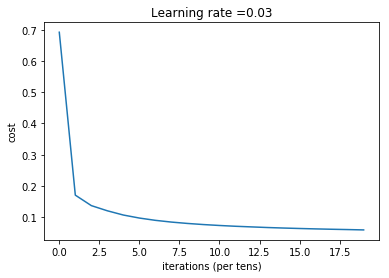

[[ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 0.78756087  1.28372827  1.00742399 ...,  0.28370321  0.14568126
   0.38709802]
 ..., 
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 1.03768974  0.7018757   0.         ...,  1.65834491  1.93017685
   1.87305719]
 [ 1.28730626  0.98728734  1.04539976 ...,  1.22131338  1.44148977
   1.54336617]]
[[ 0.          0.          0.22382056 ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 5.13109519  5.16979574  5.00183769 ...,  4.87428518  5.99357262
   5.35075704]
 ..., 
 [ 0.          0.38674319  0.         ...,  0.          0.          0.        ]
 [ 0.          0.          0.         ...,  0.          0.          0.        ]
 [ 3.0449399   3.23551223  2.77999476 ...,  1.98224462  2.65013966
   2.13902202]]
[[ 0.         

In [19]:
layers_dims = [3600, 20, 7, 5, 1] 
parameters = L_layer_model(train_x, train_y, layers_dims, num_iterations = 2000, print_cost = True)
pred_test = predict(train_x, train_y, parameters)
pred_test = predict(test_x, test_y, parameters)

In [71]:
pred_test = predict(train_x, train_y, parameters)

Accuracy: 0.997524752475


In [70]:
pred_test = predict(test_x, test_y, parameters)

Accuracy: 0.404761904762


In [116]:
import struct
def binary(num):
    return str(''.join('{:0>8b}'.format(c) for c in struct.pack('!f', num)))

In [146]:

file = open("trained_weights.txt","r")
wfile1 = open("train_weights_b1.txt","w")
wfile2 = open("train_weights_b2.txt","w")
wfile3 = open("train_weights_b3.txt","w")
wfile4 = open("train_weights_b4.txt","w")
wfile5 = open("train_weights_b5.txt","w")
data = file.read().splitlines()
for i in range(0,18000):
    wfile1.write(binary(np.float32(data[i])))
    wfile1.write("\n")
for i in range(18000,36000):
    wfile2.write(binary(np.float32(data[i])))
    wfile2.write("\n")
for i in range(36000,54000):
    wfile3.write(binary(np.float32(data[i])))
    wfile3.write("\n")
for i in range(54000,72020):
    wfile4.write(binary(np.float32(data[i])))
    wfile4.write("\n")
for i in range(72020,72213):
    wfile5.write(binary(np.float32(data[i])))
    wfile5.write("\n")


In [156]:
rfile1 = open("train_weights_b1.txt","r")
rfile2 = open("train_weights_b2.txt","r")
rfile3 = open("train_weights_b3.txt","r")
rfile4 = open("train_weights_b4.txt","r")
rfile5 = open("train_weights_b5.txt","r")
wfile1 = open("train_weights_h1.hex","w")
wfile2 = open("train_weights_h2.hex","w")
wfile3 = open("train_weights_h3.hex","w")
wfile4 = open("train_weights_h4.hex","w")
wfile5 = open("train_weights_h5.hex","w")
data1 = rfile1.read().splitlines()
data2 = rfile2.read().splitlines()
data3 = rfile3.read().splitlines()
data4 = rfile4.read().splitlines()
data5 = rfile5.read().splitlines()
for i in range(0,18000):
    string = '%08x' % int(data1[i], 2)
    print(string)
    if len(string) is not 8:
        print("Error!!!")
    wfile1.write(string)
for i in range(0,18000):
    string = '%08x' % int(data2[i], 2)
    if len(string) is not 8:
        print("Error!!!")
    wfile2.write(string)
for i in range(0,18000):
    string = '%08x' % int(data3[i], 2)
    if len(string) is not 8:
        print("Error!!!")
    wfile3.write(string)
for i in range(0,18020):
    string = '%08x' % int(data4[i], 2)
    if len(string) is not 8:
        print("Error!!!")
    wfile4.write(string)
for i in range(0,193):
    string = '%08x' % int(data5[i], 2)
    if len(string) is not 8:
        print("Error!!!")
    wfile5.write(string)
    
    
wfile1.close()
wfile2.close()
wfile3.close()
wfile4.close()
wfile5.close()

3d195f67
3c32a27f
38029ee6
bc5b771f
3c2613fb
3b0d0b97
bc91fced
3c1a2cd2
3d29a805
bd18ba77
bc15ca17
bc0989ec
3d04eccf
3c9c4d08
bcc54a22
bb9e8c32
3c2129b1
bd1d0cec
bd3bb6c5
bc1bb02a
3c0ad322
3af3983e
3d0b16b4
3bf79cda
bd0a3fda
3c807a0e
3c1171f8
3d5a3b65
3c0133b2
3b64e471
3bfb3df9
3c0ea0ad
3c82cbf8
3c8879b7
bc9209b8
3caff200
3cb78b88
bcf30d08
bc63ede6
3c1b2bc0
3ca9e2f3
bc0bfe05
3c650898
3d216ff2
bcfb9750
3b1ed33f
b9075fd3
3cd992ae
bce0d77b
3c459c57
bb98a904
3ce15626
3c9e6546
bc89c221
3c32a788
3c8f6208
bc58c0f7
3ba70f23
3cc51223
3cb9fd1c
3d42cce9
bc65d1ec
bc2100ac
3c884cd6
bc9f8501
3bfdbdf1
3aa55fa0
3c039a7f
bc8b3121
3d0de530
bcde0d31
bc02b511
bbfc553b
3b2152a1
bc9c684b
3b93a4a3
3cc44dd8
bcd04451
bca6aa59
bac64c2a
3d225d3d
bb85f8a8
3b7433c4
3cc64d8c
bc15bed9
bce6f7f1
3cbf345e
bbc0a0ef
3d5ce076
3b05840e
bc40668d
3ca5bbb1
bce29231
3c20bb4c
bd1eab51
bc181df9
bd0c5005
3c82bcde
3c872233
3c80da1b
bcaa5a7c
bd08283d
3cb9b2a9
3d06b5e2
bbbd5f47
bb0a35f9
3becbd02
bc957d40
3cd41dc4
3ccd1237
bc6be8f2
3

3a4d45cc
3b905045
bae6d308
bc577aa6
bd23f62f
3cd5a3d6
3c462e4d
bcebac21
3c9776df
3c87ddaf
bb9ef030
3c16a6d6
3cda469d
bccc5d3b
bc440a86
3d6fdd23
bcaa6ed4
bba2c6a9
bc42f471
bcc88f1b
3d407a94
3ca9b2ec
3c980149
bce489ed
3d11de34
3c04c91d
3cebb9c2
3ca84315
3ccf5035
3cabd5dc
3c3b20d3
3b80b4b1
bc67528a
bc41b4d6
bba8ce15
b9d71b63
3c4b4aed
3c0e4964
3c830c24
3c2fdbfb
3c8469f2
3bf760ca
3c945126
baa8b1e5
3b5738b6
bb5b8cd9
bcead23c
3d0d4cd5
3c71ca48
3bee3882
bba42b83
3ca8d21c
3bb151c7
bd084b43
3ab48934
3c151917
3d3d1d47
3ad4e21a
bc640f09
3c8ae389
3cbaa40b
3c759d3b
bc64f5b8
bc1a6506
bc8f7ec3
bc0fef21
3d3accd5
bb6b2781
bc7240fb
3c55d9bc
3cc0544e
bd3cea01
3bcb6498
3b0b0150
3c871fe5
3bd88a1a
3c2abd43
bc7eb0e0
3ab8d620
bc112e30
3c60f5e4
394708cf
3c5c94c1
3cedccc2
3a93fbf6
3c486925
bd3d06d7
bcceac00
bc094f3f
bbb34882
bb74394d
3b1351ac
3addf3bc
3a4f057b
3c7e7ef7
bd2ddb3a
3abeaaf6
3d10664a
bbe478fb
bd33462e
3cd386fb
3d1b436d
bcfc84b6
bcbfb04f
3c320e70
398642bf
bb789177
bcc54980
3d09a20b
3cc010fd
bd20f3cb
b

bd0b63c6
3b5a9d1a
3c59fab3
3c3cb08a
3d1dfc6a
bbf46496
3ceeb7d9
3cb717c4
bcaf30a5
3caf389d
3c97b239
3cd62cfe
bcc981bf
bb69de00
3c98f3ed
3cda5e86
bc056e29
bcf3212a
3ce24c91
b7675dbf
3c84a8dc
bced8391
bc5b60e4
bc81ad14
bcc4354f
bb61018d
bd3d3184
bd23bb5c
bb9914b9
bd0b78da
3b703181
bc13b4be
3c8795f6
3c5e49cd
3c90173a
3aaeb560
bb1c72bd
3bdfc8bd
3bee0831
3b80582a
bcb53105
bc672467
3b1cea06
3b97da67
bc59eef4
bd1054ac
3b0cd5e7
3d10bff1
3ca6516e
3ce6d374
3bb40805
3d16bb7e
3d01edc6
3ab63f17
bc61423a
3d0f5bf3
3b955ecc
3c66d9be
bc0f7b68
3ca6a1f6
bc2098f2
bb3e3a38
bcb029ff
3b9c1b6a
bc12bdb2
3b70a7c8
bc88decc
bcfaa441
3c453d21
3b7e1a78
bc5b0c2b
bc7f6d33
bd343435
3bfd8816
bce31650
3c1601ea
ba97b18d
bc1378b8
bd407937
bbebd6d3
bca18fd2
bcd45b37
bc9825fc
bbc8660b
3c2da413
bce417d8
bc0ed7a9
3c870395
bb7a74d1
bc18a6eb
3c79907a
3cbdd4e2
3c13de84
3b3ec5f9
bc1462ce
3aca3314
3cfbb9ea
bd0a8a9d
3bee0d0e
bcc2f258
bcb42785
3c172845
3c55ff7b
bc8e7254
3cfbc284
3ca370b3
3c3af102
3cbf8afb
bcde9333
3c804535
bcc876c7
3

bcd877c6
bc3630a9
3c8d07bb
bcda8f2d
bbf799ea
bc550870
bce1cca4
3c3fe345
3c8ab16a
bc163cc3
bc16fb44
bcbccca5
3a6c0f43
3a49f455
3d27f547
ba6e5490
bb961d23
3b0307b2
3beeafe1
3c13fdae
3ce39a03
bb3dad4a
3ca8e8c2
3cbe15b0
bd48d343
bab7c24f
3c00a35e
bc9e8053
3cbf74f5
bd4c2558
bca902f9
3b866eda
3d293d2b
bd10426d
3ca7293a
bce55d52
36c2bf77
3bd22c32
3cbb451b
bd8091a6
bc1def95
3c37d772
3d3be894
3d0d1394
bc0ddabf
3cde702e
bc9fccef
3c31e124
ba297902
bc9403c3
bc83f8e9
3cee88df
3ce1da45
bcab9e49
3b60a16b
3c58e722
3cdff20e
3c930022
3ce23f5b
bc7806a2
bbc67357
bb81aa3a
badd5860
3bbe9a04
3954998f
baa4be91
bce2ccb4
3c535bc8
bd20a1cc
3c4f6d26
3b2d3888
bc8081d0
bc45704d
bd003f56
bcb4c56f
bb54eaa8
bcbe40e3
3b43d603
bccd7350
bb337bee
bcf957db
bc25488f
bc647992
bcc1c425
3c735e31
3a2453cc
3d33dd12
bc5aad60
3c5ab481
3bb69919
3cde5266
3c625991
3bca0c7e
3d0f3593
3afe072c
3bb617ea
3cd50d0d
bd6a0ae6
bce9fa70
bcac980e
3c50e850
3b06043b
3d284620
bc42429b
3c04946f
3cbc580b
bcfe6348
3cfb8257
3b8797cf
bc2c5d56
3cc5e2ce
b

bb5b66ee
bd08898c
bc7ec502
3cee06d9
bd187f1d
3c82a2a7
3cfc1c7b
bc9adcc5
3c58e7f9
3ac75ea4
bbcf208f
3bba543a
bb9e040c
3996b29b
3ccccc61
bcac46e6
3ca93a8c
bbfa76a9
bb352b70
3c5a92f4
3cc969d6
3ce837f8
3b861fea
3b98fd7d
bc8c1e87
ba39688e
3a1efb3f
3ca2aaf0
badc7d9a
3d15d448
3b81caf1
3b8e9732
ba4daa31
bc82d45b
bd381beb
bc572947
3d328375
3b50a448
bd1e22cb
baf75287
3b2d57bc
bc53e3ad
3cc4c66e
bc0c195e
39409a39
3c71b83f
3bd428a1
3cf56e0b
39e20d51
39aa02a6
bbcfc5e6
3cff484a
bd09fb2c
bcacc200
bccb4eb3
3beb1e47
3d0007c2
3d0ac952
b9c124df
bc6aed49
3c5712a1
3b986ecc
3bb2a52e
3c910d6e
3c3f5368
bafab2e4
3c001c70
bd4e586d
bc45267b
bc157014
bc6a2106
bad07d06
3c52ed78
3c81eb27
bc497884
bc8ac4eb
bc22091f
3cdae346
bc5b15d0
bb57838a
bca9d40f
3b796506
bb7c0e59
3cf2cb9a
3cdfb96e
bd017291
bc3fedc1
3c96084a
3af2ff3c
3ca1dfef
bd1c4256
3c8ce5f7
bc4ca0c3
bca12ca0
3a85b0d9
bce6941e
bd058e14
bbb2ba67
bb4f5614
bb8f580d
3b89cd49
bbd8f422
3cb37e47
3d2c99bc
bc927b98
bc814f20
bc4c9e3e
bd42f5e9
bac4caf6
bd03bb0b
bcb00622
b

bcadd3ae
bd3e7dea
bd307076
3c5258fe
bbf032ad
3d0c9463
bc3d43c3
3b302c02
3cbb5541
bbbdc863
3b4625bf
bd1e6a84
bc1c56f9
bc8c395f
3c41c242
bcf13130
bac7b185
bba62889
3bb3c595
bc168f4e
bc988385
3ac829a5
3cface68
bbad9ff6
3b9daf7e
3b30cb64
3c7e3b04
bd40bb97
bd2e9b39
3d375f62
3c92faaf
bbbc5dbf
3baad1e6
3c70f104
3cbddaf7
bbd9da51
3b8edfed
3c4c7d87
3c7e76fe
baec7488
bd38ee0e
3c821d11
3cb0aaf8
bcacde50
bafa8542
bb87170b
3ca4df48
3c89dc58
3c026e4f
bc935de1
39fc060f
bc5b73c4
3bece1ab
bc8a8cb6
ba87d87c
3aa9c7ba
3c45b516
bc61df84
bb307d0b
baf8aa20
3d0116ec
3d21aa3f
3c4bc276
3cbfef03
bcbdda56
3c6a00ba
bc9e9044
bd228805
bc3e9f0d
3cf77e1c
bb9ab853
bd06ad2e
bcfb902f
3c972ffd
3d5d2469
3cc660a2
3c150c21
bc89dbec
3d5074dd
3bafd4af
3c94a49d
bc997a90
bbdec156
bc7a086f
bd28231a
3c32fe5a
3ae962b0
bb48edf0
bd241bd4
3cc7075b
3cdbdd76
bba22b79
3c13bcab
3cb63942
bc007cc8
bcd2e1ef
3bb8091b
3c86020d
bc08969d
3d519dd2
bcb0b49e
3ca11ec9
3d17074e
3c3e4e19
3c673dfd
bc4467a3
3c8a21c2
bc7655c8
bd298d47
3c679322
bb0ec931
b

3bbb3b55
3c93d31c
bb89b9fe
bc4c8ca1
bcde0aad
3c920ec1
3d08a5f7
bbb76572
bd032d11
bc5a3063
bd3edb22
bc84d156
3caeef37
bc9c867e
3ae079a8
bc401c50
3d696081
3d6ab6c3
bc98fb44
bd1c20e3
3d48be15
bb070b4d
3c97a85e
3b99a456
bc9fa2fe
bc08b322
bcab8738
bc3eaefd
3c501480
3ae63c0a
3bae03f4
bcb38e02
bc674f9a
bcbc8989
baafa9a6
bccb560a
bcb2ff66
bab6ccb0
3b62afe3
bc0f1c93
3cdcabd3
bc8d074f
bb7125f3
bcef3791
3cb24852
3c23d98e
3d04b988
bd5aabb3
bc32f662
3cad8681
bcf85b91
bd0509f5
3c20b664
bca0974f
3baf338a
3c1d159a
bc4a628f
3cf50ed6
bc87db2b
bc760ccd
bc802e23
bc24fd10
bccb3b32
3cb99ca4
3aec9311
babb8ab0
3b9eb38a
3c97a31f
bc9dfcd6
bcaa0e26
3c24122e
3ca12798
3d16a6a0
bcfdabfd
3ca45a88
3b98a5e9
bcf312b2
bc9d2f1b
bcee88aa
bc186ecc
3c89fe51
3cca24b2
3acb9f7b
3c1a5c4d
3c3a5135
3c015697
bd370012
bc9c74e0
b9223ec0
bbadfd29
bc2bdeab
bd4380f4
bc691d65
3ce4d6e4
bcfd0ab8
bd13eba5
bcad497a
3c27a70e
3c5644b0
bcc0247e
bcbc452b
3ca5445d
bc7a7511
3beb8824
bd045aa3
3be73dd2
bc8f3df6
3d8a7b91
bc4d085c
bbd147c6
3cf98e2c
3

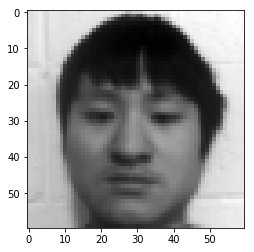

[[208]
 [210]
 [217]
 ..., 
 [220]
 [221]
 [221]]


In [18]:
f_name = "test1.jpg"
image = image = np.array(ndimage.imread(f_name, flatten=True,mode="L"))
my_image = scipy.misc.imresize(image, size=(60,60))
plt.imshow(my_image,cmap='gray')
plt.show()
my_image = my_image.reshape((60*60,1))
image_file_1 = open("image1.hex","w")
image_file_2 = open("image2.hex","w")
image_file_3 = open("image3.hex","w")
image_file_4 = open("image4.hex","w")
for i in range(0,900):
    string = '%02x' % int(my_image[i][0])
    image_file_1.write(string)
for i in range(900,1800):
    string = '%02x' % int(my_image[i][0])
    image_file_2.write(string)
for i in range(1800,2700):
    string = '%02x' % int(my_image[i][0])
    image_file_3.write(string)
for i in range(2700,3600):
    string = '%02x' % int(my_image[i][0])
    image_file_4.write(string)
image_file_1.close()
image_file_2.close()
image_file_3.close()
image_file_4.close()
print(my_image)

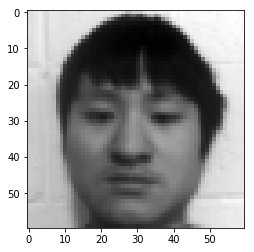

208
220
197
213
192
215
191
221


In [19]:
#my_image = "5.pgm"
#f_name = "s19"+"/" + my_image
f_name = "test1.jpg"
image = image = np.array(ndimage.imread(f_name, flatten=True,mode="L"))
my_image = scipy.misc.imresize(image, size=(60,60))
plt.imshow(my_image,cmap='gray')
plt.show()
my_image = my_image.reshape((60*60,1))
image_file_1 = open("image1.mif","w")
image_file_1.write("DEPTH = 900;")
image_file_1.write("\n")
image_file_1.write("WIDTH = 8;")
image_file_1.write("\n\n")
image_file_1.write("ADDRESS_RADIX = DEC;")
image_file_1.write("\n")
image_file_1.write("DATA_RADIX = DEC;")
image_file_1.write("\n\n")

image_file_1.write("CONTENT\n")

image_file_1.write("  BEGIN\n")
for i in range(900):
    image_file_1.write("    ")
    image_file_1.write(str(i) + " " + ":" + " " + str(int(my_image[i][0])) +";\n")
image_file_1.write("  END;")
image_file_1.close()


image_file_2 = open("image2.mif","w")
image_file_2.write("DEPTH = 900;")
image_file_2.write("\n")
image_file_2.write("WIDTH = 8;")
image_file_2.write("\n\n")
image_file_2.write("ADDRESS_RADIX = DEC;")
image_file_2.write("\n")
image_file_2.write("DATA_RADIX = DEC;")
image_file_2.write("\n\n")

image_file_2.write("CONTENT\n")

image_file_2.write("  BEGIN\n")
for i in range(900):
    image_file_2.write("    ")
    image_file_2.write(str(i) + " " + ":" + " " + str(int(my_image[i+900][0])) +";\n")
image_file_2.write("  END;")
image_file_2.close()


image_file_3 = open("image3.mif","w")
image_file_3.write("DEPTH = 900;")
image_file_3.write("\n")
image_file_3.write("WIDTH = 8;")
image_file_3.write("\n\n")
image_file_3.write("ADDRESS_RADIX = DEC;")
image_file_3.write("\n")
image_file_3.write("DATA_RADIX = DEC;")
image_file_3.write("\n\n")

image_file_3.write("CONTENT\n")

image_file_3.write("  BEGIN\n")
for i in range(900):
    image_file_3.write("    ")
    image_file_3.write(str(i) + " " + ":" + " " + str(int(my_image[i+1800][0])) +";\n")
image_file_3.write("  END;")
image_file_3.close()

image_file_4 = open("image4.mif","w")
image_file_4.write("DEPTH = 900;")
image_file_4.write("\n")
image_file_4.write("WIDTH = 8;")
image_file_4.write("\n\n")
image_file_4.write("ADDRESS_RADIX = DEC;")
image_file_4.write("\n")
image_file_4.write("DATA_RADIX = DEC;")
image_file_4.write("\n\n")

image_file_4.write("CONTENT\n")

image_file_4.write("  BEGIN\n")
for i in range(900):
    image_file_4.write("    ")
    image_file_4.write(str(i) + " " + ":" + " " + str(int(my_image[i+2700][0])) +";\n")
image_file_4.write("  END;")
image_file_4.close()


print(my_image[0][0])
print(my_image[899][0])
print(my_image[900][0])
print(my_image[1799][0])
print(my_image[1800][0])
print(my_image[2699][0])
print(my_image[2700][0])
print(my_image[3599][0])

In [177]:
rfile1 = open("train_weights_b1.txt","r")
rfile2 = open("train_weights_b2.txt","r")
rfile3 = open("train_weights_b3.txt","r")
rfile4 = open("train_weights_b4.txt","r")
rfile5 = open("train_weights_b5.txt","r")
wfile1 = open("train_weights_h1.mif","w")
wfile2 = open("train_weights_h2.mif","w")
wfile3 = open("train_weights_h3.mif","w")
wfile4 = open("train_weights_h4.mif","w")
wfile5 = open("train_weights_h5.mif","w")
data1 = rfile1.read().splitlines()
data2 = rfile2.read().splitlines()
data3 = rfile3.read().splitlines()
data4 = rfile4.read().splitlines()
data5 = rfile5.read().splitlines()
wfile1.write("DEPTH = 18000;")
wfile1.write("\n")
wfile1.write("WIDTH = 32;")
wfile1.write("\n\n")
wfile1.write("ADDRESS_RADIX = DEC;")
wfile1.write("\n")
wfile1.write("DATA_RADIX = BIN;")
wfile1.write("\n\n")

wfile1.write("CONTENT\n")

wfile1.write("  BEGIN\n")
for i in range(18000):
    wfile1.write("    ")
    wfile1.write(str(i) + " " + ":" + " " + str(data1[i]) +";\n")
wfile1.write("  END;")

wfile2.write("DEPTH = 18000;")
wfile2.write("\n")
wfile2.write("WIDTH = 32;")
wfile2.write("\n\n")
wfile2.write("ADDRESS_RADIX = DEC;")
wfile2.write("\n")
wfile2.write("DATA_RADIX = BIN;")
wfile2.write("\n\n")

wfile2.write("CONTENT\n")

wfile2.write("  BEGIN\n")
for i in range(18000):
    wfile2.write("    ")
    wfile2.write(str(i) + " " + ":" + " " + str(data2[i]) +";\n")
wfile2.write("  END;")

wfile3.write("DEPTH = 18000;")
wfile3.write("\n")
wfile3.write("WIDTH = 32;")
wfile3.write("\n\n")
wfile3.write("ADDRESS_RADIX = DEC;")
wfile3.write("\n")
wfile3.write("DATA_RADIX = BIN;")
wfile3.write("\n\n")

wfile3.write("CONTENT\n")

wfile3.write("  BEGIN\n")
for i in range(18000):
    wfile3.write("    ")
    wfile3.write(str(i) + " " + ":" + " " + str(data3[i]) +";\n")
wfile3.write("  END;")


wfile4.write("DEPTH = 18020;")
wfile4.write("\n")
wfile4.write("WIDTH = 32;")
wfile4.write("\n\n")
wfile4.write("ADDRESS_RADIX = DEC;")
wfile4.write("\n")
wfile4.write("DATA_RADIX = BIN;")
wfile4.write("\n\n")

wfile4.write("CONTENT\n")

wfile4.write("  BEGIN\n")
for i in range(18020):
    wfile4.write("    ")
    wfile4.write(str(i) + " " + ":" + " " + str(data4[i]) +";\n")
wfile4.write("  END;")


wfile5.write("DEPTH = 193;")
wfile5.write("\n")
wfile5.write("WIDTH = 32;")
wfile5.write("\n\n")
wfile5.write("ADDRESS_RADIX = DEC;")
wfile5.write("\n")
wfile5.write("DATA_RADIX = BIN;")
wfile5.write("\n\n")

wfile5.write("CONTENT\n")

wfile5.write("  BEGIN\n")
for i in range(193):
    wfile5.write("    ")
    wfile5.write(str(i) + " " + ":" + " " + str(data5[i]) +";\n")
wfile5.write("  END;")



    
wfile1.close()
wfile2.close()
wfile3.close()
wfile4.close()
wfile5.close()
rfile1.close()
rfile2.close()
rfile3.close()
rfile4.close()
rfile5.close()

In [25]:

my_label_y = [1] # the true class of your image (1 -> cat, 0 -> non-cat)

fname = "test1.jpg"
image = np.array(ndimage.imread(fname, flatten=True,mode="L"))
my_image = scipy.misc.imresize(image, size=(60,60)).reshape((60*60,1))
my_image = my_image /255.
my_predicted_image = predict(my_image, my_label_y, parameters)


[[ 0.        ]
 [ 0.        ]
 [ 0.78684611]
 [ 2.28678881]
 [ 0.        ]
 [ 0.        ]
 [ 0.19264793]
 [ 0.06853764]
 [ 1.93592908]
 [ 0.        ]
 [ 0.95716402]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 4.83921921]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]
[[ 1.05100274]
 [ 0.        ]
 [ 0.89424714]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.92802743]]
[[ 0.25040005]
 [ 0.        ]
 [ 0.47861866]
 [ 1.25446307]
 [ 0.5957427 ]]
[[ 0.58682554]]
Accuracy: 1.0


In [190]:
print(parameters["b4"])
print(parameters["W4"])


[[-1.09354565]]
[[-1.41867547  0.39255146  0.53533344  1.16476012  0.13809744]]


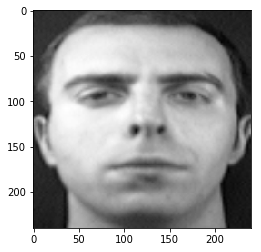

In [3]:
my_image = "5.pgm"
f_name = "s19"+"/" + my_image
image = image = np.array(ndimage.imread(f_name, flatten=True,mode="L"))
my_image = scipy.misc.imresize(image, size=(240,240))
plt.imshow(my_image,cmap='gray')
plt.show()
my_image = my_image.reshape((240*240,1))
image_file_1 = open("imagetest.mif","w")
image_file_1.write("DEPTH = 57600;")
image_file_1.write("\n")
image_file_1.write("WIDTH = 8;")
image_file_1.write("\n\n")
image_file_1.write("ADDRESS_RADIX = DEC;")
image_file_1.write("\n")
image_file_1.write("DATA_RADIX = DEC;")
image_file_1.write("\n\n")

image_file_1.write("CONTENT\n")

image_file_1.write("  BEGIN\n")
for i in range(57600):
    image_file_1.write("    ")
    image_file_1.write(str(i) + " " + ":" + " " + str(int(my_image[i][0])) +";\n")
image_file_1.write("  END;")
image_file_1.close()